<a href="https://colab.research.google.com/github/eitanfass/Tomato_quality/blob/main/Copy_of_main_code_tomato_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Importing and installing libraries


In [ ]:
!pip install opencv-python
!pip install spectral
!pip install matplotlib==3.6.1 #3.7 does not work with the tensorflow in the tomato detection model

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.9/212.9 kB 7.1 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 43.7 MB/s eta 0:00:00
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.7.1
    Uninstalling matplotlib-3.7.1:
      Successfully uninstalled matplotlib-3.7.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
seaborn 0.12.2 requires matplotlib!=3.6.1,>=3.1, but you have matplotlib 3.6.1 which is incompatible.


In [ ]:
from matplotlib import pyplot as plt
from matplotlib import cm
import pandas as pd
import pickle
import seaborn as sns
import random
import torch
from torch.utils.data.sampler import SubsetRandomSampler
from sklearn.preprocessing import MinMaxScaler
import torch.nn as nn
from google.colab import drive
drive.mount('/content/drive')
# from sklearn import preprocessing
from sklearn.metrics import pairwise_distances_argmin,mean_squared_error,silhouette_score,r2_score
import itertools
# import pylab as pl
from sklearn import datasets, linear_model
import pickle
from sklearn.preprocessing import StandardScaler
from scipy import stats
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
%matplotlib inline
from scipy import ndimage
'''
The imutils library is a series of convenience functions to make basic image processing functions such as translation,
rotation, resizing, skeletonization, and displaying Matplotlib images easier with OpenCV and Python 3.'''
import imutils
import os
import datetime
from mpl_toolkits.axes_grid1 import ImageGrid
import re
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

import glob
import math
from xgboost import XGBRegressor
import tensorflow as tf
from tensorflow import keras
from sklearn.cross_decomposition import PLSRegression
# from scipy.ndimage.morphology import binary_erosion
import itertools
from scipy.signal import argrelextrema
from tqdm import tqdm
import sys
import json
import gdown
from scipy.ndimage import binary_erosion,measurements
import cv2
from skimage.color import label2rgb
import time
from PIL import Image, ImageDraw
import skimage
from spectral import *
from skimage import io,measure, img_as_ubyte
from skimage.feature import peak_local_max
from skimage.segmentation import watershed
import scipy
import numpy as np

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#Creating classes:

##Harvest class

In [ ]:
class Harvest():

    def __init__(self, tomato_shape:str, lab_results_path,reflectence_path=None):

      self.tomato_shape=tomato_shape# tomato shape: round, roma, cherry...
      self.lab_results=pd.read_csv(lab_results_path)
      if 'B Carotene ' in self.lab_results.columns:
        self.lab_results=self.lab_results.drop(columns='B Carotene ',axis=1)#read lab results from folder
      self.lab_results = self.lab_results.reindex(columns=['ID','Weight (g)', 'Firmness','TSS','Citric Acid (%)', 'Ascrobic acid (mg/100g)', 'Lycopene (mg/100g)', 'pH'])
      self.cultivar,self.harvest_date=self._get_id()
      self.reflectence_path=reflectence_path
      if self.reflectence_path!=None:
        self.reflectence=pd.read_csv(self.reflectence_path)#read reflectence from folder
        self.reflectence=self.reflectence.drop([self.reflectence.columns[0]],axis=1)
        self.reflectence=self.reflectence.T
      else:
        self.reflectence=None
      self.image_list=None
    def _get_id(self):#gets a lab results df and from id column reads cultivar and harvest date
      self.cultivar=self.lab_results.iloc[0][0].split('_')[0]
      self.harvest_date=self.lab_results.iloc[0][0].split('_')[1:4]
      return self.cultivar,self.harvest_date

    def add_images(self,tomato_img_dict,folder='/content/drive/MyDrive/Shared_tomato/Eitan'):
      self.image_list=[]

      for id,image in tomato_img_dict.items():
        date=id.split('_')[0:3]
        cultivar=id.split('_')[4]
        if self.harvest_date==date[::-1]:
          self.image_list+=[image]
      spectral_folder=f'{folder}/tomato_stats'
      if not os.path.exists(f'{spectral_folder}/min_{self.harvest_date[0]}_{self.harvest_date[1]}_{self.harvest_date[2]}.csv'):
        self._create_stat_df_dict()
      else:
        self.spectral_stats_dict={}
        path_list=glob.glob(f'{spectral_folder}/*')
        for path in path_list:
          if f'{self.harvest_date[0]}_{self.harvest_date[1]}_{self.harvest_date[2]}' in path:
            key=path.split('/')[-1].split('_')[0]
            if key=='pixel':
              key='pixel count'
            self.spectral_stats_dict[key]=pd.read_csv(path).iloc[:,1:]
        if type(self.reflectence)!=pd.DataFrame:
          self.reflectence=self.spectral_stats_dict['mean']
          self.reflectence.columns=range(204)
      # first=int(self.image_list[0].mask_path.split('ID_')[-1].split('_')[0])
      # last=int(self.image_list[0].mask_path.split('ID_')[-1].split('_')[1])
    def _create_stat_df_dict(self):
      stats={}
      pixel_size={}
      for img in self.image_list:
        real_pixel_size=self.get_pixel_size(img)
        first=int(img.mask_path.replace('ID_','ID').split('ID')[-1].split('_')[0])
        last=int(img.mask_path.replace('ID_','ID').split('ID')[-1].split('_')[1])
        diff=last-first
        if first in pixel_size.keys():
          pixel_size[first]+=real_pixel_size
          pixel_size[first]/=2
        else:
          pixel_size[first]=real_pixel_size
        if diff+1!=len(np.unique(img.mask))-1:
          print('Warning: image name id and detected tomatoes dont match,\n this may interfere with the results')

        for label in range(1,len(np.unique(img.mask))):
          # print(i,'==========================')        # tomato_imgs[id].mask
          label_mask = (img.mask == label).astype(np.uint8)
          filtered_img = img.spectral * label_mask[..., np.newaxis]# filter out all but one tomato
          if first+label-1 in stats.keys():
            new_stats=calc_stats_per_band(filtered_img)
            pixel_count_avg=(new_stats.iloc[-1,-1]+stats[first+label-1].iloc[-1,-1])/2
            stats[first+label-1] = ((calc_stats_per_band(filtered_img)*new_stats.iloc[-1,-1])+(stats[first+label-1]*stats[first+label-1].iloc[-1,-1]))/(stats[first+label-1].iloc[-1,-1]+new_stats.iloc[-1,-1])
            stats[first+label-1]['pixel count']=[pixel_count_avg for i in new_stats['pixel count'].copy()]
            stats[first+label-1]['area(cm^2)']=[pixel_count_avg*pixel_size[first] for i in new_stats['pixel count'].copy()]
          else:
            stats[first+label-1] = calc_stats_per_band(filtered_img)

        self.stats=stats
        self.spectral_stats_dict,area,pixel_count={},[],[]
        for k,v in stats.items():
          cols=v.columns[:-1]
          v=v.T
          area+=[v.iloc[-1,-1]]
          pixel_count+=[v.iloc[-2,-1]]
          for i,col in enumerate(cols):
            if col in self.spectral_stats_dict.keys():
              self.spectral_stats_dict[col]=pd.concat([self.spectral_stats_dict[col],pd.DataFrame(data=np.array(v.iloc[i,:]),columns=[k]).T])
            else:self.spectral_stats_dict[col]=pd.DataFrame(data=np.array(v.iloc[i,:]),columns=[k]).T
        self.spectral_stats_dict['pixel count']=pd.DataFrame(data=pixel_count,columns=['pixel count'],index=range(1,len(area)+1))
        self.spectral_stats_dict['area(cm^2)']=pd.DataFrame(data=area,columns=['area(cm^2)'],index=range(1,len(area)+1))

        folder='/content/drive/MyDrive/Shared_tomato/Eitan'
        spectral_folder=f'{folder}/tomato_stats'
        if not os.path.exists(spectral_folder):
            os.makedirs(spectral_folder)
        for k,v in self.spectral_stats_dict.items():
            v.to_csv(f'{spectral_folder}/{k}_{self.harvest_date[0]}_{self.harvest_date[1]}_{self.harvest_date[2]}.csv')

    def get_pixel_size(self,img):
        image_wr=img.RGB.copy()
        image_wr *= 255
        image_wr = image_wr.astype(np.uint8)
        hsv = cv2.cvtColor(image_wr, cv2.COLOR_RGB2HSV) # convert rgb to hsv
        new_mask = cv2.inRange(hsv, (15,0,110), (255,255,255)) # mask out the white refrence. range of hsv. from hsv1 to hsv2.
        label_image = measure.label(new_mask)
        image_label_overlay = label2rgb(label_image, image=image_wr) # display the labels, abovee our original iamge (img)
        props = measure.regionprops_table(label_image, image_wr,
                                          properties= ['label',
                                                      'area', 'equivalent_diameter',
                                                      'mean_intensity', 'solidity'])
        df = pd.DataFrame(props)
        # identify label to isolate
        target_label = df['area'].idxmax()+1
        # create new mask with all zeros
        new_mask = np.zeros_like(label_image)
        # set new mask to 1 where target label is found in original mask
        new_mask[label_image == target_label] = 1

        wr_pixel_number = df['area'].max()
        if wr_pixel_number<1500 or wr_pixel_number>4200:
          wr_pixel_number=2700 # this is the wr mean pixel count for harvest 2-6 it will be set if wr was not detected
          print(f'no white refrence detected for harvest {self.harvest_date} a defult value was set')
        real_wr_area=10**2 #cm^2
        real_pixel_size = real_wr_area/wr_pixel_number

        # identify label to isolate
        target_label = df['area'].idxmax()+1

        # create new mask with all zeros
        new_mask = np.zeros_like(label_image)

        # set new mask to 1 where target label is found in original mask
        new_mask[label_image == target_label] = 1
        plt.imshow(new_mask)
        plt.show()
        return real_pixel_size


##TomatoList class

This is a Python class called `TomatoList` that receives a list of tomato harvests and has methods to perform analytical and graphing functions on the data within the harvest list. The `__init__` method initializes the class with the harvest list, an optional image of a tomato, and an optional polygon file. The class sets the harvest list and the tomato image to their respective attributes.

The `_harvest_list_to_df` method converts the harvest list to a Pandas DataFrame, which is a two-dimensional table with labeled axes. The method sets the `tomato_df` attribute to be the DataFrame containing all the harvest data, and sets the `lab_results_df` attribute to be a slice of the `tomato_df` containing only the lab results data. It also sets the `np_reflectence` and `reflectence_df` attributes to contain the reflectance data from the harvests.

The `_get_harvest_dates` method extracts the dates from the harvest list and returns them as a sorted list of date objects.

The `get_date_str` method converts the list of dates into a string format and sets it to the `date_str` attribute.

The `get_color_maps` method uses the lab results data to calculate various statistical measures and generates colormap plots of those measures. It saves the resulting data to a folder, and the next time the method is called it will load the saved data instead of recalculating everything. The method takes a list of statistic key numbers to generate colormaps for, and a boolean flag to indicate whether to plot the resulting colormaps.

The `get_spec_stats` method calculates various spectral statistics for each harvest and saves them to the `spectral_stats` attribute. It also updates the `lab_results_df` and `tomato_df` attributes to include the calculated spectral statistics.

In [ ]:

class TomatoList():
  ''' gets a harvest list and preduces all
   types of analitical and graphing functions
    on the tomato data within the harvet list '''

  def __init__(self,harvest_list,tomato_img=None ,poligon_file=None ):
    self.tomato_img=tomato_img
    self.harvest_list=harvest_list

    # self.tomato_dict=self._harvest_list_to_tomato_dict()
    # self.tomato_list=self.creat_tomato_list(self.tomato_dict)
    self._harvest_list_to_df()
    self.cultivar_list=set([i.cultivar for i in self.harvest_list])
    self.harvest_date_list=self._get_harvest_dates()
    self.get_date_str()
    bools=[]

    for harvest in self.harvest_list:
      bools+=[type(harvest.image_list)==list]
    if all(bools):
      self.get_spec_stats()
  def _get_harvest_dates(self):
    format = '%Y-%m-%d'
    harvest_dates=[datetime.datetime.strptime(f'{i.harvest_date[2]}-{i.harvest_date[1]}-{i.harvest_date[0]}', format).date() for i in self.harvest_list]
    harvest_dates.sort()
    return harvest_dates

  def _harvest_list_to_df(self)->pd.DataFrame():
    global band_depth
    count=1
    all_tomatoes=pd.DataFrame()
    for i in self.harvest_list:
      new_index=np.arange(count,count+i.lab_results.shape[0])
      i.reflectence=i.reflectence.set_index(new_index)
      i.lab_results=i.lab_results.set_index(new_index)
      reflecttence_lab_results_df=pd.concat([i.reflectence,i.lab_results],axis=1)
      all_tomatoes=pd.concat([all_tomatoes,reflecttence_lab_results_df],axis=0)
      count+=i.lab_results.shape[0]
    self.tomato_df=all_tomatoes
    self.lab_results_df=all_tomatoes.loc[:,'Weight (g)':]
    self.np_reflectence=np.array(all_tomatoes.loc[:,:band_depth-1])
    self.reflectence_df=all_tomatoes.loc[:,:band_depth-1]
  def get_date_str(self):
    date_list=[i.strftime("%m-%d-%Y") for i in self.harvest_date_list ]
    self.date_str=''
    for i in date_list:
      self.date_str+=f'{i}_'
  def get_color_maps(self,stat_key_list:list=[1,2,3,4],plot=True):#{1:'$R^2$',2:'R',3:'RMSE',4:'Spearsman corrolation'} enter the key numbers of stats to get maps for
    folder_path='/content/drive/MyDrive/Shared_tomato/Eitan/colormaps'
    waves=[float(i) for i in global_band_table['wavelangth'] ]
    columns=self.lab_results_df.columns
    to_save=True
    self.rmse_dict,self.R_dict,self.r_2_dict,self.spearsman_dict={},{},{},{}
    stats={'RMSE':self.rmse_dict,'R':self.R_dict,'R_2':self.r_2_dict,'spearsman_corrolation':self.spearsman_dict}
    for stat_name,map_dict in stats.items():
      for col in columns:
        if col=='area(cm^2)':
          continue
        if os.path.exists(f"{folder_path}/{self.date_str}{stat_name}_map_{col.replace('/',':')}.csv"):
          to_save=False
          #upload maps from storage
          map_dict[col]=np.array(pd.read_csv(f"{folder_path}/{self.date_str}{stat_name}_map_{col.replace('/',':')}.csv"))
          map_dict[col]=map_dict[col][:,1:]
    if to_save==True:
      self.r_2_dict,self.R_dict,self.rmse_dict,self.spearsman_dict=plot_NI_colormaps(self)#run NI model
      plot_colormaps(self,stat_key_list)#plot colormaps
      stats={'RMSE':self.rmse_dict,'R':self.R_dict,'R_2':self.r_2_dict,'spearsman_corrolation':self.spearsman_dict}
      #save colormap results
      for stat_name,map_dict in stats.items():
        for col,map in map_dict.items():
          temp_df=pd.DataFrame(map,columns=waves,index=waves)
          temp_df.to_csv(f"{folder_path}/{self.date_str}{stat_name}_map_{col.replace('/',':')}.csv")#save
    else: plot_colormaps(self,stat_key_list)
  def get_spec_stats(self):
    self.spectral_stats={}
    for key in self.harvest_list[0].spectral_stats_dict.keys():
      count=1
      all_tomatoes=pd.DataFrame()
      for harvest in self.harvest_list:
        new_index=np.arange(count,count+harvest.lab_results.shape[0])
        df=harvest.spectral_stats_dict[key].set_index(new_index)
        all_tomatoes=pd.concat([all_tomatoes,df],axis=0)
        count+=harvest.lab_results.shape[0]
      self.spectral_stats[key]=all_tomatoes
    self.lab_results_df['area(cm^2)']=self.spectral_stats['area(cm^2)']
    self.lab_results_df = self.lab_results_df.reindex(columns=['Weight (g)', 'Firmness', 'area(cm^2)','TSS','Citric Acid (%)', 'Ascrobic acid (mg/100g)', 'Lycopene (mg/100g)', 'pH'])
    self.tomato_df['area(cm^2)']=self.spectral_stats['area(cm^2)']



##class TomatoImage

In [ ]:
global_band_table = pd.read_csv('/content/drive/MyDrive/Shared_tomato/Eitan/chennel chart.csv')
global wave_band_table,band_depth,R_wave,G_wave,B_wave
wave_band_table=np.array(global_band_table.loc[:,global_band_table.columns[-1]])
band_depth,R_wave,G_wave,B_wave=204,80,45,20



class TomatoImage():# still needs work, in planning to have it read tomato images and segment it to indevidual sample

  def __init__(self,img_path, bands_to_wave_table, mask_path=None ,metadata=None,mask=None):
    self._load_img(img_path)#create spectral and RGB images
    if mask_path!=None:
      self.mask_path=mask_path

      self.masking(mask_path)
    self.bands_to_waves= bands_to_wave_table
    self.metadata=metadata#img matadata (optional)
  def masking(self,mask_path):
    mask=pd.read_csv(mask_path)
    cols=mask.columns
    mask=mask.drop([cols[0]],axis=1)
    self.mask=np.array(mask)#TODO loads a mask or creats one from img
    if 'LEKET' in mask_path:
      folder='/content/drive/MyDrive/Shared_tomato/Eitan'
      with open(f"{folder}/masked images/harvest_1_translation.json", "r") as f:
          harvest_1_translation = json.load(f)
      flat_mask=self.mask.flatten()
      for i,j in enumerate(flat_mask):
        flat_mask[i]=harvest_1_translation[f'{int(j)}']
      new_mask=np.resize(flat_mask, (512, 512))
      self.mask=np.array(new_mask)
  def spectral_to_RGB(self, img):
    global R_wave,G_wave,B_wave
    self.RGB=np.zeros([img.shape[0],img.shape[0],3],dtype=float)# create tamplate for RGB

    #normalize pixel value to have max value of 1 an min value of 0 for each layer
    self.RGB[:,:,0]=(img[:,:,R_wave]-img[:,:,R_wave].min())/(img[:,:,R_wave].max()-img[:,:,R_wave].min())#red
    self.RGB[:,:,1]=(img[:,:,G_wave]-img[:,:,G_wave].min())/(img[:,:,G_wave].max()-img[:,:,G_wave].min())#green
    self.RGB[:,:,2]=(img[:,:,B_wave]-img[:,:,B_wave].min())/(img[:,:,B_wave].max()-img[:,:,B_wave].min())#blue
    #TODO add save as jpeg
    return self.RGB

  def _load_img(self,img_path):#function that loads image using spectral library
    img = open_image(img_path)
    self.spectral=np.array(img.load())#read as np.array dims=[512,512,204](for specim iq images)
    self.spectral=np.rot90(self.spectral[:,:,:],3)#rotate (optional)
    self.RGB = self.spectral_to_RGB(self.spectral)#save an RGB vesion of the image



class Tomato():
  '''tomato object holds tomato instences
   with all of their information, usful for
    looking at individul samples'''
  def __init__(self,lab_results,harvest:Harvest,tomato_id:int, reflectence,tomato_img=None):
      self.reflectence=reflectence
      self.lab_results=lab_results
      self.tomato_id=self.lab_results.iloc[0]
      self.harvest_date=harvest.harvest_date
      self.cultivar=harvest.cultivar
      if tomato_img==None:
        pass
      self.tomato_img=tomato_img
  def update_ref(self, reflectence):
      pass



#functions

In [ ]:

def NDSI_model_input(tomato_list,col,tuple_list,red_index=True):
  waves=get_waves()
  lab_results=tomato_list.lab_results_df
  # lab_results=lab_results.drop(['area(cm^2)'],axis=1)

  tuple_list=NDSI_bands
  cultivar,marker_dict=cultivar_column(tomato_list)
  np_reflectence=np.array(tomato_list.reflectence_df)
  NDSI_df=NDSI_from_tuple_list(tomato_list,tuple_list)
  std=tomato_list.spectral_stats['std'][[str(i) for i in sorted(np.unique(tuple_list))]]
  NI=(np_reflectence[:,R_wave]-np_reflectence[:,G_wave])/(np_reflectence[:,G_wave]+np_reflectence[:,R_wave])
  std.columns=[f'std {int(waves[i])}nm' for i in sorted(np.unique(tuple_list))]
  temp_df=pd.concat([std,NDSI_df.set_index(std.index),lab_results],axis=1)

  temp_df['Red index']=NI
  temp_df['cultivar']=cultivar
  temp_df=temp_df[temp_df[col]>0]
  x_df=pd.concat([temp_df.iloc[:,:len(np.unique(tuple_list))+len(tuple_list)],temp_df[[item for item in  ['Red index', 'area(cm^2)'] if red_index or item != 'Red index']]],axis=1)
  y_df=temp_df.loc[:,col]
  cultivar=temp_df['cultivar'].copy()
  feature_names=x_df.columns
  return x_df,y_df,feature_names,cultivar

def model_input(tomato_list,col,selcted_bands,red_index=True,scale=True):
  cultivar,marker_dict=cultivar_column(tomato_list)
  np_reflectence=np.array(tomato_list.reflectence_df)
  std=tomato_list.spectral_stats['std'][[str(i) for i in sorted(curent_bands)]]
  NI=(np_reflectence[:,R_wave]-np_reflectence[:,G_wave])/(np_reflectence[:,G_wave]+np_reflectence[:,R_wave])
  std.columns=[f'std {i}' for i in sorted(curent_bands)]
  temp_df=pd.concat([std,tomato_list.tomato_df],axis=1)
  temp_df['Red index']=NI
  temp_df['cultivar']=cultivar
  temp_df=temp_df[temp_df[col]>0]
  x_df=pd.concat([temp_df.iloc[:,[i+len(std.columns) for i in sorted(curent_bands)]],temp_df[std.columns]],axis=1)

  x_df.loc[:,'area(cm^2)']=temp_df['area(cm^2)'].copy()
  if red_index==True:
    x_df.loc[:,'Red index']=temp_df['Red index'].copy()
  x_df.columns=[str(i) for i in x_df.columns]
  y_df=temp_df.loc[:,col]
  cultivar=temp_df['cultivar'].copy()
  scaler=MinMaxScaler()

  feature_names=x_df.columns
  if scale==True:
    x_df=np.array(scaler.fit_transform(x_df))
  return x_df,y_df,feature_names,cultivar

def save_new_split(col,train_split,test_split):
  train_split=[i for i in sorted(y_train.index)]
  test_split=[ i for i in sorted(y_test.index)]

  with open(f'/content/drive/MyDrive/Shared_tomato/Eitan/tarin_test_split {col.replace("/",":")}.pkl', 'wb') as f:
      pickle.dump((train_split, test_split), f)

def get_train_test_split(col, x_df, y_df):
    with open(f"/content/drive/MyDrive/Shared_tomato/Eitan/tarin_test_split {col.replace('/',':')}.pkl", 'rb') as f:
        train_split, test_split = pickle.load(f)
    x_train = x_df.loc[train_split]
    x_test = x_df.loc[test_split]
    y_train = y_df.loc[train_split]
    y_test = y_df.loc[test_split]
    return x_train, x_test, y_train, y_test

def NDSI_from_tuple_list(tomato_list,tuple_list):
  waves=get_waves()
  ref=np.array(tomato_list.reflectence_df)
  NDSI=pd.DataFrame()
  for band1,band2 in sorted(tuple_list, key=lambda x: (x[0], x[1])):
    NDSI[f'{int(waves[band1])}nm,{int(waves[band2])}nm']=(ref[:,band1]-ref[:,band2])/(ref[:,band1]+ref[:,band2])
  return NDSI


def get_waves():
  start = 397.32
  stop = 1003.58
  step = int((stop - start) / 204 * 1000) / 1000

  arr = np.arange(start, stop -1, step)
  wavelengths = np.round(arr, decimals=1)
  return wavelengths
def calc_stats_per_band(filtered_img):
    np_image_array = filtered_img
    band_depth = np_image_array.shape[2]
    stats = {}
    for i in range(band_depth):
        flat = np_image_array[:, :, i].flatten()
        flat[flat==0]=None
        flat = flat[~np.isnan(flat)]
        stats[f"{i}"] = {
            "min": np.nanmin(flat),
            "max": np.nanmax(flat),
            "mean": np.nanmean(flat),
             "median": np.nanmedian(flat),
            "std": np.nanstd(flat),
            "pixel count": len(flat)

        }
    return pd.DataFrame.from_dict(stats, orient="index")


def create_Tomato_instances(harvest:Harvest)->dict:
  '''function that gest a harvest
   object and creates tomato instences
   in a dictionery with the key value the id'''
  T={}
  for i in range(harvest.lab_results.shape[0]):
    T[i]=Tomato(harvest.lab_results.iloc[i],harvest,i, harvest.reflectence.iloc[i])
  return T

def NI_loop(tomato_list, col:str):
  ''' input TomatoList obj,
  returns r_2,rmse colormaps dict
  with lab result parametrs as keys '''

  global band_depth
  r_2 = np.arange(band_depth*band_depth).reshape(band_depth, band_depth)
  r_2=np.float32(r_2)
  rmse =r_2.copy()
  spear=r_2.copy()
  R=r_2.copy()
  temp_df=pd.concat([tomato_list.reflectence_df,tomato_list.lab_results_df[col]],axis=1)
  temp_df=temp_df[temp_df[col]>0].dropna(axis=0)
  np_results=np.array(temp_df[col])
  np_reflectence=np.array(temp_df.loc[:,:(band_depth-1)])
  for j in range(band_depth):#running all combinations
    for y in range(band_depth):
      if j==y:
        rmse[y,j],spear[y,j],r_2[y,j],R[y,j]=0,0,0,0
        continue
      NI=(np_reflectence[:,y]-np_reflectence[:,j])/(np_reflectence[:,y]+np_reflectence[:,j])
      slope, intercept, R[y,j], p_value, std_err = stats.linregress(NI,np_results)
      r_2[y,j] =  R[y,j]**2
      rmse[y,j] =np.sqrt(((np_results-(intercept + (slope *NI)))**2).mean())
      spear[y,j],p_val= stats.spearmanr(NI, b=np_results)
  return r_2,R,rmse,spear


def plot_NI_colormaps(tomato_list):#),stat_key_list,plot):#{1:'$R^2$',2:'R',3:'RMSE',4:'Spearsman corrolation'} stats to dispaly
  global global_band_table
  waves=[float(i) for i in global_band_table['wavelangth'] ]
  colormaps=[cm.get_cmap('RdBu', 256)]
  r_2_dict,R_dict, rmse_dict,spear_dict={},{},{},{}
  stat_dict={1:'$R^2$',2:'R',3:'RMSE',4:'Spearsman corrolation'}

  for col in tomato_list.lab_results_df.columns:
    r_2,R,rmse,spear=NI_loop(tomato_list, col)
    r_2_dict[col],R_dict[col], rmse_dict[col],spear_dict[col]=r_2,R,rmse,spear
  return r_2_dict,R_dict, rmse_dict,spear_dict

def plot_all_reflectence(tomato_list):# plots all reflectence data in the above format, wave df is requaired
  global global_band_table,band_depth
  fig, ax = plt.subplots(figsize=(6,6))
  df=tomato_list.reflectence_df.T
  x=list(np.arange(0,band_depth,50,dtype=int))
  for i in df.columns:
    ax.plot(df[i])
    plt.axvline(x=23,color='b',lw=5)
    plt.axvline(x=47,color='g',lw=5)
    plt.axvline(x=80,color='r',lw=5)
  ax.set(xlabel='Wavelangth (nm)',
        ylabel='Reflectence'
        )
  plt.xticks(ticks=x, labels =global_band_table.loc[x]['wavelangth']//10*10)


def max_bands_from_colormaps(map_dict:dict,number_of_max_values=3)->dict:
  '''function thar receives a colormap
   and the number of max value and finds
    the band combination for them'''
  bands={}
  for k,v in map_dict.items():
    map=v.copy()
    counter,i=0,0
    while i<number_of_max_values+1:
      b1,b2=np.unravel_index(map.argmax(), map.shape)
      if np.abs( b1-b2)>4:
        bands[f'{k}-max {i+1}']= (b1,b2)
        i+=1

      map[b1,b2]=0
  return bands

def regretionplot(tomato_list,red_index=False, number_of_max_values=1,save_to_path='/content/drive/MyDrive/Shared_tomato/Eitan/plots/'):
  '''creats a regretssion plot,
   colors the samples by their red index values from green to red,
    data_dict in format of add_res_to_ref function'''
  R_2_map_dict=tomato_list.r_2_dict
  global global_band_table,R_wave,G_wave,band_depth
  if red_index:
    b1,b2=R_wave,G_wave
    number_of_max_values=1
    x_tag=  'Red -> Green Index'
  else:bands=max_bands_from_colormaps(R_2_map_dict,number_of_max_values)
  waves=[float(i) for i in global_band_table['wavelangth'] ]
  palette = {1:"lime",2:"orange",3:"r"}#,4:"red"}#,2:"orangered",4:"darkorange",6:"gold"
  for col in tomato_list.tomato_df.loc[:,'Weight (g)':].columns:#loop on the columns names of results
    temp_df=pd.concat([tomato_list.reflectence_df,tomato_list.lab_results_df[col]],axis=1)
    temp_df=temp_df[temp_df[col]>0].dropna(axis=0)
    np_results=np.array(temp_df[col])# created a clean np array of results with no nan None or negetive values
    np_reflectence=np.array(temp_df.loc[:,:(band_depth-1)])
    color_grups=get_color_groups(tomato_list)
    color_grups=color_grups[color_grups[col]>0]
    for i in range(1,number_of_max_values+1):
      if not red_index:
        b1,b2=bands[f'{col}-max {i}']
        x_tag=  f"NI ({waves[b1]:.0f}nm,{waves[b2]:.0f}nm)"
      NI=((np_reflectence[:,b2]-np_reflectence[:,b1])/(np_reflectence[:,b1]+np_reflectence[:,b2]))
      data_dict={x_tag:NI ,col:np_results, 'Color':color_grups['color']}
      data=pd.DataFrame(data_dict)
      slope, intercept, r_value, p_value, std_err = stats.linregress(data[x_tag],data[col])
      sns.lmplot(x=x_tag, y=col, hue="Color", data=data,palette=palette, fit_reg=False, legend=False)#x_estimator=np.mean
      plt.rcParams.update({'figure.figsize':(20,15), 'figure.dpi':100})
      ax = sns.regplot(x=x_tag , y=col, data=data, scatter_kws={"zorder":-1}, line_kws={'color': 'black','label':"y={0:.1f}x+{1:.1f}".format(slope,intercept)})
      ax.text(0.18, 1, "R= {:.2f}   P-value= {:.4f}".format(r_value,p_value), ha="left", va="top",fontsize=15, transform=ax.transAxes)
      # ax.text(0.40, 0.95, "bands=({:.0f}nm,{:.0f}nm)".format(waves[b1],waves[b2]), ha="left", va="top",fontsize=10, transform=ax.transAxes)
      path_col=col.replace('/',':')
      plt.savefig(f'{save_to_path}{tomato_list.date_str}_regretion_plot_{path_col}_N={len(data[col])}')

def get_color_groups(tomato_list,color_groups:int=3,keep_red_index=False)->pd.DataFrame():# helper function to get color groups for plotting
  global band_depth,R_wave,G_wave
  np_ref=np.array(tomato_list.tomato_df.loc[:,:(band_depth-1)])
  l=(np_ref[:,R_wave]-np_ref[:,G_wave])/(np_ref[:,R_wave]+np_ref[:,G_wave])
  ref_new=tomato_list.tomato_df.loc[:,:(band_depth-1)]
  ref_new['Red Index']=l
  l1=l-l.min()
  lab_results=tomato_list.tomato_df.loc[:,'Weight (g)':]
  lab_results['Red Index']=l1
  num=(l1.max()/color_groups)+0.00001
  l1=(l1//num)+1
  lab_results['sample']=range(np_ref.shape[0])
  sorted_by_color=lab_results.sort_values(by=['Red Index'])
  sorted_by_color['color']=range(np_ref.shape[0])
  sorted_by_color['color']=sorted_by_color['color']//(np_ref.shape[0]/color_groups)+1
  final_df=sorted_by_color.sort_values(by=['sample'])
  if keep_red_index:
    final_df=final_df.drop(['sample'],axis=1)
  else:final_df=final_df.drop(['Red Index','sample'],axis=1)
  return final_df
def plot_colormaps(tomato_list, stat_key_list, save_to_path='/content/drive/MyDrive/Shared_tomato/Eitan/plots/'):
    global global_band_table
    stat_name_dict = {1:'$R^2$', 2:'R', 3:'RMSE', 4:'Spearsman corrolation'}
    stat_dict = {1:tomato_list.r_2_dict, 2:tomato_list.R_dict, 3:tomato_list.rmse_dict, 4:tomato_list.spearsman_dict}
    waves = [float(i) for i in global_band_table['wavelangth']]
    colormaps = [cm.get_cmap('RdBu', 256)]
    for stat_name, map_dict in zip(stat_name_dict.items(), stat_dict.items()):
        if stat_name[0] in stat_key_list:
            for col, map in map_dict[1].items():
                data = pd.DataFrame(data=map, index=waves, columns=waves)
                mask = np.tri(data.shape[0], k=-1)
                data = np.ma.array(data, mask=mask)
                fig, axs = plt.subplots(1, len(colormaps), figsize=(6,5),
                                        constrained_layout=False, squeeze=False)
                for [ax, cmap] in zip(axs.flat, colormaps):
                    if stat_name[1] == '$R^2$':
                        vmin, vmax = 0, 1
                    elif stat_name[1] == 'R':
                        vmin, vmax = -1, 1
                    else:
                        vmin, vmax = np.nanmin(data), np.nanmax(data)

                    psm = ax.pcolormesh(waves, waves, data, cmap=cmap, rasterized=True, vmin=vmin, vmax=vmax)
                    fig.colorbar(psm, ax=ax)
                plt.title(f'{stat_name[1]} of NDSI\n with {col}', fontsize=20)
                plt.xlabel('Band 1 (nm)', fontsize=15)
                plt.ylabel('Band 2 (nm)', fontsize=15)
                plt.show()
                path_col = col.replace('/', ':')
                fig.savefig(f'{save_to_path}{tomato_list.date_str}colormap_plot_{stat_name[1]}_with_{path_col}.png')


In [ ]:
def max_r2_from_NI(tomato_list)->dict:
  '''function thar receives a tomato list with calculated r_2_dict(from colormap)
    and finds the best R2 for them in the NI model'''
  r_2_map_dict=tomato_list.r_2_dict
  rmse_map_dict=tomato_list.rmse_dict
  rmse,R={},{}
  for k,v in r_2_map_dict.items():
    map=v.copy()
    counter,i=0,0
    b1,b2=1,2
    while  np.abs( b1-b2)<5:
      b1,b2=np.unravel_index(map.argmax(), map.shape)
      if np.abs( b1-b2)>=5:
        R[k]= map[b1,b2]
        rmse[k]=rmse_map_dict[k][b1,b2]
      map[b1,b2]=0
  return R,rmse

In [ ]:
def cultivar_column(tomato_list):
  marker_list=['o','o','o','o','o','o','<','8','s','*','o']
  harvest_list=tomato_list.harvest_list
  cultivar=[]
  for harvest in harvest_list:
    cultivar += [harvest.lab_results.iloc[i][0].split('_')[0] if not pd.isna(harvest.lab_results.iloc[i][0]) else np.nan for i in range(len(harvest.lab_results.index))]
  marker_dict={}
  harvest_size=[harvest.lab_results.shape[0] for harvest in tomato_list.harvest_list]
  cultivar_list=[]
  for size,cult,i in zip(harvest_size,cultivar,range(len(cultivar))):
      marker_dict[cult]=marker_list[i]
      cultivar_list+=[cult for i in range(size)]
  return cultivar,marker_dict
def date_column(tomato_list):
  marker_dict={}
  marker_list=['o','o','o','o','o','o','<','8','s','*','o']
  harvest_dates=[f'{harvest.harvest_date[1]}/{harvest.harvest_date[2]} {harvest.cultivar}' for harvest in tomato_list.harvest_list]
  harvest_size=[harvest.lab_results.shape[0] for harvest in tomato_list.harvest_list]
  harvest_dates_list=[]
  for size,date,i in zip(harvest_size,harvest_dates,range(len(harvest_dates))):
      harvest_dates_list+=[date for i in range(size)]
      marker_dict[date]=marker_list[i]
  return harvest_dates_list,marker_dict

with open('/content/drive/MyDrive/Shared_tomato/Eitan/tarin_test_split.pkl', 'rb') as f:
    train_split, test_split = pickle.load(f)

##plot feature impoprtence

##regretion plots by harvest and by cultivar function

In [ ]:
def regretion_date_cultivar(tomato_list,by_cultivar=True,all_reg_lines=True ,big_reg_line=False,number_of_max_values=1,save_to_path='/content/drive/MyDrive/Shared_tomato/Eitan/plots/'):
  if by_cultivar:
    sort_by_cultivar,marker_dict=cultivar_column(tomato_list)
  else: sort_by_cultivar,marker_dict=date_column(tomato_list)
  R_2_map_dict=tomato_list.r_2_dict
  bands=max_bands_from_colormaps(R_2_map_dict,number_of_max_values)
  waves=[float(i) for i in global_band_table['wavelangth'] ]
  # palette = {1:"lime",2:"orange",3:"r"}#,4:"red"}#,2:"orangered",4:"darkorange",6:"gold"
  for col in tomato_list.tomato_df.loc[:,'Weight (g)':].columns:#loop on the columns names of results
    for j in range(1,number_of_max_values+1):
      if by_cultivar:
        sort_by_cultivar,marker_dict=cultivar_column(tomato_list)
      else: sort_by_cultivar,marker_dict=date_column(tomato_list)
      b1,b2=bands[f'{col}-max {j}']
      temp_df=pd.concat([tomato_list.reflectence_df,tomato_list.lab_results_df[col]],axis=1)
      temp_df=temp_df[temp_df[col]>0].dropna(axis=0)
      np_results=np.array(temp_df[col])# created a clean np array of results with no nan None or negetive values
      np_reflectence=np.array(temp_df.loc[:,:(band_depth-1)])
      color_grups=get_color_groups(tomato_list)
      color_grups=color_grups[color_grups[col]>0]
      x_tag=  f"NI ({waves[b1]:.0f}nm,{waves[b2]:.0f}nm)"
      sort_by_cultivar=[sort_by_cultivar[i-1] for i in temp_df.index]
      NI=((np_reflectence[:,b2]-np_reflectence[:,b1])/(np_reflectence[:,b1]+np_reflectence[:,b2]))
      data_dict={x_tag:NI ,col:np_results, 'Color':sort_by_cultivar}
      data=pd.DataFrame(data_dict)
      sort_by_cultivar=[]
      for i in data.loc[:,'Color']:
        slope, intercept, r_value, p_value, std_err = stats.linregress(data[data['Color']==i][x_tag],data[data['Color']==i][col])# add R value to legend
        sort_by_cultivar+=[f'{i} R={r_value:0.2f}']# add R value to legend
      data['Color']=sort_by_cultivar# add R value to legend
      marker_list=['o','o','o','o','<','8','s','*','^','o']
      slope, intercept, r_value, p_value, std_err = stats.linregress(data[x_tag],data[col])
      sns.lmplot(x=x_tag, y=col, hue="Color", data=data,markers=marker_list[:len(set(data['Color']))], scatter_kws={"s": 50}, legend=False, col=None, fit_reg=all_reg_lines)#x_estimator=np.mean
      plt.rcParams.update({'figure.figsize':(20,15), 'figure.dpi':100})
      if big_reg_line:
        ax = sns.regplot(x=x_tag , y=col, data=data, scatter=False,  scatter_kws={"zorder":-1}, line_kws={'color': 'black','label':"y={0:.1f}x+{1:.1f}".format(slope,intercept)})
        ax.text(0.18, 1.0, "R= {:.2f}   P-value= {:.4f}".format(r_value,p_value), ha="left", va="top",fontsize=12, transform=ax.transAxes)
      else:
        ax = plt.gca()
        ax.text(0.18, 1.0, "R= {:.2f}   P-value= {:.4f}".format(r_value,p_value), ha="left", va="top",fontsize=12, transform=ax.transAxes)
      path_col=col.replace('/',':')
      plt.legend(loc='best', bbox_to_anchor=(0.55, 0.7))
      if by_cultivar:
        if all_reg_lines:
          if big_reg_line:
            plt.savefig(f'{save_to_path}{tomato_list.date_str}_regretion_by_cultivar_all_reg_lines_max-{j}_plot_{path_col}_N={len(data[col])}')
          else : plt.savefig(f'{save_to_path}{tomato_list.date_str}_regretion_by_cultivar_small_reg_lines_max-{j}_plot_{path_col}_N={len(data[col])}')
        elif big_reg_line:
          plt.savefig(f'{save_to_path}{tomato_list.date_str}_regretion_by_cultivar_one_line_max-{j}_plot_{path_col}_N={len(data[col])}')
        else: plt.savefig(f'{save_to_path}{tomato_list.date_str}_regretion_by_cultivar_max-{j}_plot_{path_col}_N={len(data[col])}')
      else:
        if all_reg_lines:
          if big_reg_line:
            plt.savefig(f'{save_to_path}{tomato_list.date_str}_regretion_all_reg_lines_by_date_max-{j}_plot_{path_col}_N={len(data[col])}')
          else : plt.savefig(f'{save_to_path}{tomato_list.date_str}_regretion_small_reg_lines_by_date_max-{j}_max-{j}_plot_{path_col}_N={len(data[col])}')
        elif big_reg_line:
          plt.savefig(f'{save_to_path}{tomato_list.date_str}_regretion_one_line_by_date_max-{j}_plot_{path_col}_N={len(data[col])}')
        else: plt.savefig(f'{save_to_path}{tomato_list.date_str}_regretion_by_date_max-{j}_plot_{path_col}_N={len(data[col])}')

##histogram functions

In [ ]:
def histogram_by_color(tomato_list,col,color_grups=3
                       ,palette=['lime','orange','r'],
                       save_to_path='/content/drive/MyDrive/Shared_tomato/Eitan/plots/'):# TODO make a few paletts for user to call optinal

  if color_grups!=len(palette):
    print('palette and color groups must match')
    return
  data=get_color_groups(tomato_list,color_grups)
  data=data[data[col]>0]
  start=data[col].min()
  end=data[col].max()
  step=(end-start)/10
  fig, ax = plt.subplots(1,  figsize=(7,4))
  for i,c in zip(range(color_grups),palette):

    bins=np.arange(start,end+step,step)
    start+=step/color_grups
    end+=step/color_grups
    c_grup=data[col][data['color']==(i+1)]
    ax.hist(c_grup,color=c,label=f"STD={c_grup.std():.2f} Mean={c_grup.mean():.1f}" ,bins=bins,width=step/color_grups)
  ax.set_xlabel(col, fontsize = 20)
  ax.set_ylabel('number of samples', fontsize = 20)
  ax.set_title(f'{col} distrubution\n N={len(data[col])} STD={data[col].std():.2f} Mean={data[col].mean():.1f}', fontsize = 25)
  ax.legend(fontsize=15)
  path_col=col.replace('/',':')
  plt.savefig(f'{save_to_path}{tomato_list.date_str}_linear_hist_{path_col}_N={len(data[col])}')
def category_histograms(tomato_list,col,categories=5,
                        color_grups=3,palette=['lime','orange','r'],
                        save_to_path='/content/drive/MyDrive/Shared_tomato/Eitan/plots/'):
  if color_grups!=len(palette):
    print('palette and color groups must match')
    return
  fig, ax = plt.subplots(1,  figsize=(6,4.5))
  data=get_color_groups(tomato_list,color_grups)
  data=data[data[col]>0]
  start=data[col].min()
  end=data[col].max()
  step=(end-start)/categories
  bins=[f'({start+(step*(i)):.1f}-{start+(step*(i+1)):.1f})' for i in range(categories)]
  ticks=np.arange(categories)
  for k,c in zip(range(color_grups),palette):
    bars_dict={}
    c_grup=data[col][data['color']==(k+1)]
    color_group=c_grup.copy()
    for i in range(categories):
      for j in range(len(c_grup)):
        if type(c_grup.iloc[j])!=str:
          if  c_grup.iloc[j]>=(start+(step*i)) and c_grup.iloc[j]<=(start+(step*(i+1))):
            c_grup.iloc[j]=f'({start+(step*(i)):.1f}-{start+(step*(i+1)):.1f})'
    counts=c_grup.value_counts()
    for bin in bins:
      if bin in counts.index:
        bars_dict[bin]=counts.loc[:][bin]
      else: bars_dict[bin]=0
    bar_width=categories/(color_grups*(categories+2))
    plt.bar(ticks+(k*bar_width),bars_dict.values(),width = bar_width, color = c, edgecolor = 'black', capsize=7,label=f"STD={color_group.std():.2f} Mean={color_group.mean():.1f}" )
    ax.set_xlabel(col, fontsize = 14)
    ax.set_ylabel('number of samples', fontsize = 14)
    ax.set_title(f'{col} distrubution\n N={len(data[col])} STD={data[col].std():.2f} Mean={data[col].mean():.1f}', fontsize = 16)
    ax.legend(fontsize=12)

    plt.xticks(ticks+(k*bar_width/2),bins)
    path_col=col.replace('/',':')
    plt.savefig(f'{save_to_path}{tomato_list.date_str}_categories_hist_{path_col}_N={len(data[col])}')

def histograms(tomato_list, color_grups=3 ,categories=None,palette=['lime','orange','r']):

  for col in tomato_list.lab_results_df.columns:
    if categories==None:
      histogram_by_color(tomato_list,col,color_grups ,palette)
    else: category_histograms(tomato_list,col,categories,color_grups,palette)

def show_lab_results_corrolations(tomato_list,palette = {1:"lime",2:"orange",3:"r"},save_to_path='/content/drive/MyDrive/Shared_tomato/Eitan/plots/'):
  plots_created=[]
  waves=[float(i) for i in global_band_table['wavelangth'] ]
  for col1 in tomato_list.tomato_df.loc[:,'Weight (g)':].columns:#loop on the columns names of results
    for col2 in tomato_list.tomato_df.loc[:,'Weight (g)':].columns:#loop on the columns names of results
      if col1==col2 or (col1,col2)in plots_created or (col2,col1)in plots_created:
        continue
      plots_created+=[(col1,col2)]
      temp_df=get_color_groups(tomato_list)
      temp_df=temp_df[temp_df[col1]>0].dropna(axis=0)
      temp_df=temp_df[temp_df[col2]>0].dropna(axis=0)
      np_results1=np.array(temp_df[col1])# created a clean np array of results with no nan None or negetive values
      np_results2=np.array(temp_df[col2])# created a clean np array of results with no nan None or negetive values
      data_dict={col1:np_results1 ,col2:np_results2, 'Color':temp_df['color']}
      data=pd.DataFrame(data_dict)
      slope, intercept, r_value, p_value, std_err = stats.linregress(data[col1],data[col2])
      sns.lmplot(x=col1, y=col2, hue="Color", data=data,palette=palette, fit_reg=False, legend=False)#x_estimator=np.mean
      plt.rcParams.update({'figure.figsize':(7,4), 'figure.dpi':100})
      ax = sns.regplot(x=col1 , y=col2, data=data, scatter_kws={"zorder":-1}, line_kws={'color': 'black','label':"y={0:.1f}x+{1:.1f}".format(slope,intercept)})
      ax.set(titel= "R=: {:.2f}   P-value= {:.4f} ".format(r_value,p_value),fontsize=15)#, ha="left", va="top",fontsize=15, transform=ax.transAxes)
      path_col1=col1.replace('/',':')
      path_col2=col2.replace('/',':')
      plt.savefig(f'{save_to_path}{tomato_list.date_str}_lab_result_corrolation_plot_{path_col1}_with_{path_col2}')


In [ ]:
def plot_spectral_feturs(tomato_list,bands):

  tomato_list.get_spec_stats()
  # tomato_list=tomato_list1234
  x=list(np.arange(0,band_depth,40,dtype=int))
  fig, ax = plt.subplots(figsize=(6,4))
  for i in range(tomato_list.spectral_stats['mean'].shape[0]):
    ax.plot(tomato_list.spectral_stats['mean'].iloc[i,:],color='gray',alpha=0.5,lw=0.7)#),color='m',label='mean')
  cols=tomato_list.spectral_stats['mean'].columns
  ax.set(xlabel='Wavelangth (nm)',
  ylabel='Reflectence',
  title=f'spectral reflectence with featurs marked')
  ax.plot(tomato_list.spectral_stats['mean'][cols].mean(),c='k',lw=3,label='mean')
  palette = plt.get_cmap('tab20')
  palette = [palette(i) for i in range(len(bands))]
  for band,c in zip(bands,palette):
    ax.axvline(x=band,color=c,lw=3,label=int(get_waves()[band]))
  plt.xticks(ticks=x, labels =global_band_table.loc[x]['wavelangth']//10*10)
  plt.legend()

In [ ]:
def image_grid(image_list:list,nrows_ncols:tuple=None, show_axes:bool=False,figsize:tuple= (20, 20),axes_pad=(-0.3,0 ))->plt.figure:
    if nrows_ncols==None:
      if len(image_list)>8:
          rows=3
          cols=math.ceil(len(image_list)/rows)
      else:
        rows=2
        cols=math.ceil(len(image_list)/rows)
    else: rows,cols=nrows_ncols
    fig = plt.figure(figsize=figsize)
    grid = ImageGrid(fig, 111,
                    nrows_ncols=(rows, cols),axes_pad=axes_pad)  # creates 2x2 grid of axes
    while len(image_list)!=rows*cols:
      white_img=(np.ones(image_list[0].shape)*255).astype('uint8')
      image_list.append(white_img)
    for ax, im in zip(grid, image_list):
        if show_axes==False:
          ax.set_axis_off()
        ax.imshow(im)
    plt.show();

def path_to_image_array(path_list):
  images = []
  for path in path_list:
    # Open the image file
    img=io.imread(path)
    image_array = np.array(img)
    # Append the image to the list
    images.append(image_array)
  return images
def multi_plot2(x_pad=0,y_pad=0):
  save_to_path='/content/drive/MyDrive/Shared_tomato/Eitan/plots/'
  path_list = glob.glob(f'{save_to_path}*.*')
  temp1,temp2='',''
  img_path_list=[]
  path_list=sorted(path_list)
  image_array=[]


  for path in path_list:

    if 'Carotene'  in path:
      continue
    img_path_list+=[path]
  image_array=path_to_image_array(img_path_list)
  image_grid(image_array,axes_pad=(x_pad,y_pad ))
  img_path_list=[]
  img_path_list+=[path]
  os.system('rm -rf /content/drive/MyDrive/Shared_tomato/Eitan/plots/*')


def multi_plot(x_pad=0,y_pad=0,  img_order=['Weight (g)', 'Firmness', 'area(cm^2)',
      'TSS','Citric Acid (%)', 'Ascrobic acid (mg:100g)', 'Lycopene (mg:100g)', 'pH'],
                 save_to_path='/content/drive/MyDrive/Shared_tomato/Eitan/plots/',delete_figs=True,nrows_ncols=None):

  path_list = glob.glob(f'{save_to_path}*.*')
  temp1,temp2='',''
  img_path_list=[]
  path_list=sorted(path_list)
  image_array=[]


  for trait in img_order:
    for path in path_list:

      if 'Carotene'  in path:
        continue
      if trait in path:
        img_path_list+=[path]


  image_array=path_to_image_array(img_path_list)
  image_grid(image_array,axes_pad=(x_pad,y_pad ),nrows_ncols=nrows_ncols)
  if delete_figs:
    os.system(f'rm -rf {save_to_path}*')


#creating Harvest objects


In [ ]:
harvest_1_lab_results_path='/content/drive/MyDrive/Shared_tomato/1_Data_shared/2021/2021_08_15/LEKET/Lab/2021_08_15_LEKET_ID1_27.csv'
# harvest_1_reflectence_path="/content/drive/MyDrive/Shared_tomato/1_Data_shared/2021/2021_08_15/LEKET/Spectral/2021_08_15_Leket_Reflectence_Mean_ID1_27.csv"
harvest_1=Harvest('Roma',harvest_1_lab_results_path)#,harvest_1_reflectence_path)


In [ ]:
harvest_2_lab_results_path='/content/drive/MyDrive/Shared_tomato/1_Data_shared/2021/2021_10_13/ROMA_AS200/Lab/2021_10_13 _ROMA_AS200_ID1_320_All.csv'
# harvest_2_reflectence_path='/content/drive/MyDrive/Shared_tomato/1_Data_shared/2021/2021_10_13/ROMA_AS200/Spectral/2021_10_13_ROMA_AS200_Reflectence_ID1_320.csv'
harvest_2=Harvest('Roma',harvest_2_lab_results_path)#,harvest_2_reflectence_path)

In [ ]:
harvest_3_lab_results_path="/content/drive/MyDrive/Shared_tomato/1_Data_shared/2022/22_6_22/SOLI_256/Lab/chemical_results_soli_id_1_40.csv"
# harvest_3_reflectence_path="/content/drive/MyDrive/Shared_tomato/1_Data_shared/2022/22_6_22/SOLI_256/Spectral/2022_6_22_SOLI_Medien_ID1_40.csv"
harvest_3=Harvest('Singel Round',harvest_3_lab_results_path)#,harvest_3_reflectence_path)


In [ ]:
# harvest_4_reflectence_path='/content/drive/MyDrive/Shared_tomato/1_Data_shared/2022/19_10_22/SOLI_industrial/Spectral/Lab_Images/2022_10_19_SOLI_industial_Mean_ID1_60.csv'
harvest_4_lab_results_path='/content/drive/MyDrive/Shared_tomato/1_Data_shared/2022/19_10_22/SOLI_industrial/Lab/2022_10_19_Chemical_Results_SOLI_industrial_ID1_60.csv'
harvest_4=Harvest('Clusters Round',harvest_4_lab_results_path)#,harvest_4_reflectence_path)


In [ ]:
# harvest_5_reflectence_path='/content/drive/MyDrive/Shared_tomato/1_Data_shared/2022/19_12_22/Shani_cluster_indeterminate/Spectral/Lab_images/2022_12_19_Shani_cluster_Mean_ID1_60.csv'
harvest_5_lab_results_path='/content/drive/MyDrive/Shared_tomato/1_Data_shared/2022/19_12_22/Shani_cluster_indeterminate/Lab/2022_12_19 _Shani_cluster_ID1_60_chemical_results.csv'
harvest_5=Harvest('Clusters Round',harvest_5_lab_results_path)#,harvest_5_reflectence_path)


In [ ]:
harvest_6_lab_results_path='/content/drive/MyDrive/Shared_tomato/1_Data_shared/2023/27_02_2023/frost_room_1/Lab/2023_27_02_cultivar_ID1_60_chemical_results.csv'
harvest_6=Harvest('Round',harvest_6_lab_results_path)

#loading images and masks

In [ ]:


folder='/content/drive/MyDrive/Shared_tomato/Eitan'
spectral_folder=f'{folder}/spectral data'
# path_list = glob.glob(f'{spectral_RGB_folder}/*')

mask_folder = os.path.join(folder, "masked images")
with open(f"{mask_folder}/my_dict.json", "r") as f:
    mask_path_dict = json.load(f)
# Directory to save logs and trained model
rgb_image_pths=[]
spectral_image_pths=[]
id=[]
harvest_path_list = glob.glob(f'{spectral_folder}/*')
for harvest_path in harvest_path_list:
  harvest_dir = glob.glob(f'{harvest_path}/*')
  for batch in  harvest_dir:
    sides=glob.glob(f'{batch}/*')
    id+=[batch.split('/')[-1]]
    for side in sides:
      sepectral_dir = os.path.join(side, "results")
      sepectral_dir=glob.glob(f'{sepectral_dir}/*')
      for name in sepectral_dir:
        if 'RGBBACKGROUND' in name:
          rgb_image_pths+=[name]
        if '.hdr' in name:
          spectral_image_pths+=[name]



mask_paths=glob.glob(f'{mask_folder}/*.csv')
tomato_imgs={}
# id=[i.split('/')[8]+'_'+i.split('_')[-1].replace('.hdr','') for i in spectral_image_pths]mask_paths=sorted(mask_paths)
# mask_paths=sorted(mask_paths,key= lambda x:( int(x.split('/')[-1].split('ID')[0].split('_')[1]) ,int(x.split('/')[-1].split('ID')[0].split('_')[2]), int(x.split('/')[-1].split('ID')[-1].split('_')[-2]) ))
spectral_image_pths=sorted(spectral_image_pths,key= lambda x: int(x.split('_')[-1][:-4]))#sort img paths by the img number
# for mask_path,hdr_path in mask_path_dict.items():
for mask_path, hdr_path in tqdm(mask_path_dict.items(), desc='Processing images and masks', total=len(mask_path_dict)):
  id=hdr_path.split('/')[8]+'_'+hdr_path.split('_')[-1].replace('.hdr','')
  id=id.replace('mask_','')
  tomato_imgs[id]=TomatoImage(hdr_path,global_band_table,mask_path=mask_path)




Processing images and masks: 100%|██████████| 22/22 [01:51<00:00,  5.06s/it]


##loading TomatoImage to Harvest objects

In [ ]:

harvest_list=[harvest_1,harvest_2,harvest_3,harvest_4,harvest_5,harvest_6]
for harvest in harvest_list:
  harvest.add_images(tomato_imgs)
  # for img in harvest.image_list:
  #   plt.imshow(img.mask)
  #   plt.show()

#creating TomatoLists from Harvest objects

In [ ]:
#harvests must contain a reflectence path or spectral images to extract reflectence from
tomato_list12345=TomatoList([harvest_1,harvest_2,harvest_3,harvest_4,harvest_5])#create TomatoList objects
tomato_list134=TomatoList([harvest_1,harvest_3,harvest_4])
tomato_list1=TomatoList([harvest_1])
tomato_list2=TomatoList([harvest_2])
tomato_list3=TomatoList([harvest_3])
tomato_list4=TomatoList([harvest_4])
tomato_list5=TomatoList([harvest_5])
tomato_list6=TomatoList([harvest_6])
tomato_list=TomatoList([harvest_1,harvest_2,harvest_3,harvest_4,harvest_5])
tomato_list12=TomatoList([harvest_1,harvest_2])
tomato_list34=TomatoList([harvest_3,harvest_4])
tomato_list2345=TomatoList([harvest_2,harvest_3,harvest_4,harvest_5])
tomato_list1345=TomatoList([harvest_1,harvest_3,harvest_4, harvest_5])
tomato_list=TomatoList(harvest_list)
tomato_list123456=TomatoList([harvest_1,harvest_2,harvest_3,harvest_4,harvest_5,harvest_6])

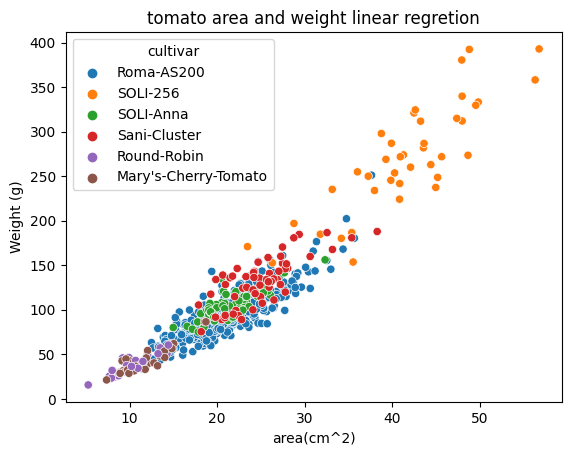

In [ ]:
tomato_list=TomatoList(harvest_list)#create TomatoList objects
tomato_list.get_spec_stats()
cultivar,marker_dict=cultivar_column(tomato_list)
data={'area(cm^2)':np.array(tomato_list.spectral_stats['area(cm^2)']).flatten(),'Weight (g)':np.array(tomato_list.lab_results_df['Weight (g)']),'cultivar':cultivar}
data=pd.DataFrame(data)
sns.scatterplot(data=data,x='area(cm^2)',y='Weight (g)',hue='cultivar')
plt.title('tomato area and weight linear regretion')
slope, intercept, r_value, p_value, std_err = stats.linregress(np.array(tomato_list.spectral_stats['area(cm^2)']).flatten(), np.array(tomato_list.lab_results_df['Weight (g)']))

#spectral graphs

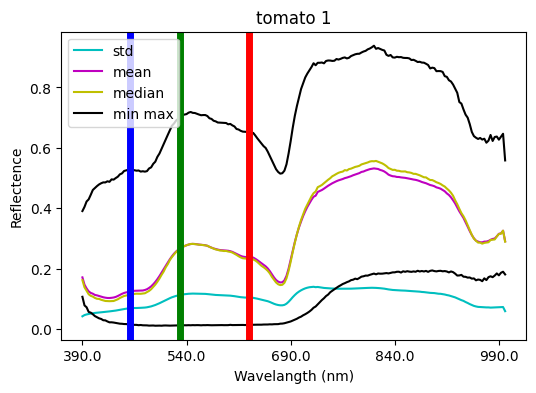

In [ ]:
tomato_list=TomatoList(harvest_list)#create TomatoList objects
tomato_list.get_spec_stats()
tomato_list.spectral_stats['mean']
x=list(np.arange(0,band_depth,50,dtype=int))
for i in range(tomato_list.spectral_stats['mean'].shape[0]):
  fig, ax = plt.subplots(figsize=(6,4))
  ax.set(xlabel='Wavelangth (nm)',
      ylabel='Reflectence',
      title=f'tomato {i+1}'
      )
  ax.plot(tomato_list.spectral_stats['std'].iloc[i,:],color='c',label='std')
  ax.plot(tomato_list.spectral_stats['mean'].iloc[i,:],color='m',label='mean')
  ax.plot(tomato_list.spectral_stats['median'].iloc[i,:],color='y',label='median')
  ax.plot(tomato_list.spectral_stats['max'].iloc[i,:],color='k',label='min max')
  ax.plot(tomato_list.spectral_stats['min'].iloc[i,:],color='k')
  plt.axvline(x=23,color='b',lw=5)
  plt.axvline(x=47,color='g',lw=5)
  plt.axvline(x=80,color='r',lw=5)
  plt.xticks(ticks=x, labels =global_band_table.loc[x]['wavelangth']//10*10)
  plt.legend()
  plt.show()
  break

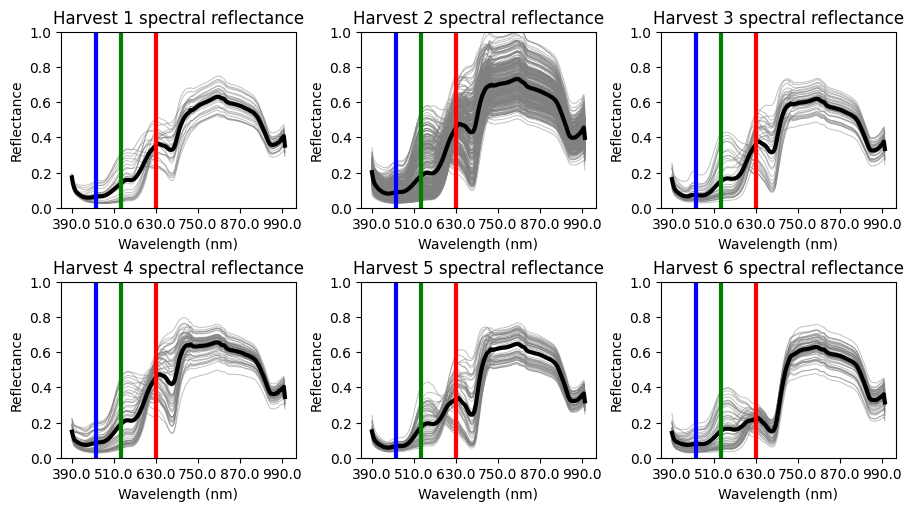

In [ ]:


n_plots = len(harvest_list)
if n_plots>6:
  n_cols=4
else: n_cols=3
n_rows = 2

fig, axes = plt.subplots(n_rows, n_cols, figsize=(3 * n_cols, 2.5 * n_rows), constrained_layout=True)
axes = axes.ravel()  # Flatten the axes array

x = list(np.arange(0, band_depth, 40, dtype=int))

for harvest_num, (harvest, ax) in enumerate(zip(harvest_list, axes)):
    tomato_list = TomatoList([harvest])
    tomato_list.get_spec_stats()

    for i in range(tomato_list.spectral_stats['mean'].shape[0]):
        ax.plot(tomato_list.spectral_stats['mean'].iloc[i, :], color='gray', alpha=0.5, lw=0.7)

    cols = tomato_list.spectral_stats['mean'].columns
    ax.set(xlabel='Wavelength (nm)',
           ylabel='Reflectance', ylim=(0, 1),
           title=f'Harvest {harvest_num + 1} spectral reflectance')
    ax.plot(tomato_list.spectral_stats['mean'][cols].mean(), c='k', lw=3, label='mean')
    ax.axvline(x=23, color='b', lw=3)
    ax.axvline(x=47, color='g', lw=3)
    ax.axvline(x=80, color='r', lw=3)
    ax.set_xticks(ticks=x)
    ax.set_xticklabels(global_band_table.loc[x]['wavelangth'] // 10 * 10)

# Hide the remaining empty plots if any
for j in range(harvest_num + 1, n_rows * n_cols):
    axes[j].set_visible(False)

# Display the final plot
plt.show()


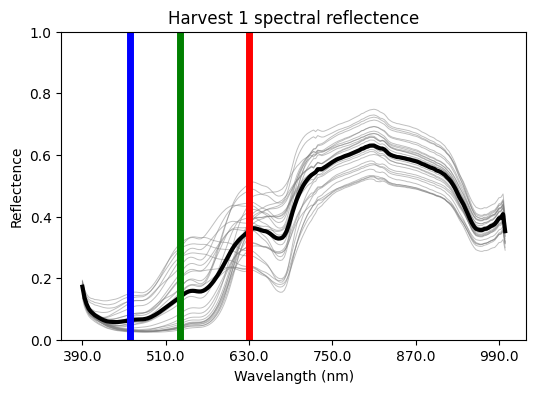

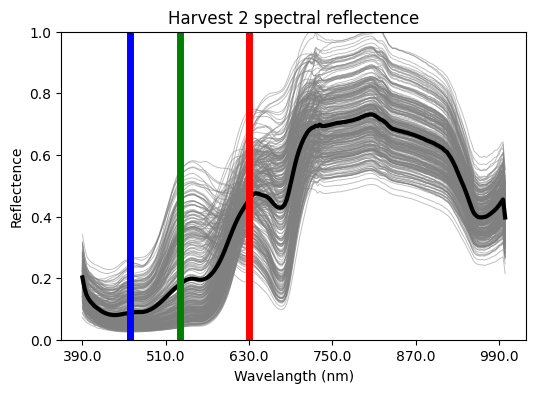

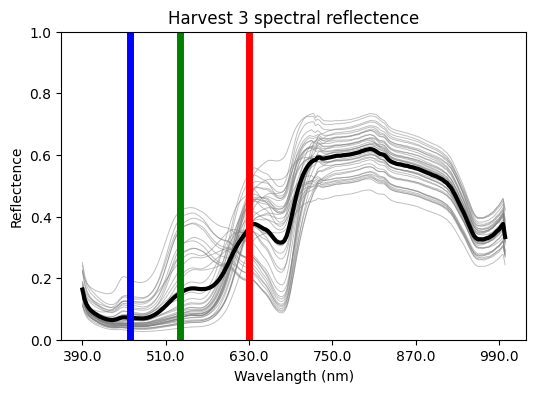

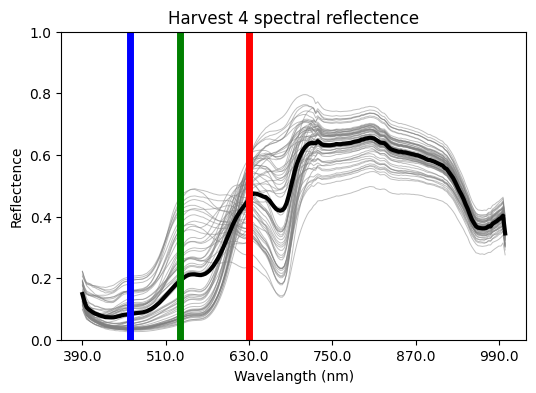

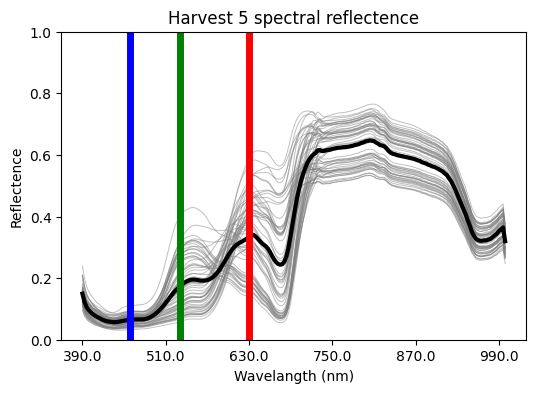

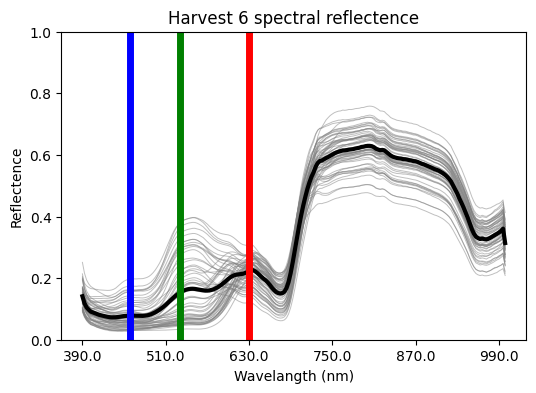

In [ ]:
 # tomato_list1234=TomatoList([harvest_6])#create TomatoList objects
for harvest_num,harvest in enumerate(harvest_list):
  tomato_list=TomatoList([harvest])
  tomato_list.get_spec_stats()
  # tomato_list=tomato_list1234
  x=list(np.arange(0,band_depth,40,dtype=int))
  fig, ax = plt.subplots(figsize=(6,4))
  for i in range(tomato_list.spectral_stats['mean'].shape[0]):
    ax.plot(tomato_list.spectral_stats['mean'].iloc[i,:],color='gray',alpha=0.5,lw=0.7)#),color='m',label='mean')
  cols=tomato_list.spectral_stats['mean'].columns
  ax.set(xlabel='Wavelangth (nm)',
  ylabel='Reflectence',ylim=(0,1),
  title=f'Harvest {harvest_num+1} spectral reflectence')
  ax.plot(tomato_list.spectral_stats['mean'][cols].mean(),c='k',lw=3,label='mean')
  ax.axvline(x=23,color='b',lw=5)
  ax.axvline(x=47,color='g',lw=5)
  ax.axvline(x=80,color='r',lw=5)
  plt.xticks(ticks=x, labels =global_band_table.loc[x]['wavelangth']//10*10);


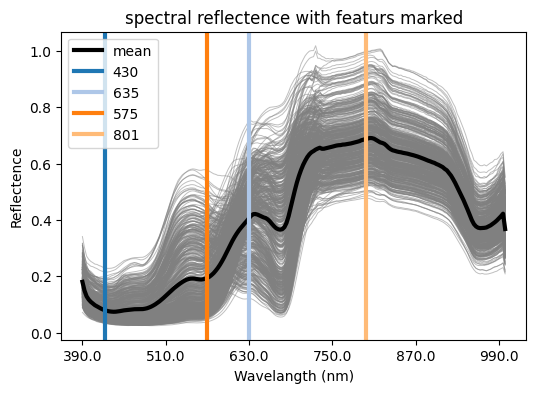

In [ ]:
plot_spectral_feturs(TomatoList(harvest_list),[11,80,60,136])

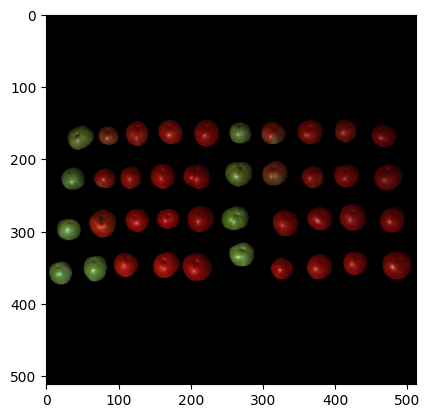

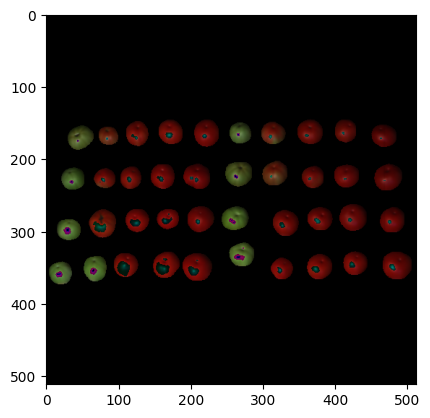

In [ ]:
mask=harvest_3.image_list[1].mask
RGB=harvest_3.image_list[1].RGB
binery_mask=mask.copy()
binery_mask[mask>0]=1
mask_RGB=RGB.copy()
mask_RGB[:,:,0],mask_RGB[:,:,1],mask_RGB[:,:,2]=binery_mask,binery_mask,binery_mask
masked=mask_RGB*RGB
thresh=0.55
masked[masked>thresh]=0
plt.imshow(mask_RGB*RGB)
plt.show()
plt.imshow(masked)

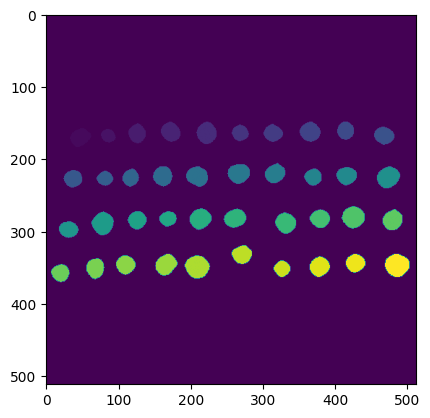

In [ ]:



# Load the labeled mask
mask = harvest_3.image_list[1].mask

# Convert the mask to binary
binary_mask = np.zeros_like(mask)
binary_mask[mask > 0] = 1

# Label the mask
num_labels = len(np.unique(mask))-1

# Define the erosion kernel
kernel = np.ones((7, 7), np.uint8)
labeled_mask=mask.copy()
# Erode each label separately
eroded_mask = np.zeros_like(labeled_mask)
for label_idx in range(1, num_labels+1):
    label_mask = labeled_mask == label_idx
    eroded_label = binary_erosion(label_mask, structure=kernel, border_value=0)
    eroded_mask[eroded_label > 0] = label_idx

# Show the eroded mask
plt.imshow(eroded_mask)
plt.show()


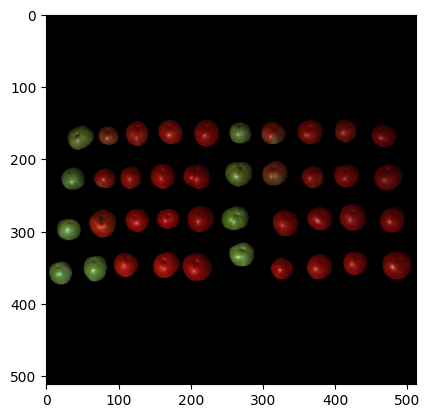

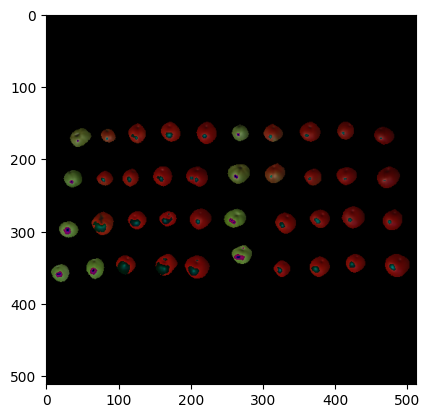

In [ ]:
mask_RGB[:,:,0],mask_RGB[:,:,1],mask_RGB[:,:,2]=binery_mask,binery_mask,binery_mask
plt.imshow(mask_RGB*RGB)
plt.show()
binery_eroded_mask=eroded_mask.copy()
binery_eroded_mask[eroded_mask>0]=1
mask_RGB[:,:,0],mask_RGB[:,:,1],mask_RGB[:,:,2]=binery_eroded_mask,binery_eroded_mask,binery_eroded_mask
plt.imshow(mask_RGB*masked)

#White refrence detection

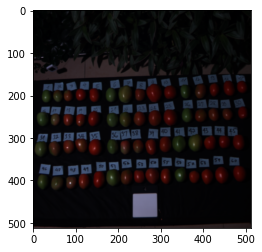

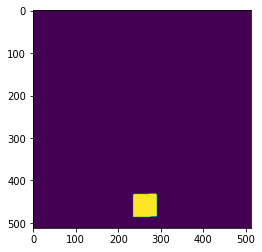

WR pix=3022, real pix size=0.03309066843150232 


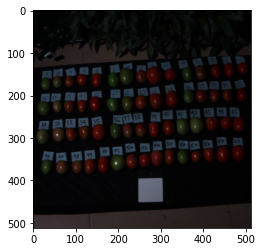

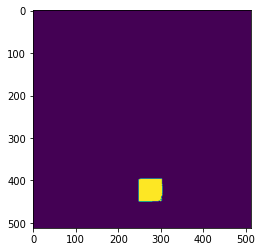

WR pix=2945, real pix size=0.03395585738539898 


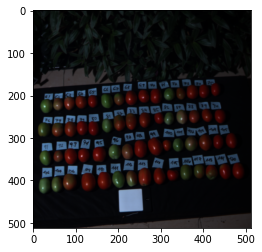

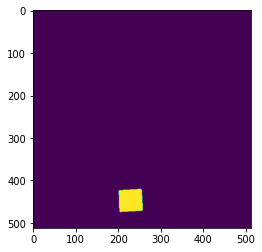

WR pix=2844, real pix size=0.035161744022503515 


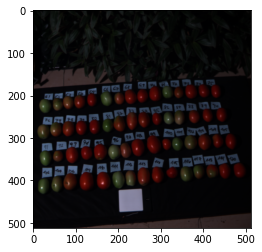

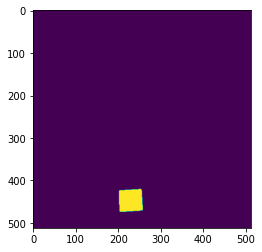

WR pix=2785, real pix size=0.03590664272890485 


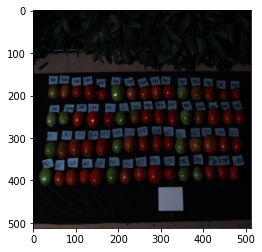

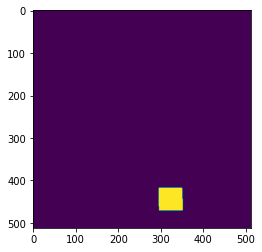

WR pix=3038, real pix size=0.032916392363396975 


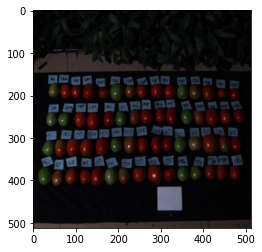

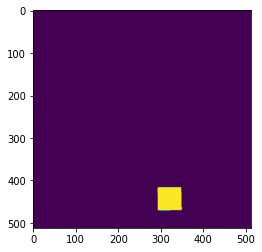

WR pix=3053, real pix size=0.03275466754012447 


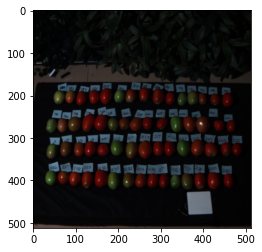

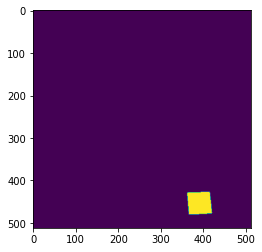

WR pix=2800, real pix size=0.03571428571428571 


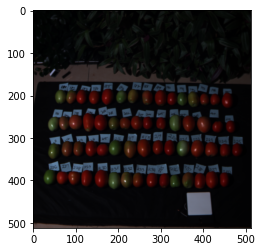

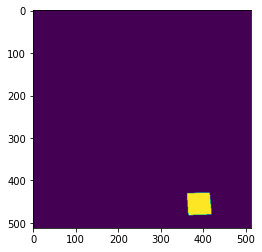

WR pix=2801, real pix size=0.03570153516601214 


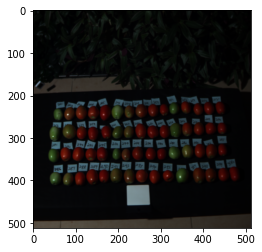

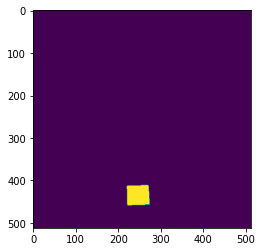

WR pix=2412, real pix size=0.04145936981757877 


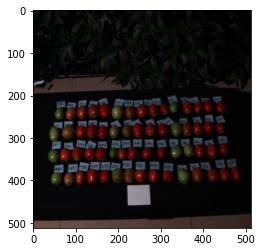

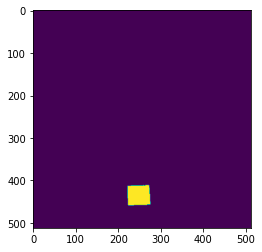

WR pix=2410, real pix size=0.04149377593360996 


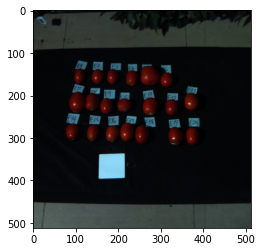

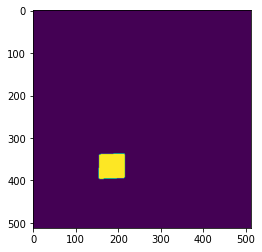

WR pix=3570, real pix size=0.028011204481792718 


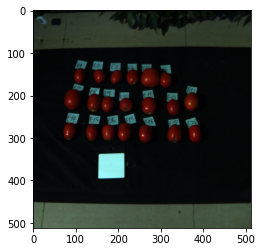

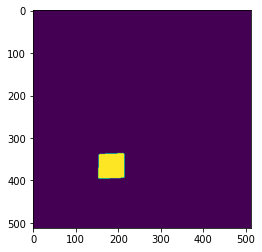

WR pix=3574, real pix size=0.027979854504756575 


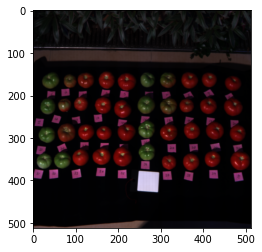

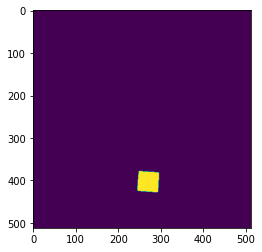

WR pix=2306, real pix size=0.04336513443191674 


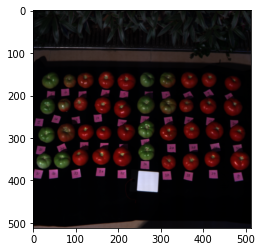

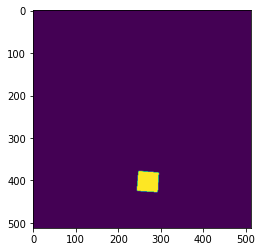

WR pix=2308, real pix size=0.043327556325823226 


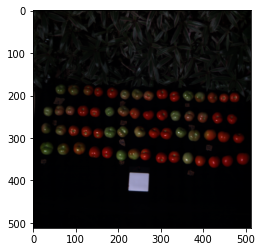

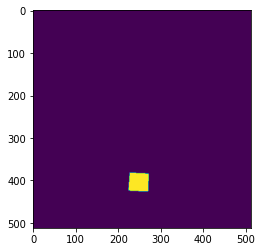

WR pix=1955, real pix size=0.05115089514066496 


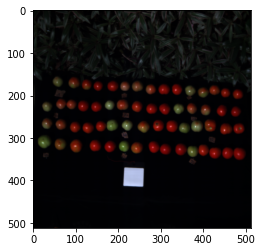

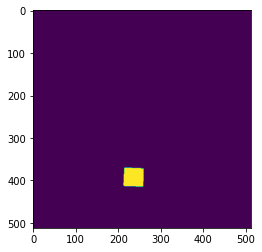

WR pix=2029, real pix size=0.04928536224741252 


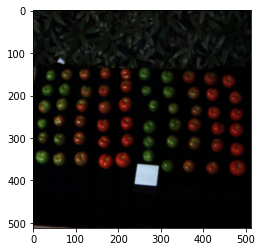

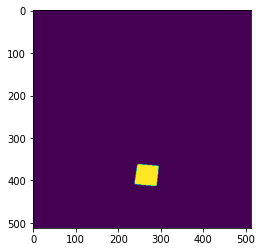

WR pix=2470, real pix size=0.04048582995951417 


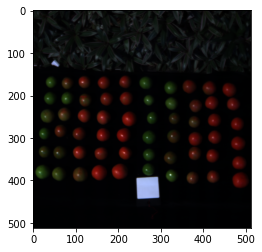

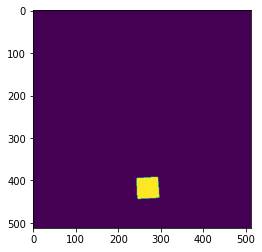

WR pix=2558, real pix size=0.039093041438623924 


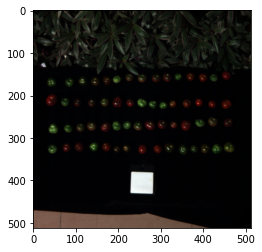

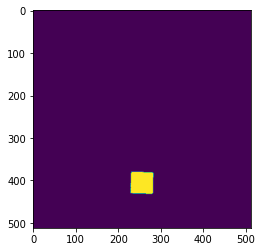

WR pix=2664, real pix size=0.03753753753753754 


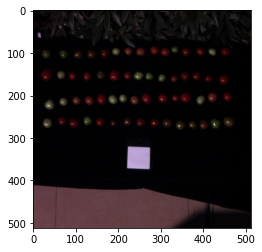

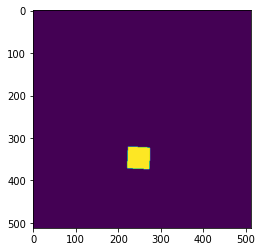

WR pix=2709, real pix size=0.0369139904023625 


In [ ]:
def pix_size(image_wr):
  hsv = cv2.cvtColor(image_wr, cv2.COLOR_RGB2HSV) # convert rgb to hsv
  new_mask = cv2.inRange(hsv, (0,0,240), (120,1,255)) # mask out the white refrence. range of hsv. from hsv1 to hsv2.

  label_image = measure.label(new_mask)

  image_label_overlay = label2rgb(label_image, image=image_wr) # display the labels, abovee our original iamge (img)

  props = measure.regionprops_table(label_image, image_wr,
                                    properties= ['label',
                                                'area', 'equivalent_diameter',
                                                'mean_intensity', 'solidity'])

  df = pd.DataFrame(props)

  wr_pixel_number = df['area'].max()
  real_wr_area=10**2 #cm^2
  real_pixel_size = real_wr_area/wr_pixel_number

  return real_pixel_size
wr_size_list=[]
harvest_list=[harvest_2,harvest_3,harvest_4, harvest_5,harvest_6]
for harvest in harvest_list:
  for img in harvest.image_list:
    plt.imshow(img.RGB)
    plt.show()
    image_wr=img.RGB.copy()
    image_wr *= 255
    image_wr = image_wr.astype(np.uint8)
    hsv = cv2.cvtColor(image_wr, cv2.COLOR_RGB2HSV) # convert rgb to hsv
    new_mask = cv2.inRange(hsv, (15,0,110), (255,255,255)) # mask out the white refrence. range of hsv. from hsv1 to hsv2.


    label_image = measure.label(new_mask)

    image_label_overlay = label2rgb(label_image, image=image_wr) # display the labels, abovee our original iamge (img)

    props = measure.regionprops_table(label_image, image_wr,
                                      properties= ['label',
                                                  'area', 'equivalent_diameter',
                                                  'mean_intensity', 'solidity'])

    df = pd.DataFrame(props)

    # identify label to isolate
    target_label = df['area'].idxmax()+1

    # create new mask with all zeros
    new_mask = np.zeros_like(label_image)

    # set new mask to 1 where target label is found in original mask
    new_mask[label_image == target_label] = 1
    plt.imshow(new_mask)
    plt.show()

    wr_pixel_number = df['area'].max()
    real_wr_area=10**2 #cm^2
    real_pixel_size = real_wr_area/wr_pixel_number
    wr_size_list+=[wr_pixel_number]
    print(f'WR pix={wr_pixel_number}, real pix size={real_pixel_size} ')

In [ ]:
wr_mean_pixel_count=np.array(wr_size_list).mean()
wr_mean_pixel_count

2712.65

In [ ]:
(10/(2712.65**0.5))*130

24.96010862662912

#histograms

##harvests 1-6 histograms

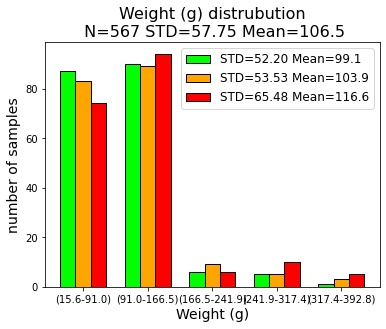

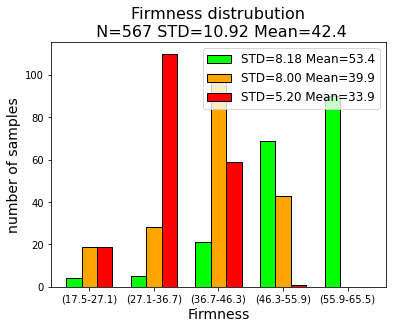

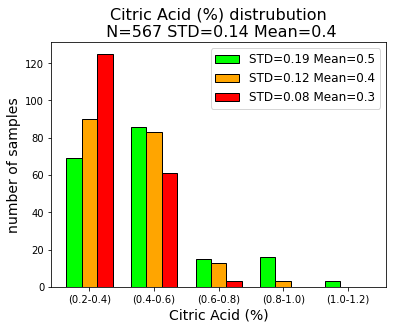

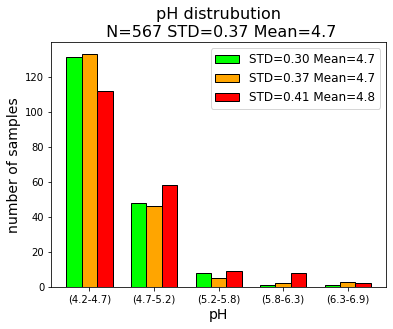

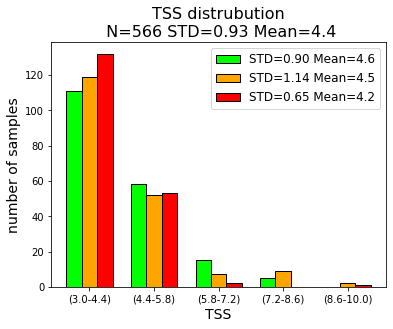

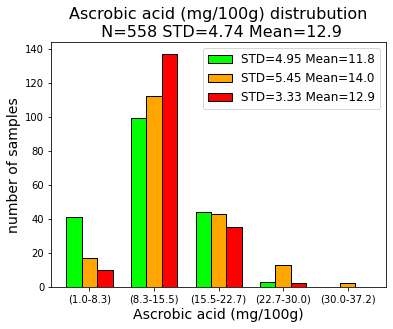

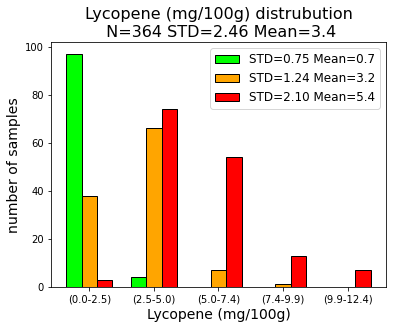

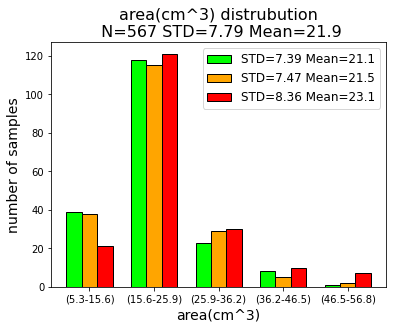

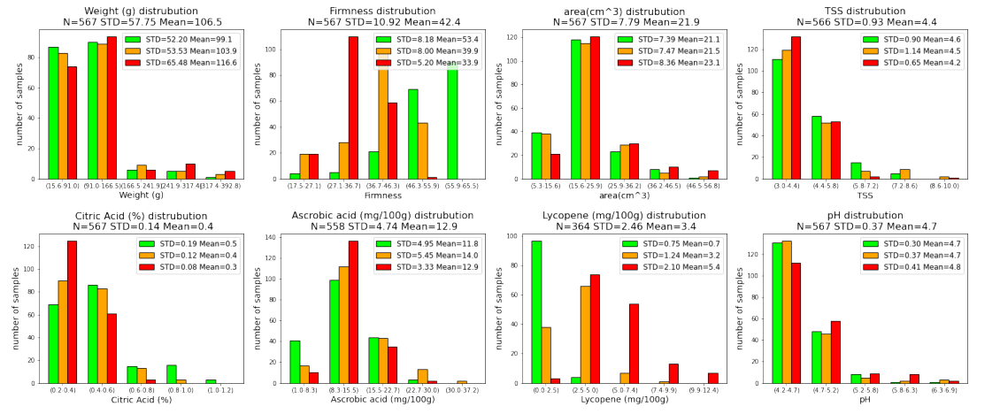

In [ ]:
histograms(tomato_list123456, categories=5)
multi_plot(x_pad=-0.35,y_pad=0.1)

#colormap hotspots

In [ ]:

def get_best_NDSI_combinations(tomato_list, aband_list, number_bands_to_select=5):
    """
    This function takes in a tomato_list, a list of available bands, and a number of bands to select,
    and returns a sorted list of unique pairs of bands that can be selected for NDSI calculation.
    """
    # Generate all combinations of available bands to select, with a minimum distance of 10 between any pair of bands
    all_bands_together = np.array(aband_list)
    all_5_band_combos = [[(i,j) for i,j in itertools.combinations(comb,2)] for comb in itertools.combinations(all_bands_together, number_bands_to_select) if all(num >= 10 for num in [abs(i-j) for i,j in itertools.combinations(comb,2)])]

    # Calculate the evaluation score for each combination of bands using R-squared values
    pair_values = {}
    for col in tqdm(tomato_list.lab_results_df.columns.drop('area(cm^2)'), desc="Calculating R-squared values"):

        df_squared = tomato_list.r_2_dict[col]
        evaluation = []
        for pairs in all_5_band_combos:
            evaluation += [max([df_squared[int(b1),int(b2)]/df_squared.max() for b1,b2 in pairs])]
        pair_values[col] = evaluation

    # Create a DataFrame of the evaluation scores for each combination of bands
    pair_values = pd.DataFrame(pair_values)
    pair_values['total eval'] = pair_values.sum(axis=1)

    # Get the indices of the maximum and minimum evaluation scores
    max_index = pair_values.idxmax(axis=0)
    df_sorted = pair_values.sort_values('total eval')

    cosen_bands_eval={}
    for col in tomato_list.lab_results_df.columns.drop('area(cm^2)'):
      # Create R square df
      df_squared = tomato_list.r_2_dict[col]
      evaluation=[]
      for b1,b2 in all_5_band_combos[ max_index['total eval']]:
        evaluation+=[df_squared[b1,b2]/df_squared.max()]
      cosen_bands_eval[col]=evaluation
    cosen_bands_eval=pd.DataFrame(cosen_bands_eval)

    # Get the selected pairs of bands for the maximum evaluation scores
    chosen_ndsi_bands = [all_5_band_combos[max_index['total eval']][i] for i in np.unique(cosen_bands_eval.idxmax(axis=0))]
    chosen_ndsi_1 = NDSI_from_tuple_list(tomato_list, chosen_ndsi_bands)
    chosen_ndsi_1.columns = chosen_ndsi_bands
    cols = chosen_ndsi_1.columns#.append(cols_2)

    # Create a sorted list of unique pairs of bands that can be selected for NDSI calculation
    pairs = np.unique(cols)
    sorted_list = [(a, b) if a <= b else (b, a) for a, b in pairs]

    return sorted_list

In [ ]:
tomato_list.get_color_maps([])
tomato_list.r_2_dict.keys()

<ipython-input-16-f3ea62cebb5c>:246: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormaps=[cm.get_cmap('RdBu', 256)]


dict_keys(['Weight (g)', 'Firmness', 'TSS', 'Citric Acid (%)', 'Ascrobic acid (mg/100g)', 'Lycopene (mg/100g)', 'pH'])

In [ ]:

def regretionplot_best_bands_normalized(tomato_list, band_combinations, save_to_path='/content/drive/MyDrive/Shared_tomato/Eitan/plots/'):
    """Creates a regression plot with normalized NDSIs for each best band combination provided."""
    if type(band_combinations[0])==tuple:
        band_combinations=np.unique(band_combinations)
    band_combinations=list(itertools.combinations(band_combinations, 2))

    # Obtain R^2 map dictionary from the tomato list
    R_2_map_dict = tomato_list.r_2_dict
    global global_band_table, R_wave, G_wave, band_depth

    # Convert wavelengths to float
    waves = [float(i) for i in global_band_table['wavelangth']]
    colors = ['blue', 'g']

    # Get column names to plot
    columns_to_plot = tomato_list.lab_results_df.columns.drop('area(cm^2)')
    num_columns = len(columns_to_plot)

    # Set up the grid for subplots
    num_rows = 2
    num_cols = (num_columns + 1) // num_rows
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(6*num_cols, 4*num_rows))

    # Loop through columns
    for idx, col in enumerate(columns_to_plot):
        # Create a temporary dataframe with relevant data
        temp_df = pd.concat([tomato_list.reflectence_df, tomato_list.lab_results_df[col]], axis=1)
        temp_df = temp_df[temp_df[col] > 0].dropna(axis=0)
        np_results = np.array(temp_df[col])
        np_reflectence = np.array(temp_df.loc[:, :(band_depth - 1)])

        # Define the axis for the current subplot
        ax = axes[idx // num_cols, idx % num_cols]

        # Find the best band combination for the current column
        best_band = max(band_combinations, key=lambda b: R_2_map_dict[col][b])
        best_bands = [best_band]

        # Find the max correlation in the R^2 map for the current column
        max_corr_band = np.unravel_index(R_2_map_dict[col].argmax(), R_2_map_dict[col].shape)
        best_bands.append(max_corr_band)

        # Loop through best band combinations
        for i, (b1, b2) in enumerate(best_bands):
            x_tag = f"NDSI"
            # Calculate Normalized Difference Spectral Index (NDSI) for the band combination
            NI = ((np_reflectence[:, b2] - np_reflectence[:, b1]) / (np_reflectence[:, b1] + np_reflectence[:, b2]))
            # Normalize NDSI
            NI_normalized = (NI - np.min(NI)) / (np.max(NI) - np.min(NI))
            data_dict = {x_tag: NI_normalized, col: temp_df[col]}
            data = pd.DataFrame(data_dict)
            slope, intercept, r_value, p_value, std_err = stats.linregress(data[x_tag], data[col])

            # Plot the data points and regression line
            scatter = sns.scatterplot(x=x_tag, y=col, data=data, color=colors[i], ax=ax, legend=False)

            sns.regplot(x=x_tag, y=col, data=data, scatter=False, line_kws={'color': colors[i]}, ax=ax)
            line_label = f"({waves[b1]:.0f}nm,{waves[b2]:.0f}nm): $R^2$={r_value**2:.2f}"
            if i == 1 :#and best_band != max_corr_band:
                line_label += " (Max Corr)"
            scatter_line = scatter.get_lines()[-1]
            scatter_line.set_label(line_label)

            # Add a legend and title to the current subplot
        ax.legend()
        ax.set_title(col)

    # Remove axis on spare plots
    for i in range(num_columns, num_rows * num_cols):
        axes[i // num_cols, i % num_cols].axis('off')

    # Adjust the space between subplots
    plt.subplots_adjust(hspace=0.3)

    # Save the plot to the specified file path (uncomment the next line to save the plot)
    # plt.savefig(f'{save_to_path}{tomato_list.date_str}_regretion_plot_N={len(data[col])}_best_bands_normalized.png')
    plt.show()


##option 1

In [ ]:
def check_band_distance(combination1, combination2, min_distance=10):
    distance1 = abs(combination1[0] - combination2[0])
    distance2 = abs(combination1[1] - combination2[1])
    return distance1 >= min_distance or distance2 >= min_distance

def find_best_bands(tomato_list, num_bands):
    # Define a function to check if the distance between two bands is greater than a given minimum distance

    # Define a function to check if a given row of indices has a minimum difference between each element
    def is_good_row(row, min_diff=10):
        diff = np.diff(row)
        return np.all(diff >= min_diff)

    # Define a function to evaluate a combination of indices by summing the values in a dictionary of 2D arrays
    def evaluate_combination(comb, dict_of_arrays):
        total_sum = 0
        combos = list(itertools.combinations(comb, 2))
        for array_key, array in dict_of_arrays.items():
            if array_key == 'Weight (g)':
                continue
            total_sum += np.array([array[combo] for combo in combos]).sum()
        return total_sum

    # Initialize an empty list to store all bands
    all_bands = []

    # Loop through each column in the dataframe
    for col in tomato_list.lab_results_df.columns:
        if col == 'area(cm^2)':
            continue

        # Create R^2 df colormap and find local maxima
        r2_colormap = tomato_list.r_2_dict[col]
        upper_triangle_mask = np.triu(np.ones_like(r2_colormap, dtype=bool), k=1)
        local_maxima = argrelextrema(r2_colormap * upper_triangle_mask, np.greater)

        # Get the R^2 values and corresponding indices for the local maxima
        maxima_r2_values = r2_colormap[local_maxima]
        maxima_indices = list(zip(local_maxima[0], local_maxima[1]))
        sorted_maxima = sorted(zip(maxima_r2_values, maxima_indices), reverse=True)
        filtered_maxima = []

        # Loop through each local maximum and check if it is a valid band combination
        for r2_value, indices in sorted_maxima:
            if len(filtered_maxima) == 2:
                break
            valid_combination = True
            for existing_r2_value, existing_indices in filtered_maxima:
                reversed_indices = (existing_indices[1], existing_indices[0])
                if indices == reversed_indices:
                    valid_combination = False
                    break
                if not check_band_distance(existing_indices, indices):
                    valid_combination = False
                    break
            band_distance = abs(indices[0] - indices[1])
            if valid_combination and band_distance >= 10:
                filtered_maxima.append((r2_value, indices))

        # Add the valid bands to the list of all bands
        all_bands += [band for r2_value, band_pair in filtered_maxima for band in band_pair]

    # Remove duplicate bands and get unique indices
    indices = np.unique(all_bands)

    # Get all possible combinations of the desired number of indices
    combinations = list(itertools.combinations(indices, num_bands))
    combinations_array = np.array(combinations)

    # Filter out combinations that don't have a minimum difference between each element
    filtered_combinations = np.array([row for row in combinations_array if is_good_row(row)])

    # Find the combination with the highest sum
    best_combination = max(filtered_combinations, key=lambda x: evaluate_combination(x, tomato_list.r_2_dict))
    best_bands = list(best_combination)

    return best_bands


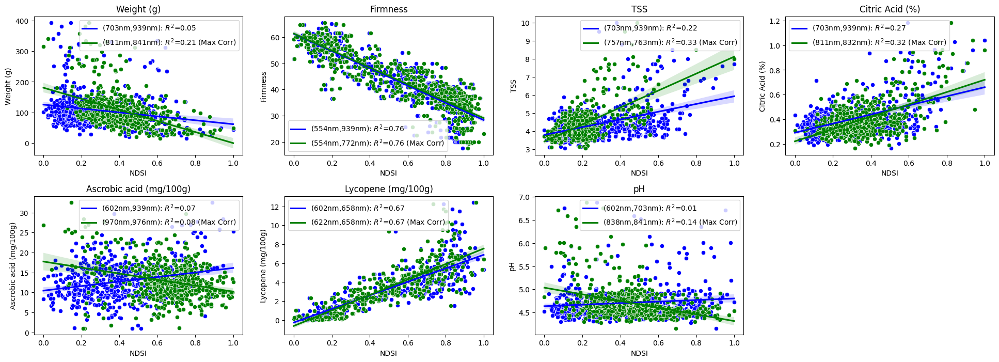

In [ ]:

regretionplot_best_bands_normalized(tomato_list,find_best_bands(tomato_list, 5))

In [ ]:
find_best_bands(tomato_list, 6)

[54, 70, 89, 104, 141, 160]

In [ ]:

all_bands=[]

for col in tomato_list.lab_results_df.columns:
  if col== 'area(cm^2)':
    continue

  # Create R squre df
  r2_colormap =tomato_list.r_2_dict[col]
  upper_triangle_mask = np.triu(np.ones_like(r2_colormap, dtype=bool), k=1)
  local_maxima = argrelextrema(r2_colormap * upper_triangle_mask, np.greater)
  # Assuming your R^2 correlation colormap is a 2D numpy array called r2_colormap
  # local_maxima = argrelextrema(r2_colormap, np.greater)
  # Get the R^2 values and corresponding indices for the local maxima.
  maxima_r2_values = r2_colormap[local_maxima]
  maxima_indices = list(zip(local_maxima[0], local_maxima[1]))
  sorted_maxima = sorted(zip(maxima_r2_values, maxima_indices), reverse=True)
  filtered_maxima = []


  for r2_value, indices in sorted_maxima:
      if len(filtered_maxima) == 2:
          break

      valid_combination = True

      for existing_r2_value, existing_indices in filtered_maxima:
          reversed_indices = (existing_indices[1], existing_indices[0])

          if  indices == reversed_indices:
              valid_combination = False
              break
          if not check_band_distance(existing_indices, indices):
              valid_combination = False
              break
      band_distance = abs(indices[0] - indices[1])
      if valid_combination and band_distance >= 10:
          filtered_maxima.append((r2_value, indices))

  all_bands+=[band for r2_value, band_pair in filtered_maxima for band in band_pair]
  print(filtered_maxima,col)

[(0.21725091, (140, 150)), (0.17681278, (145, 160))] Weight (g)
[(0.7486299, (54, 127)), (0.74843454, (54, 161))] Firmness
[(0.35669956, (74, 160)), (0.35364553, (74, 148))] TSS
[(0.30164152, (141, 160)), (0.29235768, (104, 182))] Citric Acid (%)
[(0.074899584, (129, 141)), (0.074536175, (70, 185))] Ascrobic acid (mg/100g)
[(0.6711835, (77, 89)), (0.66958416, (76, 99))] Lycopene (mg/100g)
[(0.11353609, (134, 150)), (0.098013684, (145, 155))] pH


In [ ]:
plot_spectral_feturs(TomatoList(harvest_list),best_combination)

##option 2

In [ ]:

def find_optimal_band_combinations_local_maxima(tomato_list, plot=False, print_results=False):

    if plot:
        n_plots = len(tomato_list.lab_results_df.columns.drop('area(cm^2)'))
        n_cols = 4
        n_rows = int(np.ceil(n_plots / n_cols))

        fig, axes = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 4 * n_rows), constrained_layout=True)
        axes = axes.ravel()

    xticks = get_waves()
    good_x, good_y = {}, {}
    selected_values = {}
    all_bands = []

    for idx, col in enumerate(tomato_list.lab_results_df.columns.drop('area(cm^2)')):
        good_x[col], good_y[col] = [], []
        selected_values[col] = []
        if col == 'pH':
            neighborhood_size = 15
        elif col == 'Ascrobic acid (mg/100g)':
            neighborhood_size = 40
        elif col == 'TSS':
            neighborhood_size = 45
        elif col == 'Firmness':
            neighborhood_size = 35
        else:
            neighborhood_size = 25

        df_squared = pd.DataFrame(tomato_list.r_2_dict[col])
        data = df_squared.values

        threshold = 0.1
        top_3_centers = []

        while len(top_3_centers) < 2:
            data_max = ndimage.maximum_filter(data, size=neighborhood_size)
            maxima = (data == data_max)
            data_min = ndimage.minimum_filter(data, size=neighborhood_size)
            diff = ((data_max - data_min) > threshold)
            maxima[diff == 0] = 0

            triangle_mask = np.triu(np.ones(data.shape)).astype(np.bool)
            maxima[triangle_mask] = 0

            labeled, num_objects = ndimage.label(maxima)
            slices = ndimage.find_objects(labeled)

            centers = []
            for dy, dx in slices:
                x_center = (dx.start + dx.stop - 1) / 2
                y_center = (dy.start + dy.stop - 1) / 2
                centers.append((x_center, y_center))

            filtered_centers = [c for c in centers if abs(c[0] - c[1]) >= 10]

            if len(filtered_centers) > 5:
                threshold += 0.01
            elif len(filtered_centers) < 3:
                threshold -= 0.01
                if threshold < 0:
                    break
            else:
                top_3_centers = sorted(filtered_centers, key=lambda c: data[int(c[1]), int(c[0])], reverse=True)[:2]

        for i, j in top_3_centers[:1]:
            good_x[col].append(i)
            good_y[col].append(j)
            selected_values[col].append(data[int(j), int(i)])
        if plot:
            triangle_data = np.tril(df_squared)
            triangle_data_new = triangle_data.copy()
            triangle_data_new[triangle_mask] = None
            triangle_data_new = pd.DataFrame(triangle_data_new)
            triangle_data_new.columns = xticks
            triangle_data_new.index = xticks
            sns.heatmap(triangle_data_new, cmap='viridis', vmin=triangle_data.min(), vmax=triangle_data.max(), ax=axes[idx])
            axes[idx].autoscale(False)
            for i, j in top_3_centers[:1]:
              axes[idx].plot(i, j, 'ro', color='red')

            axes[idx].set_title(f'Local hotspots R$^2$ {col}')
            axes[idx].set_xlabel('Band 1 (nm)')
            axes[idx].set_ylabel('Band 2 (nm)')

            for (i, j), value in zip(top_3_centers, selected_values[col]):
                print(f"Band combination: ({int(i)}, {int(j)}) - R^2 value: {value}")
    if plot:
        for j in range(idx + 1, n_rows * n_cols):
            axes[j].set_visible(False)

        plt.show()

    band_combinations = {}
    for col in tomato_list.lab_results_df.columns.drop('area(cm^2)'):
        band_combinations[col] = [(int(i), int(j)) for i, j in zip(good_x[col], good_y[col])]
        all_bands += band_combinations[col]
        if print_results:
            print(f"{col} band combinations:")
            for comb, value in zip(band_combinations[col], selected_values[col]):
                print(f"  {comb} - R^2 value: {value}")

    all_bands_together = []
    for b1, b2 in all_bands:
        all_bands_together += [b1, b2]

    if print_results:
        print(all_bands_together)

    return all_bands


# find_optimal_band_combinations_local_maxima(tomato_list,True)

In [ ]:

NDSI_bands=find_optimal_band_combinations_local_maxima(tomato_list)

<ipython-input-42-3f5c9795b8d0>:43: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  triangle_mask = np.triu(np.ones(data.shape)).astype(np.bool)


In [ ]:

NDSI_bands=get_best_NDSI_combinations(tomato_list,find_optimal_band_combinations_local_maxima(tomato_list),number_bands_to_select=5)
NDSI_bands

<ipython-input-26-2b86ac311b4a>:43: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  triangle_mask = np.triu(np.ones(data.shape)).astype(np.bool)
Calculating R-squared values: 100%|██████████| 7/7 [00:00<00:00, 21.82it/s]


[(54, 160), (74, 160), (134, 150), (150, 160)]

In [ ]:
plot_spectral_feturs(tomato_list,np.unique(NDSI_bands))

NameError: ignored

In [ ]:
NDSI_from_tuple_list(tomato_list,NDSI_bands)

In [ ]:

all_bands_together=[]
for b1,b2 in all_bands:
  all_bands_together+=b1,b2

plot_spectral_feturs(tomato_list,all_bands_together)
plt.legend(labels=[])

NameError: ignored

##option 3

num_maps sets the number of overlaping maps from wich a maxima will be taken one per map

In [ ]:
num_maps=4

###band selection

In [ ]:
def create_evaluation_map(tomato_list):
    # Initialize a zero matrix with the same shape as combined_outlines_overlaps
    evaluate = np.zeros_like(tomato_list.R_dict['Firmness'])

    # Iterate over each column in the dataframe excluding 'area(cm^2)'
    for col in tomato_list.lab_results_df.columns.drop('area(cm^2)'):
        heatmap = tomato_list.r_2_dict[col]

        # Iterate over the range 204
        for i in range(204):
            for j in range(204):
                if i <= j:
                    evaluate[i, j] = np.nan
                    continue
                evaluate[i, j] += heatmap[i, j] / heatmap.max()

    return evaluate/np.nanmax(evaluate)


In [ ]:

def find_hotspots(heatmap,col, n_hotspots=1, min_percentile=10, max_percentile=90):

    # Normalize the heatmap data to the range 0-255
    heatmap_normalized = cv2.normalize(heatmap, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)

    # Apply a Gaussian blur to smooth the data
    blurred_heatmap = cv2.GaussianBlur(heatmap_normalized, (5, 5), 0)

    # Apply a percentile-based threshold for the min and max hotspots
    min_threshold = np.percentile(blurred_heatmap, min_percentile)
    max_threshold = np.percentile(blurred_heatmap, max_percentile)

    _, min_thresh = cv2.threshold(blurred_heatmap, min_threshold, 255, cv2.THRESH_BINARY_INV)
    _, max_thresh = cv2.threshold(blurred_heatmap, max_threshold, 255, cv2.THRESH_BINARY)

    # Perform morphological closing to fill small holes in the thresholded heatmap
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    min_closed_heatmap = cv2.morphologyEx(min_thresh, cv2.MORPH_CLOSE, kernel)
    max_closed_heatmap = cv2.morphologyEx(max_thresh, cv2.MORPH_CLOSE, kernel)

    # Find connected components
    num_labels_min, labels_min = cv2.connectedComponents(min_closed_heatmap)
    num_labels_max, labels_max = cv2.connectedComponents(max_closed_heatmap)

    # Find the largest n_hotspots connected components for min and max hotspots
    min_hotspot_idxs = np.argsort([-np.sum(labels_min == i) for i in range(1, num_labels_min)])[:n_hotspots] + 1
    max_hotspot_idxs = np.argsort([-np.sum(labels_max == i) for i in range(1, num_labels_max)])[:n_hotspots] + 1

    min_hotspot_masks = [(labels_min == idx).astype(np.uint8) * 255 for idx in min_hotspot_idxs]
    max_hotspot_masks = [(labels_max == idx).astype(np.uint8) * 255 for idx in max_hotspot_idxs]

    # Initialize the labeled mask
    labeled_mask = np.zeros_like(heatmap, dtype=np.uint16)

    # Assign consecutive numbers to the min and max hotspots and fill holes in hotspot areas
    label_counter = 1
    for hotspot_mask in min_hotspot_masks + max_hotspot_masks:
        # Fill holes in the hotspot_mask
        hotspot_mask_filled = cv2.morphologyEx(hotspot_mask, cv2.MORPH_CLOSE, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5)))

        # Assign consecutive numbers to the labeled mask
        labeled_mask[hotspot_mask_filled > 0] = label_counter
        label_counter += 1

    return labeled_mask


In [ ]:
tomato_list.get_color_maps([])

heatmap = np.array(tomato_list.R_dict['Ascrobic acid (mg/100g)'])
# Rotate the heatmap 90 degrees clockwise


plt.imsave('heatmap.png', heatmap.T, cmap='RdBu')



# save_heatmap_as_image(triangle_data2, 'heatmap.png')



loading annotations into memory...
Done (t=0.26s)
creating index...
index created!


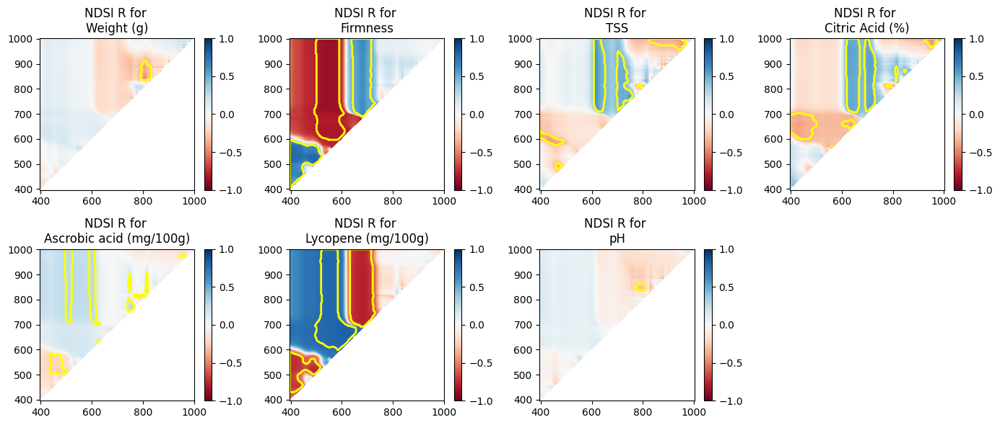

In [ ]:
from pycocotools import coco
import numpy as np
import cv2

def coco_annotations_to_masks(annotations_file, image_id):
    # Load the COCO annotations
    coco_data = coco.COCO(annotations_file)

    # Load the image information
    image_info = coco_data.loadImgs(image_id)[0]

    # Load the annotations for the given image
    annotation_ids = coco_data.getAnnIds(imgIds=image_id)
    annotations = coco_data.loadAnns(annotation_ids)

    # Create an empty mask
    mask = np.zeros((image_info['height'], image_info['width']), dtype=np.uint8)

    # Iterate over the annotations and draw binary masks
    for annotation in annotations:
        binary_mask = coco_data.annToMask(annotation)
        mask += binary_mask.astype(np.uint8)

    return  np.rot90(mask, k=1)


tomato_list.get_color_maps([])
def plot_heatmap_with_contours(heatmap, labeled_mask, waves=None, ax=None):
    if waves is None:
        waves = get_waves()

    if ax is None:
        fig, ax = plt.subplots()
        show_plot = True
    else:
        show_plot = False

    # Display the heatmap with a colorbar
    heatmap_img = ax.pcolormesh(waves, waves, heatmap, vmin=-1, vmax=1, cmap='RdBu')

    cbar = plt.colorbar(heatmap_img, ax=ax)

    # Find and draw contours of the labeled_mask areas
    contours, _ = cv2.findContours(labeled_mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    for contour in contours:
        # Convert contour coordinates for use with Matplotlib
        mpl_contour = contour[:, 0, ::-1]

        # Swap x and y coordinates
        mpl_contour = mpl_contour[:, ::-1]

        # Close the contour by adding the first point to the end of the contour
        mpl_contour = np.concatenate((mpl_contour, mpl_contour[[0], :]), axis=0)

        # Plot the contour on the heatmap
        ax.plot(waves[mpl_contour[:, 0]], waves[mpl_contour[:, 1]], linewidth=2, color='yellow')

    # # Reverse the y-axis labels
    # ax.set_yticks(ax.get_yticks())
    # ax.set_yticklabels(waves[::-1])

    # # Set the y-tick locations and labels
    # ytick_locs = np.linspace(0, 203, 9, dtype=int)
    # # ax.set_yticks(ytick_locs)
    # # ax.set_yticks(ytick_locs)
    # ax.set_yticklabels(labels=np.arange(1001,400,-100))


    if show_plot:
        plt.show()


# Find the number of heatmap columns for the multiplot
n_heatmaps = len(tomato_list.lab_results_df.columns.drop('area(cm^2)'))
n_columns = math.ceil(n_heatmaps / 2)

# Create a figure for the multiplot
fig, axes = plt.subplots(2, n_columns, figsize=(14, 6))

# Initialize a list to store all the outlines
all_outlines = []

for idx, col in enumerate(tomato_list.lab_results_df.columns.drop('area(cm^2)')):

    heatmap = np.array(tomato_list.R_dict[col])

    triangle_data = np.tril(heatmap)
    triangle_data2=triangle_data.copy()
    triangle_data2[np.triu_indices(heatmap.shape[0], k=1)] = None
    # Find the hotspots with adjustable sensitivity
    n_hotspots = 3
    if col=='pH':
      n_hotspots = 1
      min_percentile = 0.5 # Lower value for less sensitivity (bigger hotspots)
      max_percentile = 100  # Higher value for more sensitivity (smaller hotspots)
    elif col=='Ascrobic acid (mg/100g)':

      n_hotspots = 10
      min_percentile =1.5  # Lower value for less sensitivity (bigger hotspots)
      max_percentile = 96  # Higher value for more sensitivity (smaller hotspots)
    elif col=='TSS':
      n_hotspots=4
      min_percentile = 2  # Lower value for less sensitivity (bigger hotspots)
      max_percentile = 94  # Higher value for more sensitivity (smaller hotspots)
    elif col=='Firmness':
      n_hotspots=2
      min_percentile = 10 # Lower value for less sensitivity (bigger hotspots)
      max_percentile = 90  # Higher value for more sensitivity (smaller hotspots)
    elif col=='Lycopene (mg/100g)':
      n_hotspots=2
      min_percentile = 10  # Lower value for less sensitivity (bigger hotspots)
      max_percentile = 90  # Higher value for more sensitivity (smaller hotspots)
    elif col=='Weight (g)':
      n_hotspots=1
      min_percentile = 0.7 # Lower value for less sensitivity (bigger hotspots)
      max_percentile = 100  # Higher value for more sensitivity (smaller hotspots)
    else:
      n_hotspots=5
      min_percentile = 3  # Lower value for less sensitivity (bigger hotspots)
      max_percentile = 92.7  # Higher value for more sensitivity (smaller hotspots)

    labeled_mask = find_hotspots(triangle_data,col, n_hotspots, min_percentile, max_percentile)
    if col=='Ascrobic acid (mg/100g)':
      annotations_file = '/content/drive/MyDrive/Shared_tomato/Eitan/ascorbic acid R map hotspot annotations.json'
      labeled_mask = coco_annotations_to_masks(annotations_file, image_id= 1)
      labeled_mask = np.flip(labeled_mask, axis=0)

    # Draw the hotspot outlines on the heatmap
    row = idx // n_columns
    index = idx % n_columns
    # if col=='Ascrobic acid (mg/100g)':
    #     pass
    plot_heatmap_with_contours(heatmap=triangle_data2, labeled_mask=labeled_mask, ax=axes[row, index])

    axes[row, index].set_title(f'NDSI R for \n{col}')
    labeled_mask[labeled_mask != 0] += (idx * n_hotspots * 2)

    # Store the outlines for the combined plot
    all_outlines.append(labeled_mask)

# Remove the empty axis if there's an odd number of plots
if n_heatmaps % 2 != 0:
    axes[-1, -1].remove()

# Show the multiplot
plt.tight_layout()
plt.show()


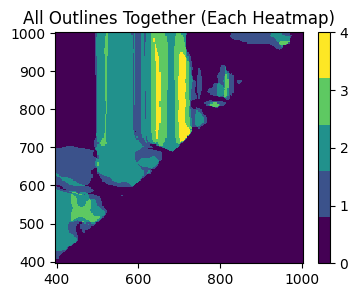

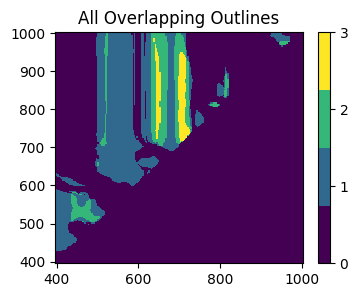

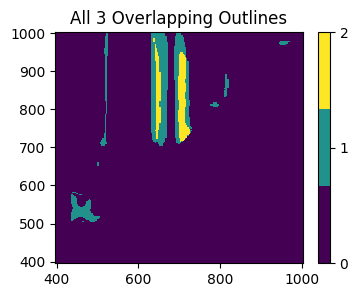

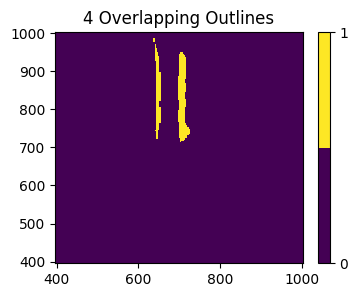

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Combine all outlines into a single array
combined_outlines = np.zeros_like(heatmap)
for outline in all_outlines:
    outline[outline != 0] = 1
    combined_outlines += outline

# Create a copy for processing overlaps
combined_outlines_overlaps = combined_outlines.copy()


# Process and display overlaps
def plot_overlaps(combined_outlines_overlaps,overlap_value, title):
    combined_outlines_temp = combined_outlines_overlaps.copy()
    # if overlap_value!=0:
    for i in range(overlap_value):
      combined_outlines_temp[combined_outlines_temp!=0]-=1
    fig, ax = plt.subplots(figsize=(4, 3))
    colormaps=cm.get_cmap('viridis',len(np.unique(combined_outlines_temp)) )
    waves = get_waves()
    psm = ax.pcolormesh(waves, waves, combined_outlines_temp, cmap=colormaps)
    cbar=fig.colorbar(psm, ax=ax)
    cbar.set_ticks(np.arange(len(np.unique(combined_outlines_temp))))
    ax.set_title(title)
    plt.show()

plot_overlaps(combined_outlines_overlaps,0, 'All Outlines Together (Each Heatmap)')
# Plot all overlapping outlines
plot_overlaps(combined_outlines_overlaps,1, 'All Overlapping Outlines')

plot_overlaps(combined_outlines_overlaps,2, 'All 3 Overlapping Outlines')

# Plot 3 overlapping outlines
plot_overlaps(combined_outlines_overlaps,3, '4 Overlapping Outlines')


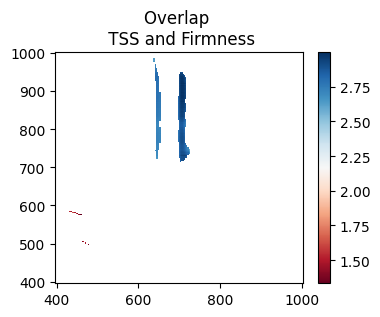

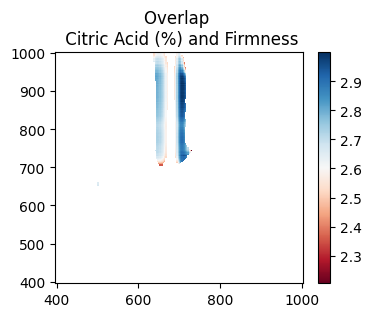

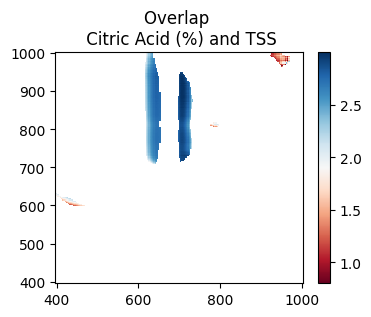

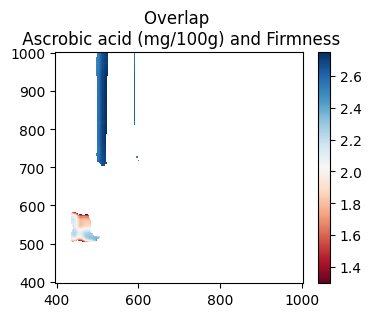

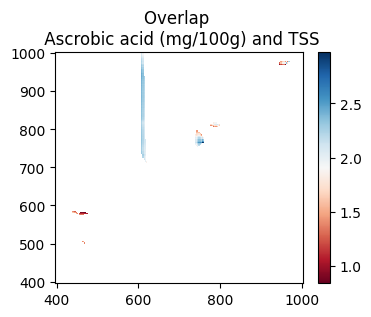

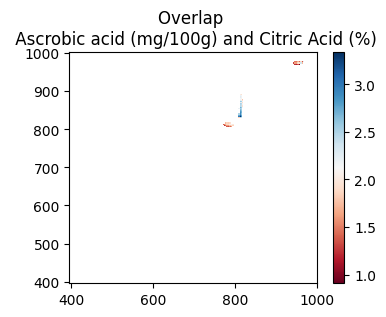

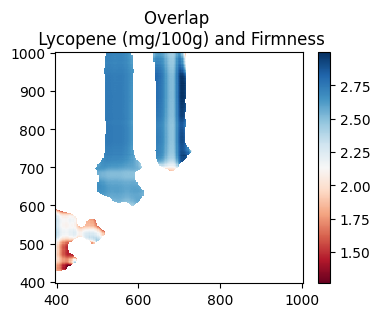

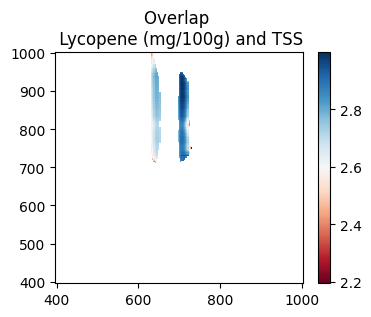

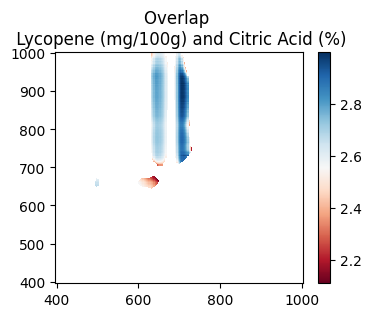

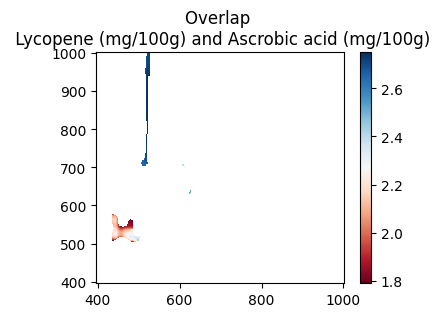

In [ ]:
#@title

evaluate_overlaps=np.zeros_like(combined_outlines_overlaps)

for col in tomato_list.lab_results_df.columns.drop('area(cm^2)'):
  heatmap=tomato_list.r_2_dict[col]
  for i in range(204):
    for j in range(204):
      # if combined_outlines_overlaps[i,j]==0:
        # continue

      evaluate_overlaps[i,j]+=heatmap[i,j]/heatmap.max()
# evaluate_overlaps=np.tril(evaluate_overlaps)
# evaluate_overlaps[evaluate_overlaps==0]=None

# Create a separate plot with all outlines together on each heatmap
# fig, ax = plt.subplots(figsize=(3,3))
combined_outlines = np.zeros_like(heatmap)
for i in all_outlines:
    i[i!=0] = 1
    combined_outlines += i

overlapping_areas = (combined_outlines > 1).astype(int)

# Create a dictionary to store overlapping information
overlaps = {}
stat_dict = {key: value for key, value in enumerate(tomato_list.lab_results_df.columns.drop('area(cm^2)'))}
waves=get_waves()
for idx, outline in enumerate(all_outlines):
    overlap_indices = np.where(np.logical_and(overlapping_areas, outline))
    if len(overlap_indices[0]) > 0:
        for i in range(len(all_outlines)):
            if i == idx or i>idx:
                continue
            other_outline = all_outlines[i]
            overlapping_pixels = np.where(np.logical_and(overlapping_areas, other_outline))
            if len(overlapping_pixels[0]) > 0:
                if idx not in overlaps:
                    overlaps[idx] = []
                overlaps[idx].append(i)
                pairwise_overlap = np.logical_and(outline, other_outline).astype(int)
                # Check if the number of overlapping pixels is greater than 100
                if len(pairwise_overlap[pairwise_overlap==1]) > 100:
                    # Display the overlapping areas between the current pair of outlines

                    fig, ax = plt.subplots(figsize=(4,3))

                    present=evaluate_overlaps*pairwise_overlap
                    present[present==0]=None

                    psm = ax.pcolormesh(waves,waves,present, cmap='RdBu')#vmin=data[~np.isnan(data)].min(),vmax=data[~np.isnan(data)].max()
                    fig.colorbar(psm, ax=ax)

                    # ax.imshow(present,'RdBu')
                    ax.set_title(f'Overlap \n {stat_dict[idx]} and {stat_dict[i]}')
                    plt.show()




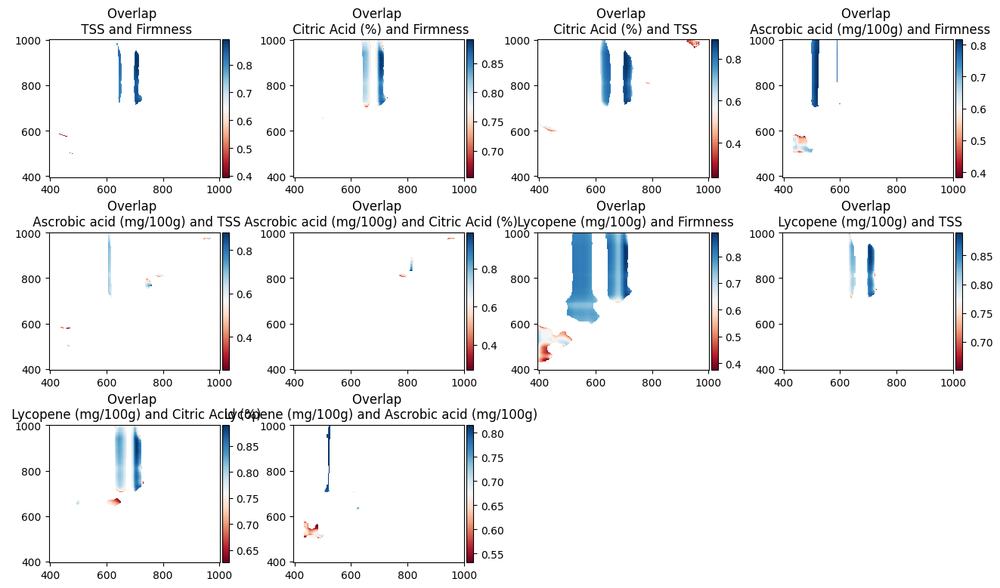

In [ ]:
evaluate_overlaps=create_evaluation_map(tomato_list)

# Calculate the number of pairwise overlaps with more than 100 pixels
num_plots = 0
for idx, outline in enumerate(all_outlines):
    for i in range(len(all_outlines)):
        if i == idx or i > idx:
            continue
        pairwise_overlap = np.logical_and(outline, all_outlines[i]).astype(int)
        if len(pairwise_overlap[pairwise_overlap == 1]) > 100:
            num_plots += 1
waves=get_waves()
# Calculate the number of rows and columns for the multiplot
num_columns = 4
num_rows = math.ceil(num_plots / num_columns)
double_overlaps={}
# Create the multiplot
fig, axes = plt.subplots(num_rows, num_columns, figsize=(4 * num_columns, 3 * num_rows))
current_plot = 0
stat_dict = {key: value for key, value in enumerate(tomato_list.lab_results_df.columns.drop('area(cm^2)'))}
for idx, outline in enumerate(all_outlines):
    for i in range(len(all_outlines)):
        if i == idx or i > idx:
            continue

        pairwise_overlap = np.logical_and(outline, all_outlines[i]).astype(int)

        if len(pairwise_overlap[pairwise_overlap == 1]) > 100:
            current_row = current_plot // num_columns
            current_col = current_plot % num_columns
            ax = axes[current_row, current_col]

            present = evaluate_overlaps * pairwise_overlap
            present[present == 0] = None

            psm = ax.pcolormesh(waves, waves, present, cmap='RdBu')
            ax.set_title(f'Overlap \n {stat_dict[idx]} and {stat_dict[i]}')
            fig.colorbar(psm, ax=ax, orientation='vertical', pad=0.01)
            current_plot += 1
            double_overlaps[stat_dict[idx],stat_dict[i]]=present

# Add a colorbar for the entire figure


# Remove unused axes
for i in range(current_plot, num_rows * num_columns):
    current_row = i // num_columns
    current_col = i % num_columns
    fig.delaxes(axes[current_row, current_col])

# Adjust spacing between subplots
fig.subplots_adjust(hspace=0.4)

plt.show()


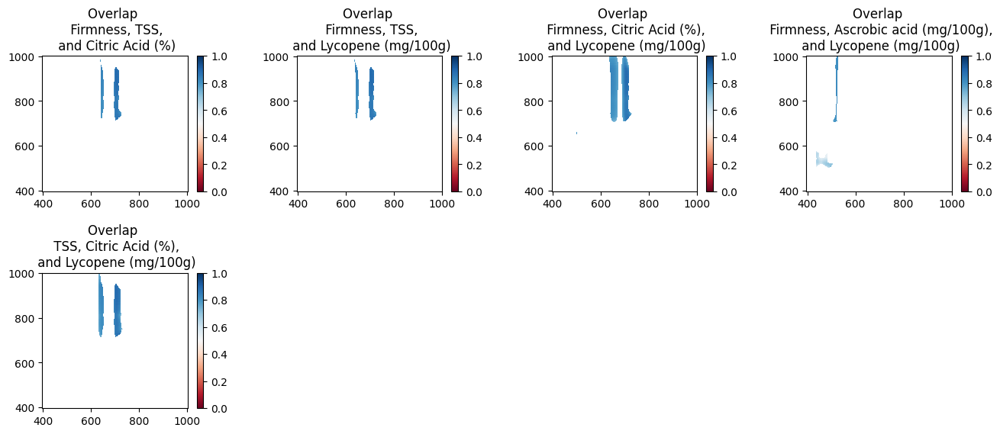

In [ ]:
import math
# Create a function to calculate overlapping areas between three outlines
def calculate_three_overlaps(outline1, outline2, outline3):
    pairwise_overlap_12 = np.logical_and(outline1, outline2).astype(int)
    pairwise_overlap_13 = np.logical_and(outline1, outline3).astype(int)
    pairwise_overlap_23 = np.logical_and(outline2, outline3).astype(int)

    three_overlap = np.logical_and(pairwise_overlap_12, pairwise_overlap_23).astype(int)

    return three_overlap

# Calculate the number of three-way overlaps with more than 100 pixels
num_plots = 0
for idx1, outline1 in enumerate(all_outlines):
    for idx2, outline2 in enumerate(all_outlines):
        for idx3, outline3 in enumerate(all_outlines):
            if idx1 >= idx2 or idx2 >= idx3:
                continue
            three_overlap = calculate_three_overlaps(outline1, outline2, outline3)
            if len(three_overlap[three_overlap == 1]) > 100:
                num_plots += 1

# Calculate the number of rows and columns for the multiplot
num_columns = 4
num_rows = math.ceil(num_plots / num_columns)
triple_overlaps={}
stat_dict = {key: value for key, value in enumerate(tomato_list.lab_results_df.columns.drop('area(cm^2)'))}
# Create the multiplot
fig, axes = plt.subplots(num_rows, num_columns, figsize=(4 * num_columns, 3 * num_rows))
current_plot = 0

for idx1, outline1 in enumerate(all_outlines):
    for idx2, outline2 in enumerate(all_outlines):
        for idx3, outline3 in enumerate(all_outlines):
            if idx1 >= idx2 or idx2 >= idx3:
                continue

            three_overlap = calculate_three_overlaps(outline1, outline2, outline3)

            if len(three_overlap[three_overlap == 1]) > 100:
                current_row = current_plot // num_columns
                current_col = current_plot % num_columns
                ax = axes[current_row, current_col]

                present = evaluate_overlaps * three_overlap
                present[present == 0] = None

                psm = ax.pcolormesh(waves, waves, present,vmax=1,vmin=0, cmap='RdBu')
                ax.set_title(f'Overlap \n {stat_dict[idx1]}, {stat_dict[idx2]},\n and {stat_dict[idx3]}')

                # Add a separate colorbar for each subplot
                fig.colorbar(psm, ax=ax)
                triple_overlaps[stat_dict[idx],stat_dict[idx2],stat_dict[idx3]]=present
                current_plot += 1

# Remove unused axes
for i in range(current_plot, num_rows * num_columns):
    current_row = i // num_columns
    current_col = i % num_columns
    fig.delaxes(axes[current_row, current_col])

# Adjust spacing between subplots
fig.subplots_adjust(hspace=0.6, wspace=0.4)

plt.show()


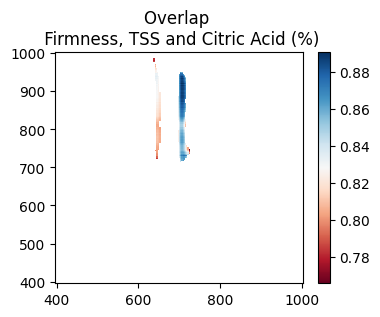

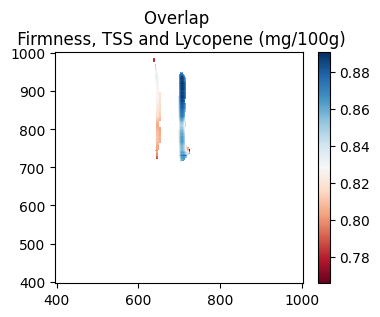

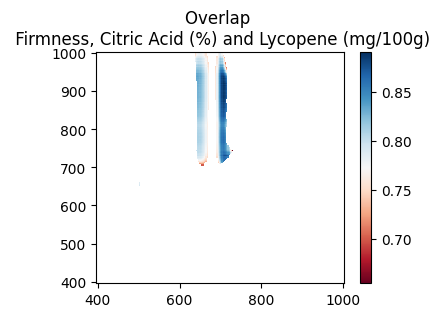

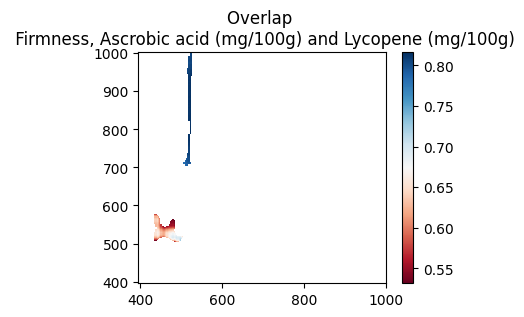

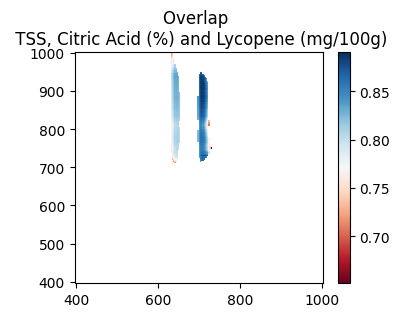

In [ ]:
#@title
# Create a function to calculate overlapping areas between three outlines
def calculate_three_overlaps(outline1, outline2, outline3):
    pairwise_overlap_12 = np.logical_and(outline1, outline2).astype(int)
    pairwise_overlap_13 = np.logical_and(outline1, outline3).astype(int)
    pairwise_overlap_23 = np.logical_and(outline2, outline3).astype(int)

    three_overlap = np.logical_and(pairwise_overlap_12, pairwise_overlap_23).astype(int)

    return three_overlap

waves=get_waves()
# Display the overlapping areas between the current triple of outlines
for idx1, outline1 in enumerate(all_outlines):
    for idx2, outline2 in enumerate(all_outlines):
        for idx3, outline3 in enumerate(all_outlines):
            if idx1 >= idx2 or idx2 >= idx3:
                continue

            three_overlap = calculate_three_overlaps(outline1, outline2, outline3)

            if len(three_overlap[three_overlap == 1]) > 100:
                present = evaluate_overlaps * three_overlap
                present[present == 0] = None
                fig, ax = plt.subplots(figsize=(4,3))
                psm = ax.pcolormesh(waves,waves,present, cmap='RdBu')#vmin=data[~np.isnan(data)].min(),vmax=data[~np.isnan(data)].max()
                fig.colorbar(psm, ax=ax)

                ax.set_title(f'Overlap \n {stat_dict[idx1]}, {stat_dict[idx2]} and {stat_dict[idx3]}')
                plt.show()


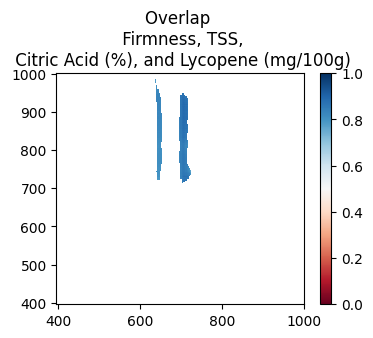

In [ ]:
# Create a function to calculate overlapping areas between four outlines
def calculate_four_overlaps(outline1, outline2, outline3, outline4):
    pairwise_overlap_12 = np.logical_and(outline1, outline2).astype(int)
    pairwise_overlap_13 = np.logical_and(outline1, outline3).astype(int)
    pairwise_overlap_14 = np.logical_and(outline1, outline4).astype(int)
    pairwise_overlap_23 = np.logical_and(outline2, outline3).astype(int)
    pairwise_overlap_24 = np.logical_and(outline2, outline4).astype(int)
    pairwise_overlap_34 = np.logical_and(outline3, outline4).astype(int)

    four_overlap = np.logical_and(pairwise_overlap_12, pairwise_overlap_13)
    four_overlap = np.logical_and(four_overlap, pairwise_overlap_14)
    four_overlap = np.logical_and(four_overlap, pairwise_overlap_23)
    four_overlap = np.logical_and(four_overlap, pairwise_overlap_24)
    four_overlap = np.logical_and(four_overlap, pairwise_overlap_34).astype(int)

    return four_overlap
four_overlaps={}
# Display the overlapping areas between the current quadruple of outlines
for idx1, outline1 in enumerate(all_outlines):
    for idx2, outline2 in enumerate(all_outlines):
        for idx3, outline3 in enumerate(all_outlines):
            for idx4, outline4 in enumerate(all_outlines):
                if idx1 >= idx2 or idx2 >= idx3 or idx3 >= idx4:
                    continue

                four_overlap = calculate_four_overlaps(outline1, outline2, outline3, outline4)

                if len(four_overlap[four_overlap == 1]) > 100:
                    present = evaluate_overlaps * four_overlap
                    present[present == 0] = None
                    fig, ax = plt.subplots(figsize=(4,3))
                    psm = ax.pcolormesh(waves,waves,present,vmax=1,vmin=0, cmap='RdBu')#vmin=data[~np.isnan(data)].min(),vmax=data[~np.isnan(data)].max()
                    fig.colorbar(psm, ax=ax)
                    ax.set_title(f'Overlap \n {stat_dict[idx1]}, {stat_dict[idx2]},\n {stat_dict[idx3]}, and {stat_dict[idx4]}')
                    plt.show()
                    four_overlaps[stat_dict[idx1], stat_dict[idx2],stat_dict[idx3],stat_dict[idx4]]=present

<ipython-input-96-87fa3af11578>:66: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "ro" (-> color='r'). The keyword argument will take precedence.
  ax.plot(waves[max_point_indices[1]], waves[max_point_indices[0]], 'ro', color='yellow')


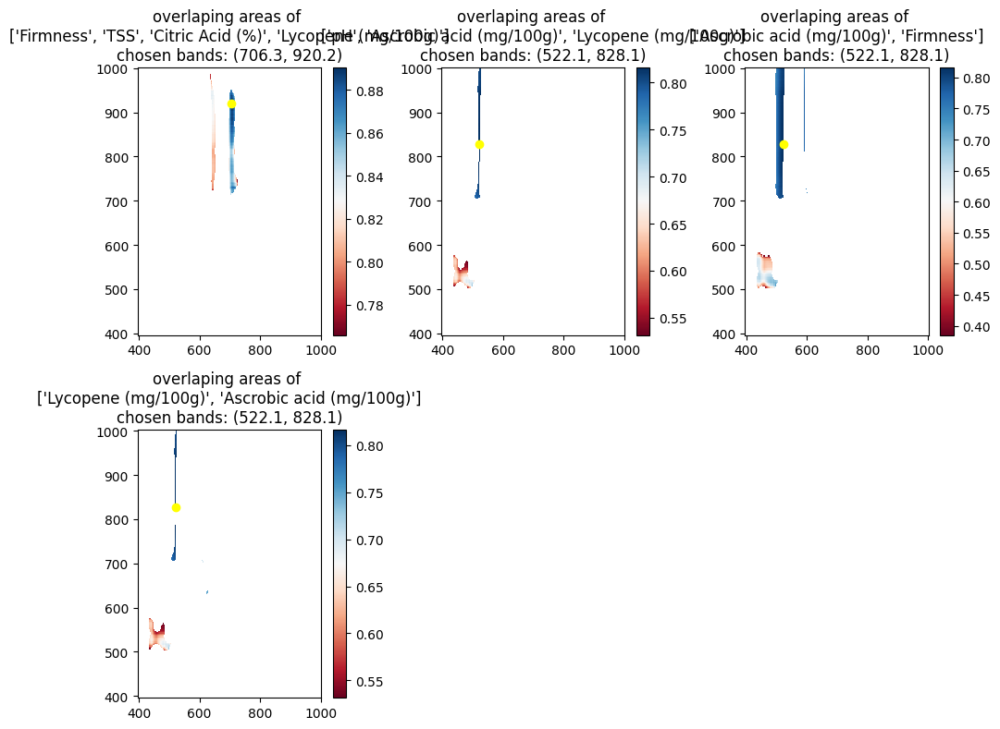

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
num_maps=4
def euclidean_distance(point1, point2):
    x1, y1 = point1
    x2, y2 = point2
    distance = math.sqrt((x2 - x1)**2 + (y2 - y1)**2)
    return distance
# Combine the overlaps, starting with the highest order
combined_overlaps = []
max_indecies={}
unique_parameters = set()

for overlap_dict in [four_overlaps, triple_overlaps, double_overlaps]:
    for key, value in overlap_dict.items():
        parameters = set(key)
        max_point_indices = np.unravel_index(np.nanargmax(value), value.shape)
        max_indecies[key]= (value,max_point_indices)

        if not unique_parameters.intersection(parameters):
            max_point_indices = np.unravel_index(np.nanargmax(value), value.shape)
            combined_overlaps.append((key, value, max_point_indices))
            unique_parameters.update(parameters)

#match choosen maps to num_maps
distences={}
chesen_bands=[i[-1] for i in combined_overlaps]
if len(combined_overlaps)>num_maps:
  combined_overlaps[:num_maps]
elif len(combined_overlaps)<num_maps:

  for key,(map,index1) in max_indecies.items():
    sum_dist=0
    for index2 in chesen_bands:
        sum_dist+=euclidean_distance(index1,index2)
    distences[key]=sum_dist
  while len(combined_overlaps)<num_maps:
    max_key = max(distences, key=distences.get)
    combined_overlaps.append((max_key, max_indecies[max_key][0], max_indecies[max_key][1]))
    distences[max_key]=0
NDSI_bands = []
waves=get_waves()
# Calculate the number of rows and columns for the multiplot
n_plots = len(combined_overlaps)


n_cols = 3
n_rows = int(np.ceil(n_plots / n_cols))

waves = get_waves()

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(10, n_rows * 4))

# Print the combined overlaps with maximum point indices and create subplots
for idx, (key, value, max_point_indices) in enumerate(combined_overlaps):
    NDSI_bands += [max_point_indices]

    # Select the appropriate axis
    ax = axes.flatten()[idx]

    # Plot the heatmap
    psm = ax.pcolormesh(waves, waves, value, cmap='RdBu')
    fig.colorbar(psm, ax=ax)

    # Plot the maximum point indices
    ax.plot(waves[max_point_indices[1]], waves[max_point_indices[0]], 'ro', color='yellow')

    # Set title
    ax.set_title(f'overlaping areas of \n{[i for i in key]}\nchosen bands: {waves[max_point_indices[1]],waves[max_point_indices[0]]}')

# Remove unused axes
for idx in range(len(combined_overlaps), n_rows * n_cols):
    fig.delaxes(axes.flatten()[idx])

plt.tight_layout()
plt.show()



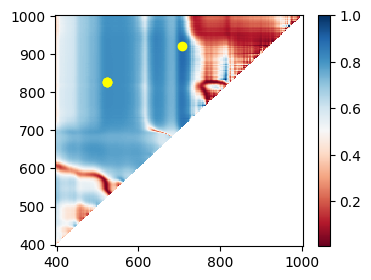

In [ ]:
evaluate_overlaps=create_evaluation_map(tomato_list)

fig, ax = plt.subplots(figsize=(4,3))
psm = ax.pcolormesh(waves,waves,evaluate_overlaps, cmap='RdBu')#vmin=data[~np.isnan(data)].min(),vmax=data[~np.isnan(data)].max()
fig.colorbar(psm, ax=ax)
for i,j in NDSI_bands:
  ax.plot(waves[j],waves[i],'o',color='yellow')

plt.show()

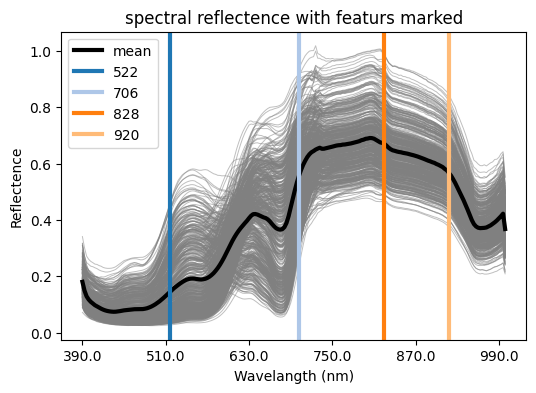

In [ ]:
# if len(NDSI_bands)>=3:
#   NDSI_bands[2]=(83,14)
# if len(NDSI_bands)>=4:
#   NDSI_bands[3]=(148,43)
plot_spectral_feturs(tomato_list,np.unique(NDSI_bands))

In [ ]:
# regretionplot_best_bands_normalized(tomato_list, NDSI_bands)

###other band selection methods (needs editing/deleting)

<ipython-input-56-86b4698ce98f>:29: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "ro" (-> color='r'). The keyword argument will take precedence.
  ax.plot(j, i, 'ro', color='yellow')


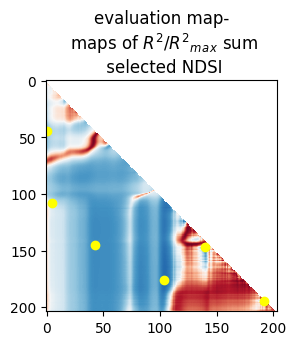

In [ ]:

evaluate_overlaps=np.zeros_like(combined_outlines_overlaps)

for col in tomato_list.lab_results_df.columns.drop('area(cm^2)'):
  heatmap=tomato_list.r_2_dict[col]
  for i in range(204):
    for j in range(204):
      # if combined_outlines_overlaps[i,j]==0:
        # continue

      evaluate_overlaps[i,j]+=heatmap[i,j]/heatmap.max()
evaluate_overlaps=np.tril(evaluate_overlaps)
evaluate_overlaps[evaluate_overlaps==0]=None


# Assuming heatmap is the original float heatmap and label_mask is the label mask
connected_regions, num_regions = ndimage.label(combined_outlines_overlaps)
significant_areas = []
for region_idx in range(1, num_regions + 1):
    # Find the mask for the current connected region
    region_mask = (connected_regions == region_idx)
    area_indices = np.where(connected_regions == region_idx)
    masked_heatmap = evaluate_overlaps * region_mask
    max_index = np.argmax(masked_heatmap[area_indices])
    max_index_in_area = (area_indices[0][max_index], area_indices[1][max_index])
    significant_areas.append(max_index_in_area)

fig, ax = plt.subplots(figsize=(3,3))
for i,j in significant_areas:
  ax.plot(j, i, 'ro', color='yellow')

ax.set_title('evaluation map-\n maps of $R^2/R^2$$_m$$_a$$_x$ sum\n selected NDSI')


ax.imshow(evaluate_overlaps,cmap='RdBu')



Significant areas: [(44, 0), (145, 43), (176, 104)]
Number of bands: 6


<ipython-input-57-be160f55a2b8>:45: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "ro" (-> color='r'). The keyword argument will take precedence.
  ax.plot(j, i, 'ro', color='yellow')


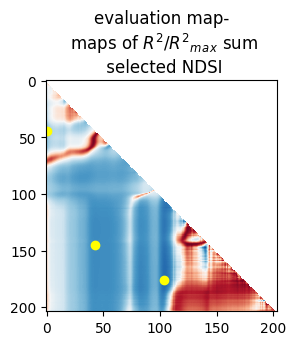

In [ ]:


heatmap = evaluate_overlaps  # your original float heatmap
label_mask = combined_outlines_overlaps  # your label mask
num_of_bands = 6 # the desired number of bands

# Find connected regions in the label mask
connected_regions, num_regions = scipy.ndimage.label(label_mask)

# Initialize variables for adjusting the minimum number of pixels per group
min_pixels_per_group = 15
num_bands = 0

# Iterate until the desired number of bands is achieved
while num_bands != num_of_bands:
    # Find significant areas with the current minimum number of pixels per group
    significant_areas = []
    for region_idx in range(1, num_regions + 1):
        # Find the mask for the current connected region
        region_mask = (connected_regions == region_idx)
        area_indices = np.where(connected_regions == region_idx)
        if len(area_indices[0]) < min_pixels_per_group:
            continue
        masked_heatmap = heatmap * region_mask
        max_index = np.argmax(masked_heatmap[area_indices])
        max_index_in_area = (area_indices[0][max_index], area_indices[1][max_index])
        while abs(max_index_in_area[0]-max_index_in_area[1])<5:
          masked_heatmap[max_index_in_area]=0
          max_index = np.argmax(masked_heatmap[area_indices])
          max_index_in_area = (area_indices[0][max_index], area_indices[1][max_index])

        significant_areas.append(max_index_in_area)

    # Adjust the minimum number of pixels per group based on the number of bands found
    num_bands = len(np.unique(significant_areas))
    if num_bands < num_of_bands:
        min_pixels_per_group -= 1
    elif num_bands > num_of_bands:
        min_pixels_per_group += 1
    if min_pixels_per_group==5000:
      break
# Print the resulting significant areas and number of bands
print("Significant areas:", significant_areas)
print("Number of bands:", num_bands)
fig, ax = plt.subplots(figsize=(3,3))
for i,j in significant_areas:
  ax.plot(j, i, 'ro', color='yellow')

ax.set_title('evaluation map-\n maps of $R^2/R^2$$_m$$_a$$_x$ sum\n selected NDSI')

ax.imshow(evaluate_overlaps,cmap='RdBu')




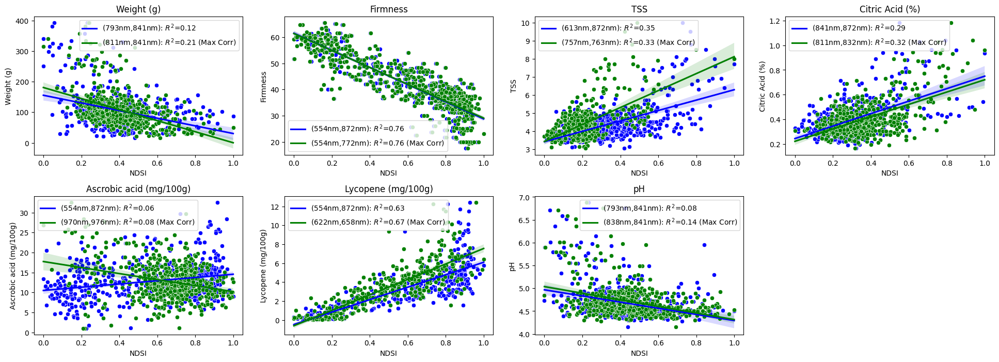

In [ ]:
regretionplot_best_bands_normalized(tomato_list,NDSI_bands)

<ipython-input-59-a1851f5b8a57>:15: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "ro" (-> color='r'). The keyword argument will take precedence.
  ax.plot(j, i, 'ro', color='yellow')


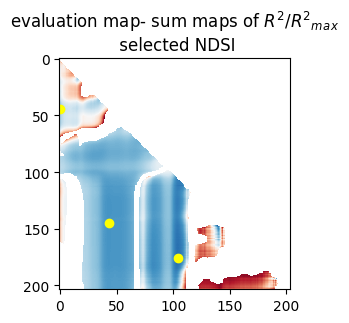

In [ ]:
evaluate_overlaps=np.zeros_like(combined_outlines_overlaps)

for col in tomato_list.lab_results_df.columns.drop('area(cm^2)'):
  heatmap=tomato_list.r_2_dict[col]
  for i in range(204):
    for j in range(204):
      if combined_outlines_overlaps[i,j]==0:
        continue

      evaluate_overlaps[i,j]+=heatmap[i,j]/heatmap.max()
evaluate_overlaps=np.tril(evaluate_overlaps)
evaluate_overlaps[evaluate_overlaps==0]=None
fig, ax = plt.subplots(figsize=(3,3))
for i,j in significant_areas:
  ax.plot(j, i, 'ro', color='yellow')

ax.set_title('evaluation map- sum maps of $R^2/R^2$$_m$$_a$$_x$\n selected NDSI')

ax.imshow(evaluate_overlaps,cmap='RdBu')


In [ ]:
# significant_areas[1]=(145,44)
NDSI_bands=significant_areas
NDSI_bands

[(44, 0), (145, 43), (176, 104)]

Calculating R-squared values: 100%|██████████| 7/7 [00:00<00:00, 642.68it/s]


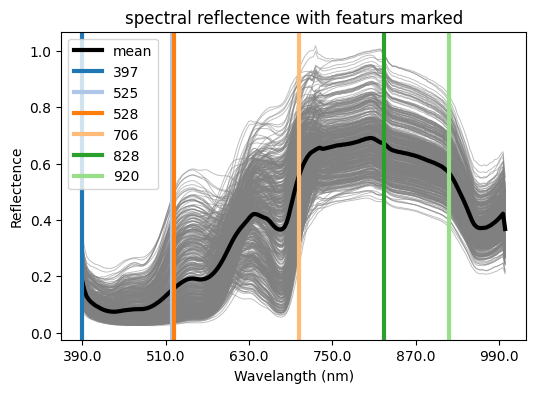

In [ ]:
all_bands=np.unique(significant_areas)

final_bands=np.unique(get_best_NDSI_combinations(tomato_list,all_bands,number_bands_to_select=5))

plot_spectral_feturs(tomato_list,all_bands)

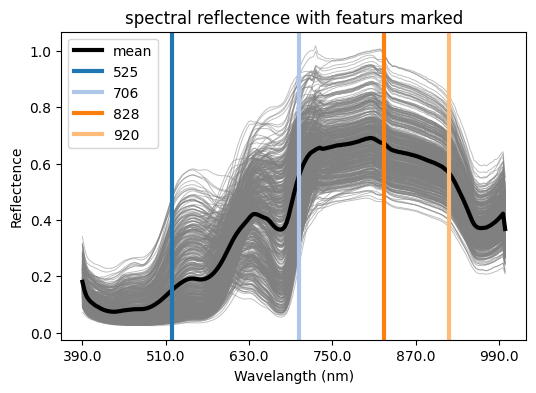

In [ ]:
plot_spectral_feturs(tomato_list,final_bands)


#regretion plots of NI model best fit

##regretion plots for harvests 1-5

###by cultivar

In [ ]:
regretionplot(tomato_list2345)

AttributeError: ignored

ValueError: ignored

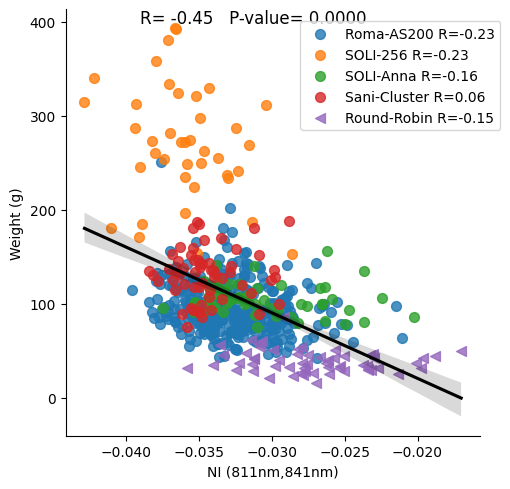

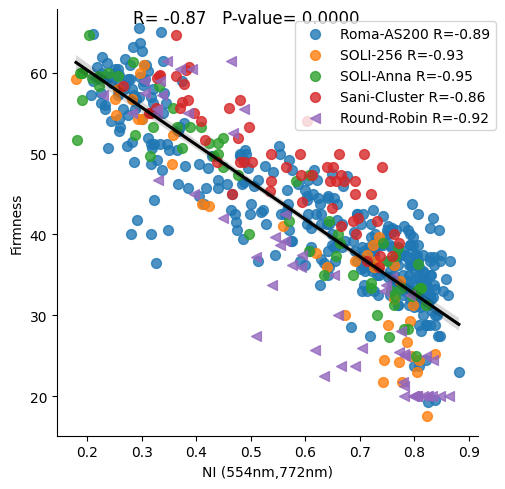

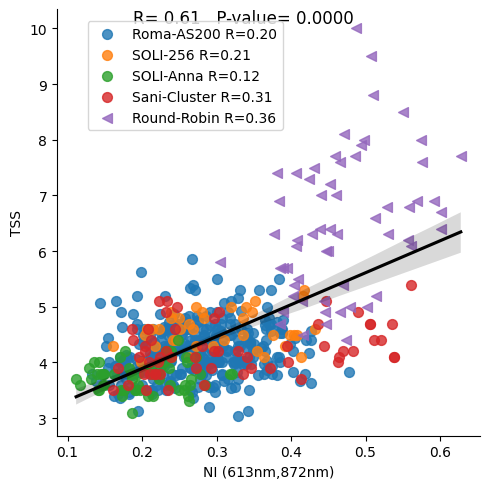

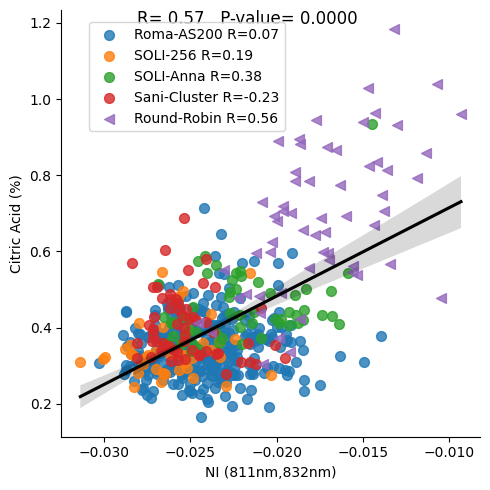

In [ ]:
regretion_date_cultivar(tomato_list,by_cultivar=True,all_reg_lines=False ,big_reg_line=True)

###by date

ValueError: ignored

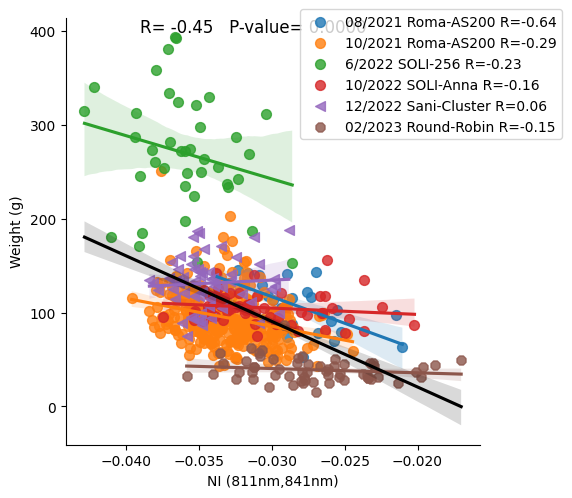

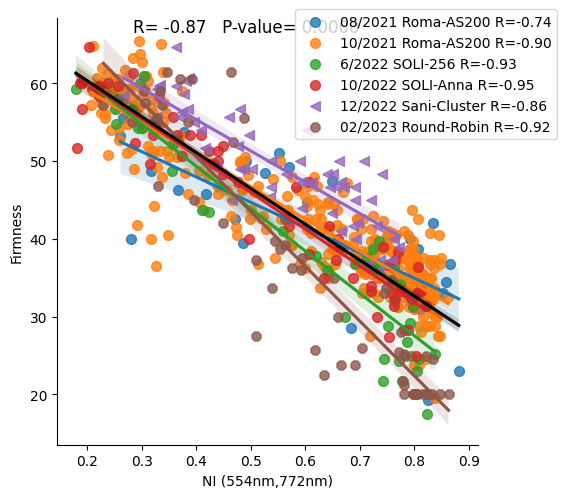

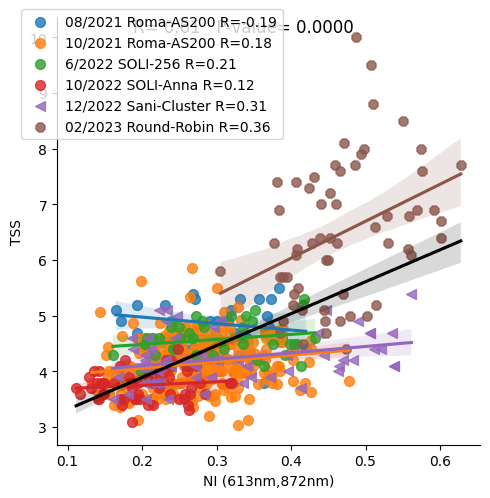

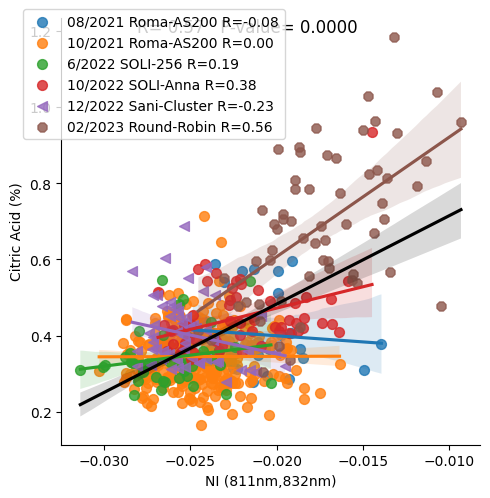

In [ ]:
regretion_date_cultivar(tomato_list,by_cultivar=False,all_reg_lines=True ,big_reg_line=True)

##regretion plots for harvests 1-4

In [ ]:
regretionplot(tomato_list1234)

##regretion plots for harvests 1,3,4,5

###by fruit color

In [ ]:

regretionplot(tomato_list1345)#,r_2)


###by cultivar

In [ ]:

regretion_date_cultivar(tomato_list1345,by_cultivar=True,all_reg_lines=True ,big_reg_line=True)

###by date

In [ ]:
regretion_date_cultivar(tomato_list1345,by_cultivar=False,all_reg_lines=True ,big_reg_line=True)


##regretion plots for harvests 1,3,4

In [ ]:
regretionplot(tomato_list134)

##regretion plots for harvests 1

In [ ]:
regretionplot(tomato_list1)

##regretion plots for harvest 2


In [ ]:
regretionplot(tomato_list2)

##regretion plots for harvests 3


In [ ]:
regretionplot(tomato_list3)

##regretion plots for harvest 4


In [ ]:
regretionplot(tomato_list4)

##regretion plots for harvest 5


In [ ]:
regretionplot(tomato_list5)

#Lab results corrolations

In [ ]:
def lab_corolations(tomato_list,by_cultivar=None ,threshold=0.2,log=False,fit_ax=True):

  colors=get_color_groups(tomato_list)
  cols=colors.columns
  colors[colors<0]=None
  if by_cultivar==True:
    colors['color'],marker_dict=cultivar_column(tomato_list)
  elif by_cultivar==False:
    colors['color'],marker_dict=date_column(tomato_list)
  elif by_cultivar==None:
    color_dict={1:'unripe',2:'half ripe',3:'ripe'}
    colors['color']=[color_dict[i] for i in colors['color']]
    palette= {'unripe':"lime",'half ripe':"orange",'ripe':"r"}
      # Create a figure and axis for each facet
    fig, axes = plt.subplots(nrows= len(colors.columns)-1, ncols= len(colors.columns)-1, figsize=(25,25 ))
    fig.tight_layout()
    # Flatten the array of axes
    for i in range( len(colors.columns)-1):
      for j in range( len(colors.columns)-2,-1,-1):
        ax = axes[i,j]
        if i<j:
          ax.set_visible(False)
          continue
        if i==j:
          sns.kdeplot(data=colors,x=colors.columns[j],hue='color',palette=palette,fill=True,common_norm=False,alpha=0.5,ax=ax)
          # handles1, labels1 = ax.get_legend_handles_labels()
          # ax.legend().set_visible(False)
          continue
        kde=sns.kdeplot(data=colors, y=colors.columns[i], x=colors.columns[j],hue='color',palette=palette,levels=1,alpha=0.7,ax=ax)
        scatter=sns.scatterplot(data=colors,x=colors.columns[j],y=colors.columns[i],color='k',s=6,alpha=0.8,ax=ax)
        ax.legend().set_visible(False)
        slope, intercept, r_value, p_value, std_err = stats.linregress(colors.iloc[:, j], colors.iloc[:, i])
        step=0
        if p_value<0.05:
          sns.regplot(data=colors, x=colors.iloc[:, j], y=colors.iloc[:, i],color='k', ax=ax,scatter=False)
          x_pos, y_pos = 0.7,(0.9-step)
          ax.annotate(f'R$^2$={r_value**2:.2f}', xy=(x_pos, y_pos), fontsize=12,color='k',xycoords='axes fraction');
          step+=0.07
        for label,color in palette.items():
          np.unique(colors['color'])
          temp=colors[colors['color']==label]
          slope, intercept, r_value, p_value, std_err = stats.linregress(temp.iloc[:, j], temp.iloc[:, i])
          annotation_coords = []
          if abs(p_value) <0.05:
              # Create regression lines
              # f = lambda x: slope*x +intercept
              # x = np.array([min(temp.iloc[:, j]),max(temp.iloc[:, j])])
              line=sns.regplot(data=temp, x=temp.iloc[:, j], y=temp.iloc[:, i], label=label,color=color, ax=ax,scatter=False)
              r_square = r_value**2
              x_pos, y_pos = 0.7,(0.9-step)
              annotation=ax.annotate(f'R$^2$={r_square:.2f}', xy=(x_pos, y_pos), fontsize=12,color=color,xycoords='axes fraction');
              step+=0.07
    return
  c=['b','orange','g','r','c','m','c']
  palette=c[:len(np.unique(colors['color']))]
  #orgenizing data for ploting
  # Create a figure and axis
  fig, axes = plt.subplots(nrows= len(colors.columns)-1, ncols= len(colors.columns)-1, figsize=(25,25 ))
  fig.tight_layout()
  negetive=6
  for i in range( len(colors.columns)-1):
    for j in range( len(colors.columns)-2,-1,-1):
      ax = axes[i,j]
      if i<j:
        ax.set_visible(False)
        continue
      if i==j:
        sns.kdeplot(data=colors,x=colors.columns[j],hue='color',palette=palette,fill=True,common_norm=False,alpha=0.5,ax=ax)
        handles1, labels1 = ax.get_legend_handles_labels()
        plt.legend(handles1, labels1, loc='center right', bbox_to_anchor=(1.3, 0.5))
        # ax.legend().set_visible(False)
        continue
      kde=sns.kdeplot(data=colors, y=colors.columns[i], x=colors.columns[j],hue='color',palette=palette,levels=1,alpha=0.7,ax=ax)
      scatter=sns.scatterplot(data=colors,x=colors.columns[j],y=colors.columns[i],color='k',s=6,alpha=0.8,ax=ax)
      ax.legend().set_visible(False)
      slope, intercept, r_value, p_value, std_err = stats.linregress(colors.iloc[:, j], colors.iloc[:, i])
      step=0
      if p_value<0.05:
          sns.regplot(data=colors, x=colors.iloc[:, j], y=colors.iloc[:, i],color='k', ax=ax,scatter=False)
          x_pos, y_pos = 0.7,(0.9-step)
          ax.annotate(f'R$^2$={r_value**2:.2f}', xy=(x_pos, y_pos), fontsize=12,color='k',xycoords='axes fraction');
          step+=0.07
      for label,color in zip(np.unique(colors['color']),palette):
          temp=colors[colors['color']==label]

          slope, intercept, r_value, p_value, std_err = stats.linregress(temp.iloc[:, j], temp.iloc[:, i])
          annotation_coords = []
          if abs(p_value) <0.05:
              # Create regression lines
              # f = lambda x: slope*x +intercept
              # x = np.array([min(temp.iloc[:, j]),max(temp.iloc[:, j])])
              line=sns.regplot(data=temp, x=temp.iloc[:, j], y=temp.iloc[:, i], label=label,color=color, ax=ax,scatter=False)
              r_square = r_value**2
              x_pos, y_pos = 0.7,(0.9-step)
              annotation=ax.annotate(f'R$^2$={r_square:.2f}', xy=(x_pos, y_pos), fontsize=12,color=color,xycoords='axes fraction');
              step+=0.07
              print(label,color)


      # for label,color in zip(np.unique(colors['color']),c[:len(np.unique(colors['color']))]):
      #   np.unique(colors['color'])
      #   temp=colors[colors['color']==label]
      #   # slope, intercept, r_value, p_value, std_err = stats.linregress(temp.iloc[:, j], temp.iloc[:, i])
      #   annotation_coords = []
      #   if p_value<0.05:
      #     sns.regplot(data=colors, x=colors.iloc[:, j], y=colors.iloc[:, i], label=label,color='k', ax=ax,scatter=False)
      #     x_pos, y_pos = 0.7,(0.9-step)
      #     ax.annotate(f'R$^2$={r_value**2:.2f}', xy=(x_pos, y_pos), fontsize=12,color=color,xycoords='axes fraction');
      #     step+=0.07

        # if abs(p_value) <0.05:
        #     # Create regression lines
        #     f = lambda x: slope*x +intercept
        #     x = np.array([min(temp.iloc[:, j]),max(temp.iloc[:, j])])
        #     line=sns.regplot(data=temp, x=temp.iloc[:, j], y=temp.iloc[:, i], label=label,color=color, ax=ax,scatter=False)
        #     r_square = r_value**2
        #     x_pos, y_pos = 0.7,(0.9-step)
        #     annotation=ax.annotate(f'R$^2$={r_square:.2f}', xy=(x_pos, y_pos), fontsize=12,color=color,xycoords='axes fraction');
        #     step+=0.07


In [ ]:
c=['b','orange','g','r','c','m','c']

colors=get_color_groups(tomato_list)
cols=colors.columns
colors[colors<0]=None
colors['color'],marker_dict=cultivar_column(tomato_list)
palette=c[:len(np.unique(colors['color']))]
# Organizing data for plotting
# Create a figure and axis
fig, axes = plt.subplots(nrows=len(colors.columns)-1, ncols=len(colors.columns)-1, figsize=(25, 25))
fig.tight_layout()
negetive = 6
for i in range(len(colors.columns)-1):
    for j in range(len(colors.columns)-2, -1, -1):
        ax = axes[i, j]
        if i < j:
            ax.set_visible(False)
            continue
        if i == j:
            sns.kdeplot(data=colors, x=colors.columns[j], hue='color', palette=palette, fill=True, common_norm=False, alpha=0.5, ax=ax)
            ax.legend().set_visible(False)
            continue
        kde = sns.kdeplot(data=colors, y=colors.columns[i], x=colors.columns[j], hue='color', palette=palette, levels=1, alpha=0.7, ax=ax)
        scatter = sns.scatterplot(data=colors, x=colors.columns[j], y=colors.columns[i], color='k', s=6, alpha=0.8, ax=ax)
        ax.legend().set_visible(False)
        slope, intercept, r_value, p_value, std_err = stats.linregress(colors.iloc[:, j], colors.iloc[:, i])
        step = 0
        if p_value < 0.05:
            sns.regplot(data=colors, x=colors.iloc[:, j], y=colors.iloc[:, i], color='k', ax=ax, scatter=False)
            x_pos, y_pos = 0.7, (0.9 - step)
            ax.annotate(f'R$^2$={r_value**2:.2f}', xy=(x_pos, y_pos), fontsize=12, color='k', xycoords='axes fraction')
            step += 0.07
        for label, color in zip(np.unique(colors['color']), palette):
          temp = colors[colors['color'] == label]
          slope, intercept, r_value, p_value, std_err = stats.linregress(temp.iloc[:, j], temp.iloc[:, i])
          annotation_coords = []
          if abs(p_value) < 0.05:
              line_color = palette[np.where(np.unique(colors['color']) == label)[0][0]]
              line = sns.regplot(data=temp, x=temp.iloc[:, j], y=temp.iloc[:, i], label=label, color=line_color, ax=ax, scatter=False)
              r_square = r_value**2
              x_pos, y_pos = 0.7, (0.9 - step)
              annotation = ax.annotate(f'R$^2$={r_square:.2f}', xy=(x_pos, y_pos), fontsize=12, color=line_color, xycoords='axes fraction')
              step += 0.07
# ]
# labels = []
# for label, color in zip(np.unique(colors['color']), palette):
#     patch = plt.Line2D([0], [0], marker='o', color=color, label=label, linestyle='')
#     handles.append(patch)
#     labels.append(label)

# # Add the custom legend to the figure
# fig.legend(handles, labels, loc='center right', bbox_to_anchor=(1.15, 0.5), title='Color')


TypeError: ignored

##Lab results corrolations harvest 1-6

##by ripening stage

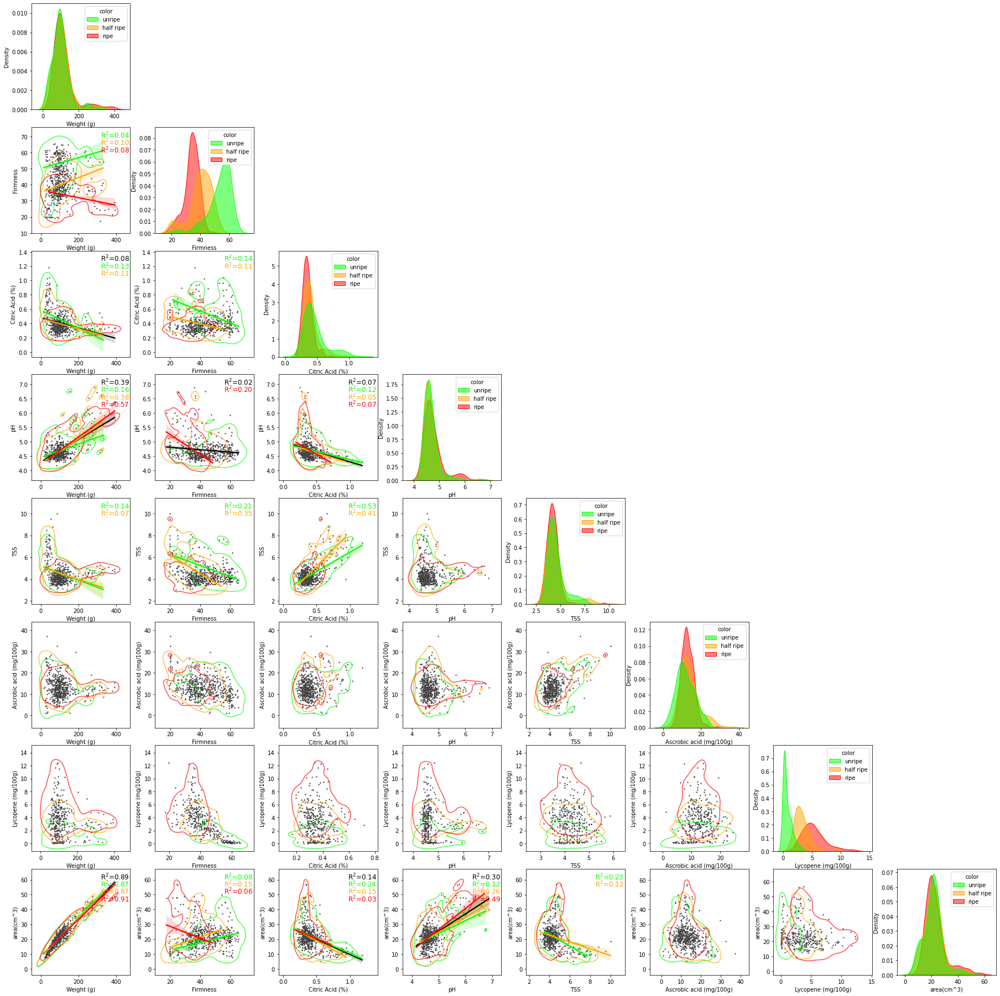

In [ ]:

lab_corolations(tomato_list)


## by cultivar

In [ ]:
lab_corolations(TomatoList(harvest_list[:]),by_cultivar=True )
# lab_corolations(tomato_list,by_cultivar=True , log=True)


TypeError: ignored

12/2022 Sani-Cluster c
6/2022 SOLI-256 m


10/2022 SOLI-Anna r
6/2022 SOLI-256 m


6/2022 SOLI-256 m


10/2022 SOLI-Anna r
12/2022 Sani-Cluster c


10/2022 SOLI-Anna r
12/2022 Sani-Cluster c
6/2022 SOLI-256 m


08/2021 Roma-AS200 orange


08/2021 Roma-AS200 orange
6/2022 SOLI-256 m


6/2022 SOLI-256 m


12/2022 Sani-Cluster c
6/2022 SOLI-256 m


08/2021 Roma-AS200 orange
6/2022 SOLI-256 m


08/2021 Roma-AS200 orange
6/2022 SOLI-256 m


6/2022 SOLI-256 m


08/2021 Roma-AS200 orange
6/2022 SOLI-256 m


6/2022 SOLI-256 m


6/2022 SOLI-256 m


08/2021 Roma-AS200 orange
10/2021 Roma-AS200 g
10/2022 SOLI-Anna r
12/2022 Sani-Cluster c
6/2022 SOLI-256 m


10/2022 SOLI-Anna r


10/2022 SOLI-Anna r
12/2022 Sani-Cluster c
6/2022 SOLI-256 m


10/2022 SOLI-Anna r


10/2022 SOLI-Anna r


10/2022 SOLI-Anna r
12/2022 Sani-Cluster c


10/2022 SOLI-Anna r
12/2022 Sani-Cluster c
6/2022 SOLI-256 m


12/2022 Sani-Cluster c


08/2021 Roma-AS200 orange
10/2021 Roma-AS200 g
10/2022 SOLI-Anna r
12/2022 Sani-Cluster c
6/2022 SOLI-256 m


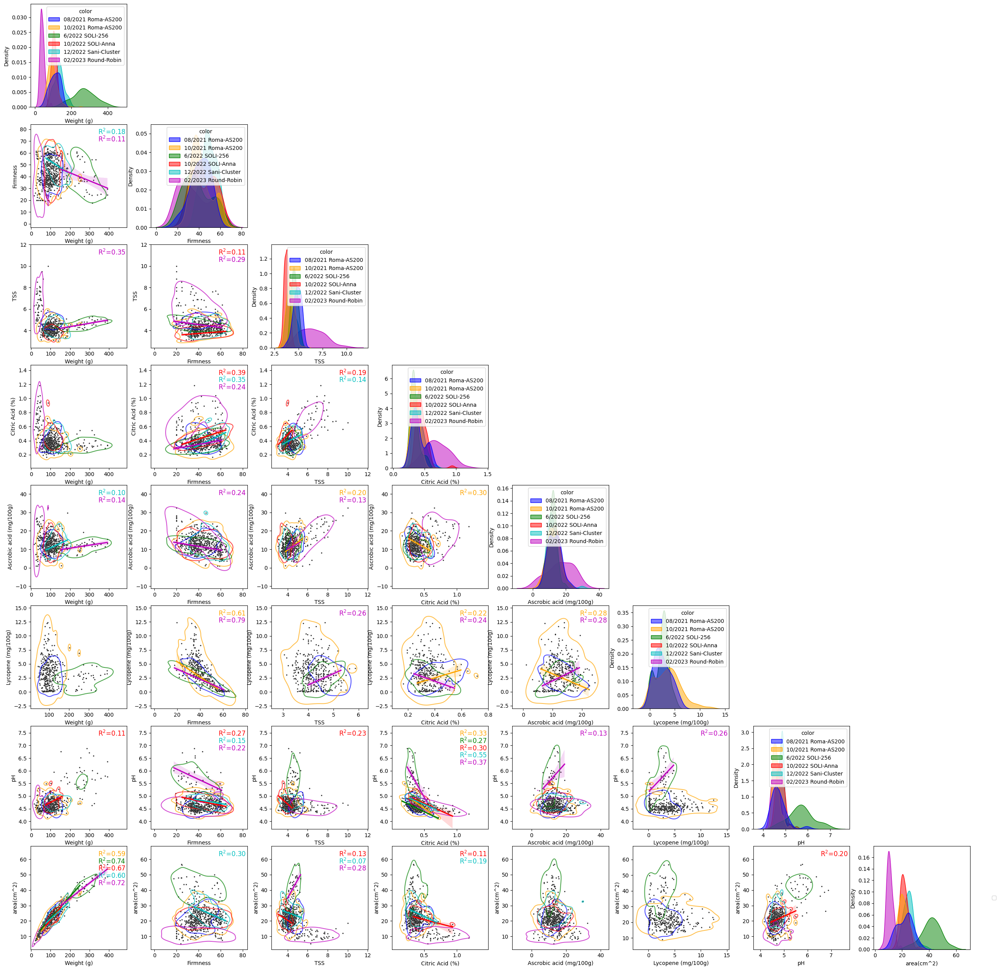

In [ ]:
lab_corolations(tomato_list,by_cultivar=False )

##Lab results corrolations harvest 1,3,4,5


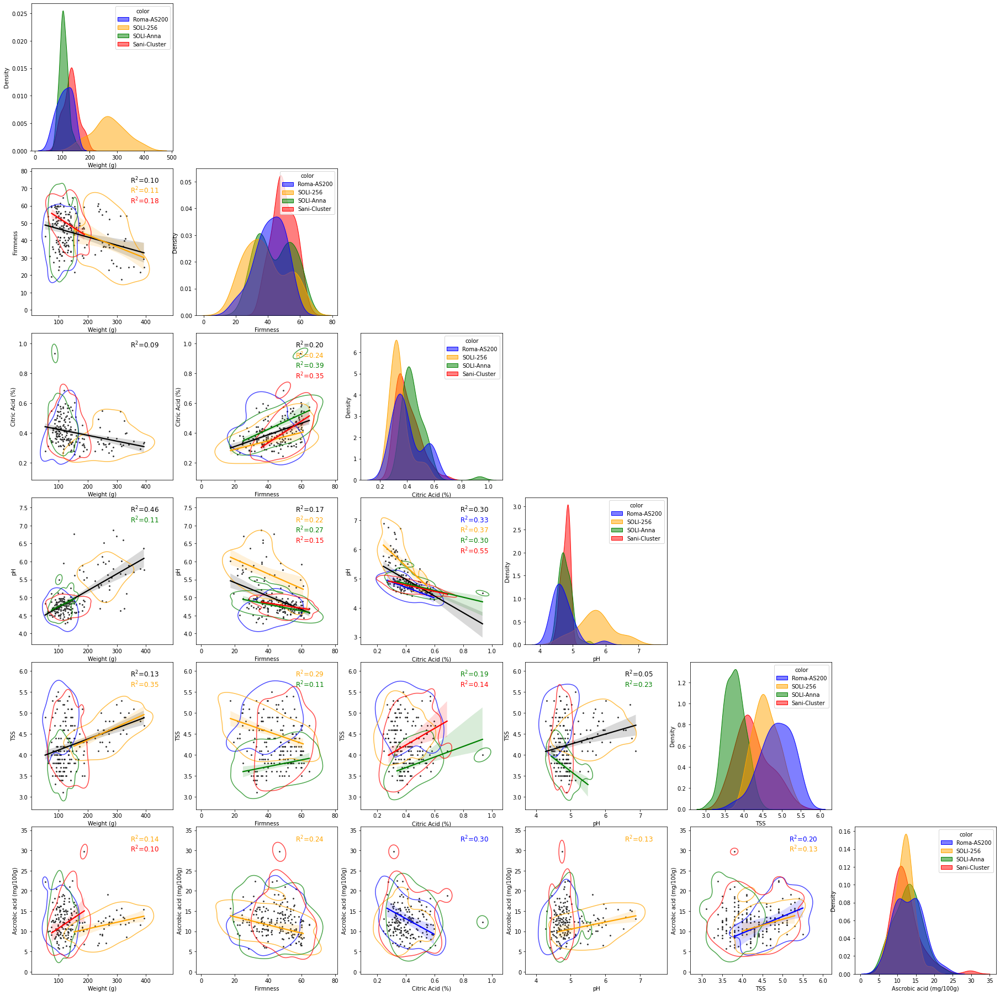

In [ ]:
lab_corolations(tomato_list1345,by_cultivar=True )


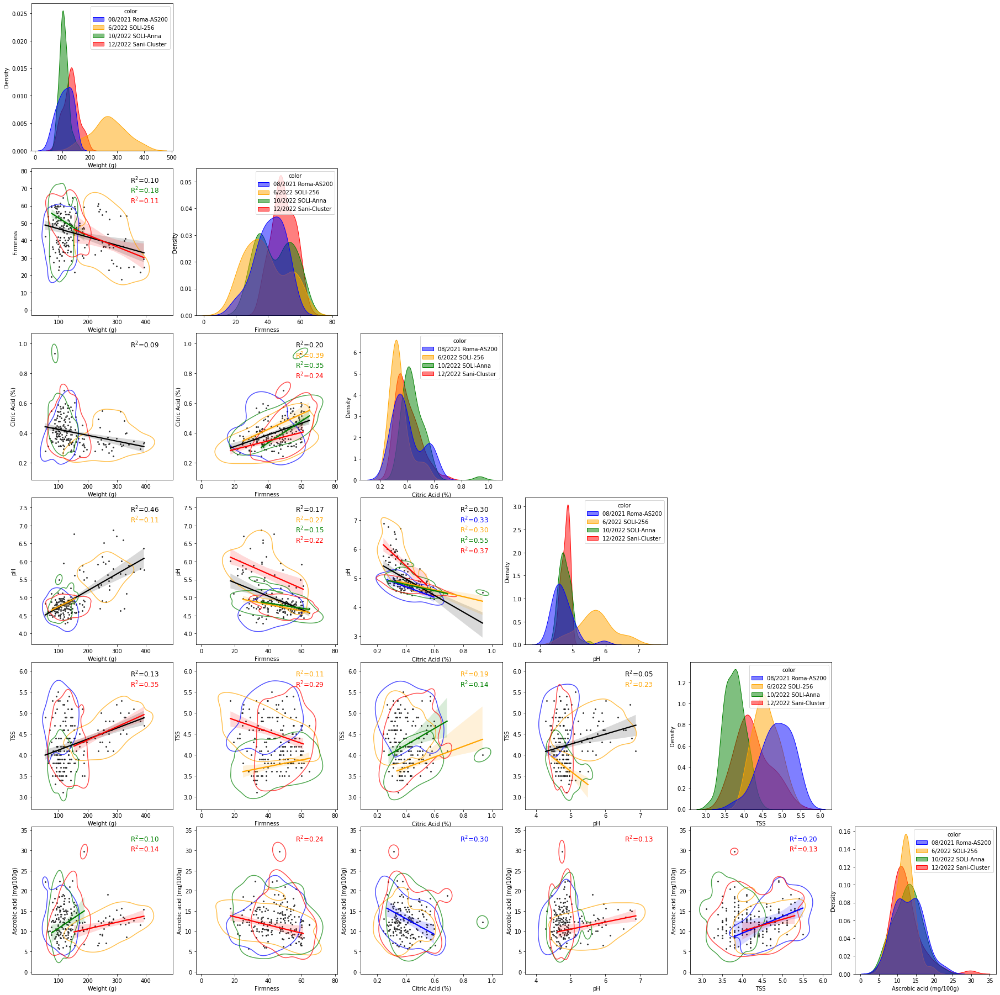

In [ ]:
lab_corolations(tomato_list1345,by_cultivar=False )

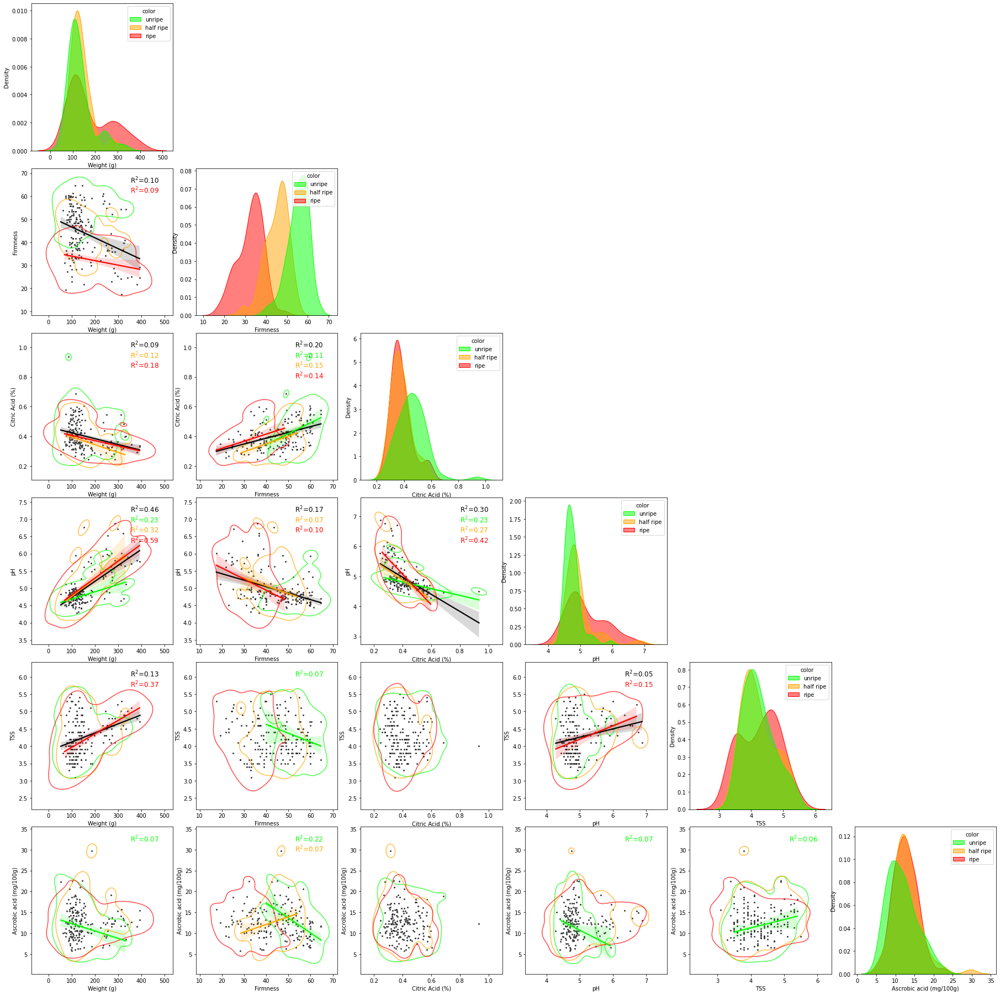

In [ ]:
lab_corolations(tomato_list1345 )

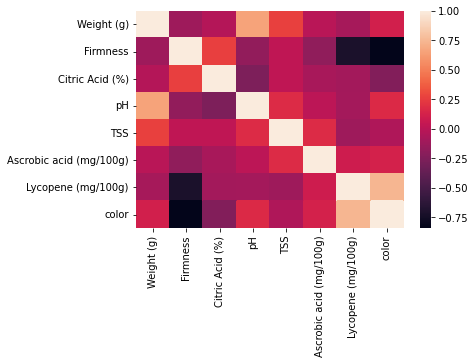

In [ ]:
colors=get_color_groups(tomato_list)
colors[colors<0]=None
corr = colors.corr()
sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns)

#spectral indexes on data


In [ ]:

def GI_LYC_ZMI_Ina_indexing(tomato_list, return_R=False):
  global  G_wave,B_wave,R_wave
  if type(tomato_list)==Harvest:
    tomato_list=TomatoList([tomato_list])
  np_reflectence=np.array(tomato_list.reflectence_df)
  GI=(np_reflectence[:,G_wave])/(np_reflectence[:,G_wave]+np_reflectence[:,B_wave]+np_reflectence[:,R_wave])
  LYC=(np_reflectence[:,80]-np_reflectence[:,40])/(np_reflectence[:,80]+np_reflectence[:,40])
  ZMI=np_reflectence[:,120]/np_reflectence[:,106]
  Ina=(np_reflectence[:,123]-np_reflectence[:,59])/(np_reflectence[:,123]+np_reflectence[:,59])
  index_df=pd.DataFrame({'GI':GI,'LYC':LYC,'ZMI':ZMI,'Ina':Ina},index=np.arange(1,tomato_list.lab_results_df.shape[0]+1))
  R,rmse,mae,p_val={},{},{},{}
  df_dict={}
  #get corolations
  for col in tomato_list.lab_results_df.columns:

    if col not in rmse.keys():
      rmse[col],R[col],mae[col],p_val[col]=[],[],[],[]
    for index in index_df.columns:

      data=pd.concat([tomato_list.lab_results_df,index_df],axis=1)
      data=data[data[col]>0.1]
      if col=='Lycopene (mg/100g)':
          data=data[data[col]<9]
      if col=='Firmness':
          data=data[data[col]>20]
      data=data[[col,index]].dropna(axis=0)
      slope, intercept, r_value, p_value, std_err = stats.linregress(data[index],data[col])
      data['pred']=(data[index]*slope)+intercept
      rmse[col].append(np.sqrt(((data[col]-data['pred'])**2).mean())/data[col].mean())#np.sqrt(((data[col]-data['pred'])**2).mean()))
      R[col].append(r_value**2)
      mae[col].append(np.array([abs(i-true) for i,true in zip(data['pred'],data[col])]).sum()/len(data[index]))
      p_val[col].append(p_value)
      stat_dfs={'rRMSE':rmse,'R^2':R,'MAE':mae,'p value':p_val}

      for stat_name,df in stat_dfs.items():
        df_dict[f'{col} {stat_name}']=df[col]
  # for stat_name,df in stat_dfs.items():
  #   df['index']=index_df.columns
  #   stat_dfs[stat_name]=pd.DataFrame(df)
  df_dict['index']=index_df.columns
  if return_R:
    R['index']=index_df.columns
    return pd.DataFrame(R)
  else: return pd.DataFrame(df_dict)

In [ ]:
harvest_indexing_results={}
for harvest_num,harvest in enumerate(harvest_list):
  harvest_indexing_results[harvest_num]=GI_LYC_ZMI_Ina_indexing(harvest)

harvest_indexing_results['all']=GI_LYC_ZMI_Ina_indexing(tomato_list)

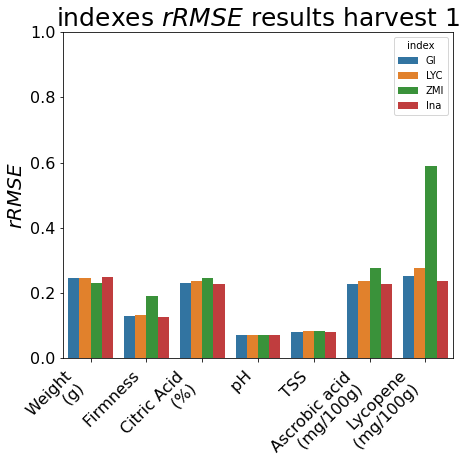

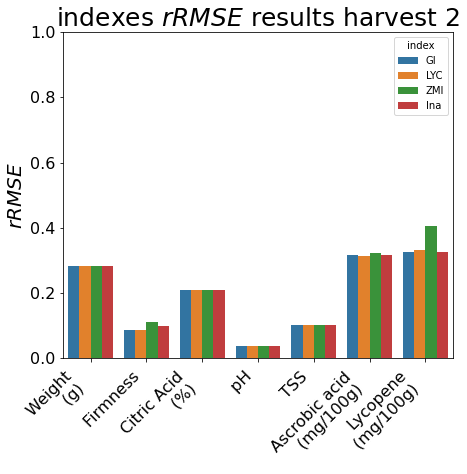

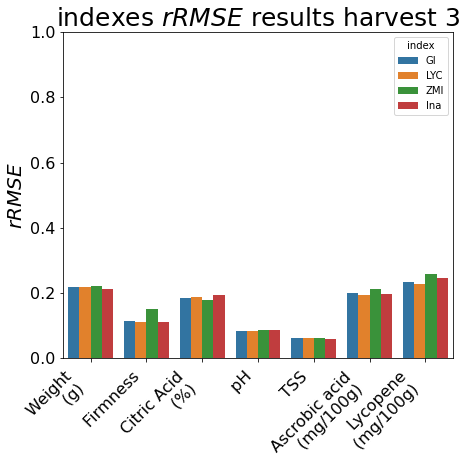

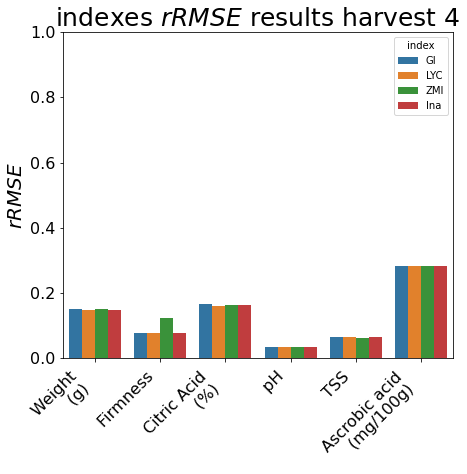

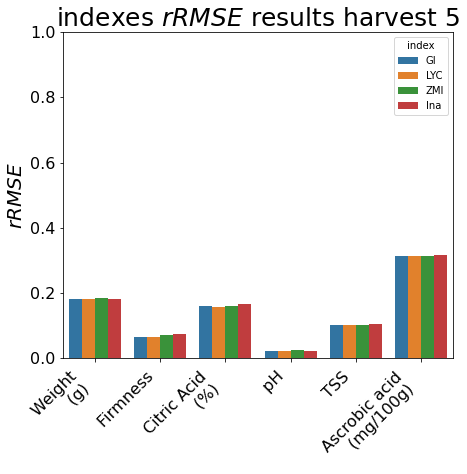

...

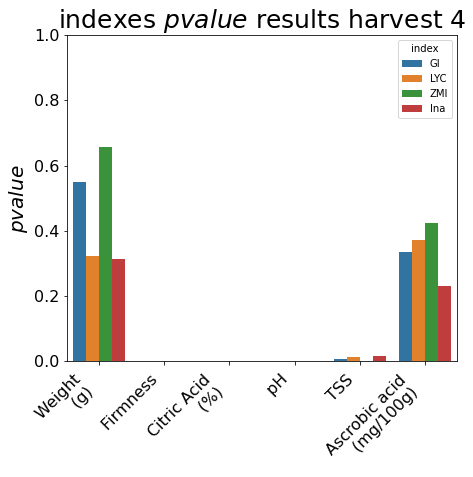

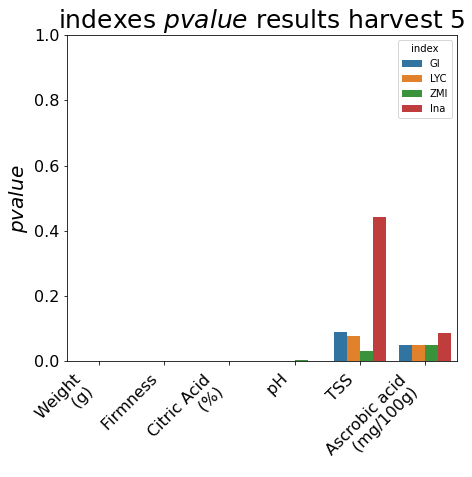

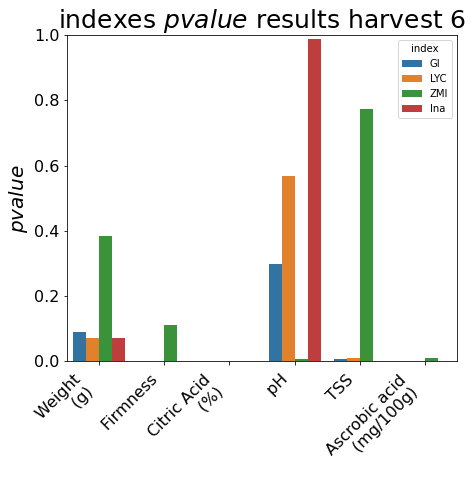

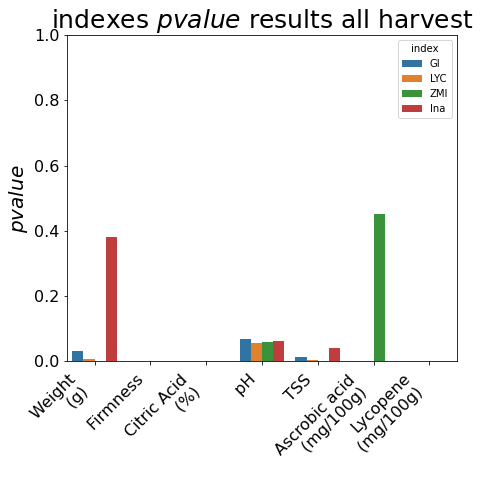

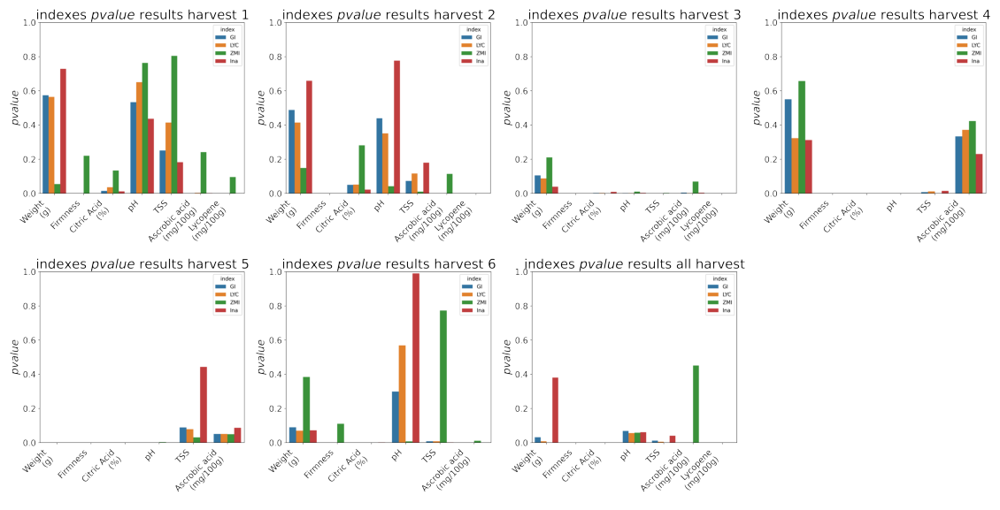

In [ ]:
indexing_stats=['rRMSE','R^2','MAE','p value']
for stat in indexing_stats:
  for sample_pool,indexing_results in harvest_indexing_results.items():

    fig, ax = plt.subplots(figsize=(7, 6))
    df=indexing_results.melt(id_vars=["index"],
              value_vars=[i for i in indexing_results.columns if stat in i],
              var_name=f"quality traits for harvest {sample_pool}", value_name=stat)
    sns.barplot(x=f"quality traits for harvest {sample_pool}", y=stat, hue="index", data=df,ax=ax)
    # ax.set_xticklabels([i for i in indexing_results.columns if stat in i],rotation=45)
    ax.set_xticklabels([i.replace(stat,'').replace('(','\n(') for i in indexing_results.columns if stat in i], rotation=45, ha='right',fontsize=16)
    ax.set_ylabel(f'${stat}$')
    ax.tick_params(axis='y', which='major', labelsize=16)
    ax.set_xlabel('')
    ax.set_title(ax.get_title())
    ax.set_xlabel(ax.get_xlabel(), fontsize=20)
    ax.set_ylabel(ax.get_ylabel(), fontsize=20)
    ax.set_ylim(0, 1)
    if type(sample_pool)==int:
      ax.set_title(f'indexes ${stat}$ results harvest {sample_pool+1}', fontsize=25)#' cultivars={len(tomato_list.cultivar_list)} harvests={len(tomato_list.harvest_list)}')
    else:ax.set_title(f'indexes ${stat}$ results {sample_pool} harvests', fontsize=25)#' cultivars={len(tomato_list.cultivar_list)} harvests={len(tomato_list.harvest_list)}')
    fig_name = f"{stat}_harvest{sample_pool}.png"
    fig.savefig(f'/content/drive/MyDrive/Shared_tomato/Eitan/plots/{fig_name}', dpi=300, bbox_inches='tight')
  multi_plot()
  # indexing_results.melt(id_vars=["index"],
  #             value_vars=[i for i in indexing_results.columns if 'R' in i],
  #             var_name="quality traits", value_name="R^2")


In [ ]:
df=indexing_results.melt(id_vars=["index"],
          value_vars=[i for i in indexing_results.columns if 'R' in i],
          var_name=f"quality traits for harvest {sample_pool}", value_name="R^2")
sns.barplot(x=f"quality traits for harvest {sample_pool}", y="R^2", hue="index", data=df,ax=ax)
# ax.set_xticklabels(df.columns,rotation=45)
ax.set_ylabel('$R^2$')
ax.set_xlabel('')
ax.set_title(f'indexes $R^2$ results')#' cultivars={len(tomato_list.cultivar_list)} harvests={len(tomato_list.harvest_list)}')


Text(0.5, 1.0, 'indexes $R^2$ results')

Text(0.5, 1.0, 'indexes $R^2$ results')

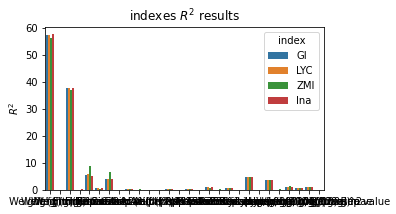

In [ ]:
df = indexing_results.melt(id_vars=["index"],
            value_vars=indexing_results.columns,
            var_name="quality traits", value_name="R^2")
fig, ax = plt.subplots(figsize=(5, 3))
#create barplot
sns.barplot(x="quality traits", y="R^2", hue="index", data=df,ax=ax)
# ax.set_xticklabels(R.columns,rotation=45)
ax.set_ylabel('$R^2$')
ax.set_xlabel('')
ax.set_title(f'indexes $R^2$ results')#' cultivars={len(tomato_list.cultivar_list)} harvests={len(tomato_list.harvest_list)}')



# sns.barplot(data=R)

Text(0.5, 1.0, 'indexes p value results\n  N=447')

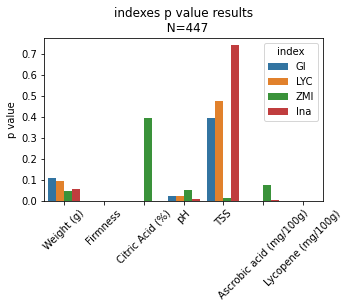

In [ ]:
df = p_val.melt(id_vars=["index"],
            value_vars=R.columns,
            var_name="quality traits", value_name="R^2")
fig, ax = plt.subplots(figsize=(5, 3))
#create barplot
sns.barplot(x="quality traits", y="R^2", hue="index", data=df,ax=ax)
ax.set_xticklabels(R.columns,rotation=45)
ax.set_ylabel('p value')
ax.set_xlabel('')
ax.set_title(f'indexes p value results\n  N={len(tomato_list1234.tomato_df.index)}')#' cultivars={len(tomato_list.cultivar_list)} harvests={len(tomato_list.harvest_list)}')



In [ ]:
df = mae.melt(id_vars=["index"],
            value_vars=[i for i in R.columns if 'We' not in i],
            var_name="quality traits", value_name="R^2")
fig, ax = plt.subplots(figsize=(5, 3))
#create barplot
sns.barplot(x="quality traits", y="R^2", hue="index", data=df,ax=ax)
ax.set_xticklabels(R.columns,rotation=45)
ax.set_ylabel('MAE-mean average error')
ax.set_xlabel('')
ax.set_title(f'indexes MAE results\n  N={len(tomato_list1234.tomato_df.index)}')#' cultivars={len(tomato_list.cultivar_list)} harvests={len(tomato_list.harvest_list)}')


#PCA on reflectece data harvests 1-5

##scaling options

In [ ]:
tomato_list=TomatoList([harvest_1,harvest_2,harvest_3,harvest_4,harvest_5,harvest_6])
tomato_list.reflectence_df

,0,1,2,3,4,5,6,7,8,9,...,194,195,196,197,198,199,200,201,202,203
1,0.170862,0.146737,0.134268,0.124432,0.119401,0.116743,0.112686,0.111271,0.109137,0.106853,...,0.289456,0.291510,0.295408,0.298165,0.299599,0.306817,0.315242,0.316605,0.325420,0.290676
2,0.188744,0.162655,0.148587,0.139058,0.134503,0.133181,0.130254,0.129846,0.128807,0.127253,...,0.313191,0.316707,0.320523,0.324228,0.326156,0.333695,0.342262,0.344385,0.353998,0.318091
3,0.185089,0.156365,0.141430,0.131382,0.126370,0.124410,0.120666,0.119520,0.118001,0.116245,...,0.340091,0.343387,0.347521,0.351208,0.353385,0.360650,0.370031,0.371681,0.382031,0.336166
4,0.175767,0.140603,0.120957,0.107312,0.100270,0.096703,0.092213,0.091069,0.089910,0.088757,...,0.367557,0.370880,0.376459,0.379484,0.382627,0.391459,0.401754,0.404180,0.415090,0.358100
5,0.174761,0.136840,0.114893,0.099307,0.090216,0.084717,0.078397,0.076040,0.073784,0.071904,...,0.391628,0.395285,0.400738,0.403531,0.406640,0.415509,0.426012,0.428284,0.439147,0.374887
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
563,0.130075,0.112714,0.103797,0.099381,0.095073,0.093383,0.090614,0.089948,0.089074,0.088875,...,0.424550,0.426665,0.428220,0.432236,0.435497,0.439781,0.442029,0.446505,0.453823,0.374724
564,0.095045,0.079131,0.070168,0.067046,0.062354,0.060551,0.057770,0.057186,0.056826,0.057465,...,0.346728,0.348238,0.351102,0.353198,0.356045,0.359572,0.361598,0.366453,0.371957,0.304505
565,0.102664,0.081419,0.068814,0.062661,0.056627,0.053553,0.049762,0.047642,0.045633,0.045277,...,0.302496,0.304927,0.307506,0.309812,0.312500,0.316927,0.318420,0.323613,0.330003,0.276673
566,0.153833,0.134526,0.123346,0.118086,0.112030,0.108875,0.105327,0.103050,0.100262,0.098544,...,0.354916,0.356672,0.359343,0.361840,0.364670,0.367401,0.370043,0.375877,0.381350,0.328316


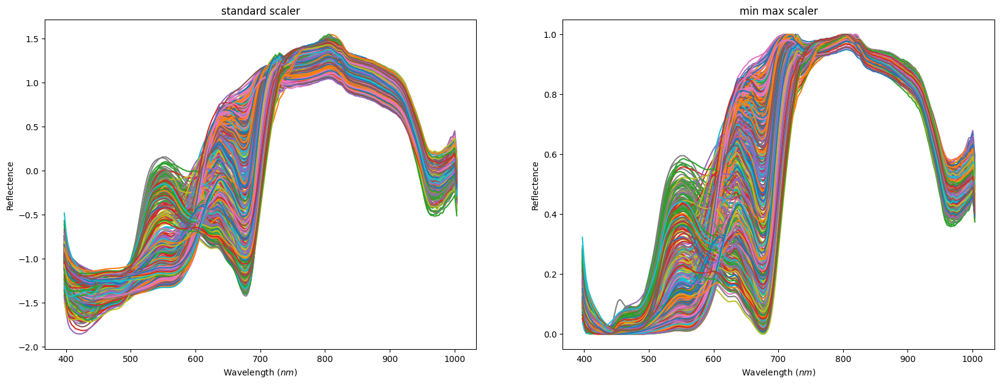

In [ ]:
wave_df=pd.read_csv('/content/drive/MyDrive/Shared_tomato/Eitan/chennel chart.csv')
x_axis=list(wave_df['wavelangth'])
fig, (ax1,ax2) = plt.subplots(1,2  ,figsize=(20,7))
ax1.set(title='standard scaler',
        xlabel='Wavelength ($nm$)',
        ylabel='Reflectence')
ax2.set(title='min max scaler',
        xlabel='Wavelength ($nm$)',
        ylabel='Reflectence')
scaler=StandardScaler()
df_ref_scaled=pd.DataFrame(scaler.fit_transform(tomato_list.reflectence_df.T))
for i in df_ref_scaled.columns[:-1]:
  ax1.plot(wave_df['wavelangth'],df_ref_scaled.iloc[:,i]);
scaler=MinMaxScaler()
df_ref_scaled=pd.DataFrame(scaler.fit_transform(tomato_list.reflectence_df.T))
for i in df_ref_scaled.columns[:-1]:
  ax2.plot(wave_df['wavelangth'],df_ref_scaled.iloc[:,i]);

##runing PCA

Text(0.5, 1.0, 'PCA')

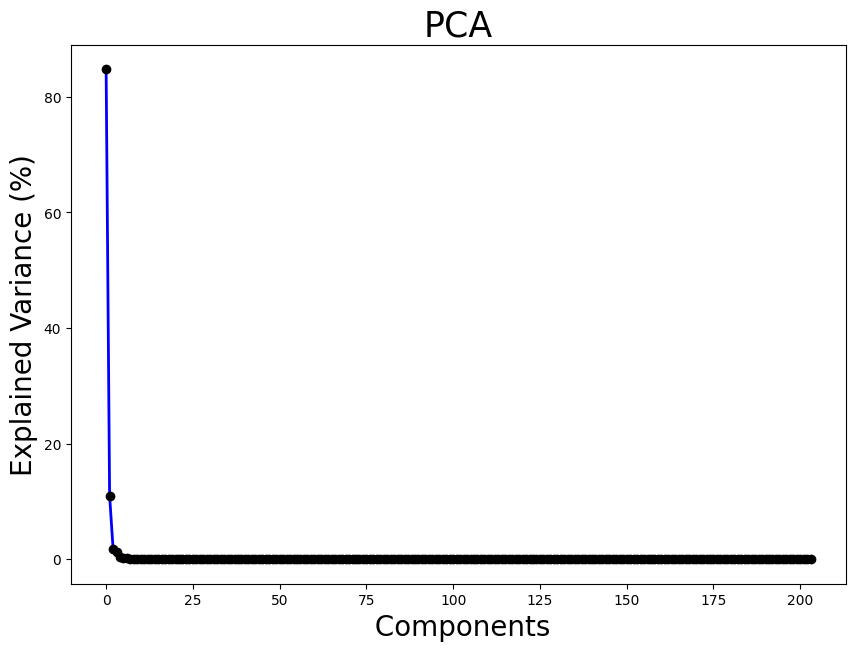

In [ ]:

scaler = MinMaxScaler()

df_normalized=pd.DataFrame(scaler.fit_transform(tomato_list.reflectence_df.T)).T

pca = PCA(n_components=tomato_list.reflectence_df.shape[1])

# Apply the model

df_pca = pca.fit_transform(df_normalized)

# Reformat and view results
loadings = pd.DataFrame(pca.components_,
columns=['PC%s' % _ for _ in range(df_normalized.shape[1])],
index=tomato_list.reflectence_df.columns)

# Graph
fig, ax = plt.subplots(1, figsize=(10,7))
ax.plot(pca.explained_variance_ratio_*100, lw =2,color = "blue")
ax.plot(pca.explained_variance_ratio_*100,'o',lw = 8,color = "black")
ax.set_xlabel(" Components",fontsize=20)
ax.set_ylabel("Explained Variance (%)",fontsize=20)
ax.set_title("PCA",fontsize=25)

In [ ]:
band_number=6
print(f'using {band_number} bands captures {pca.explained_variance_ratio_[:(band_number-1)].sum()*100:.1f}% of our data varience')

using 6 bands captures 98.9% of our data varience


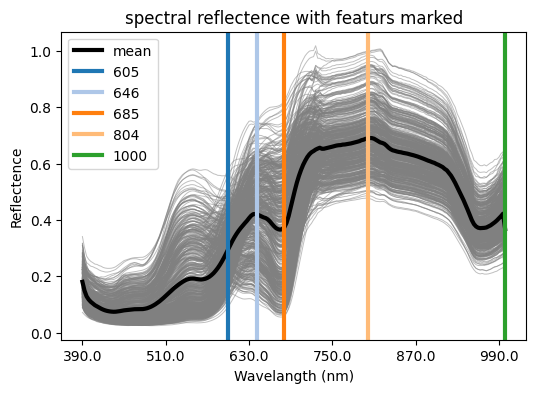

In [ ]:
# # Fit PCA model to the data
pca = PCA(n_components=band_number)
pca.fit(df_normalized)

# Get the indices of the bands that are included in the 4 PCs
bands = np.argmax(np.abs(pca.components_), axis=1)
bands=[i+1 for i in bands]
bands.sort()
plot_spectral_feturs(TomatoList(harvest_list),bands)

##deviding pca into difrent band groups

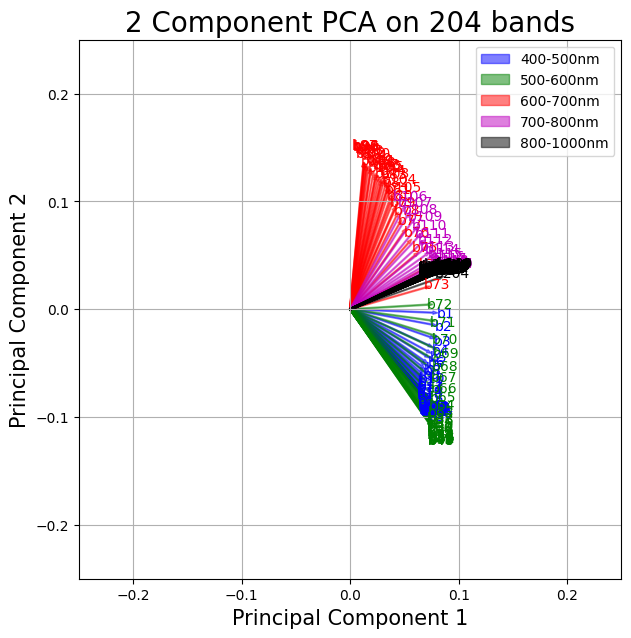

In [ ]:
scaler = MinMaxScaler()
df_normalized=pd.DataFrame(scaler.fit_transform(tomato_list.reflectence_df))
data_scaled=df_normalized.T.copy()
pca = PCA(n_components=2)
x_new = pca.fit_transform(df_normalized)
data_scaled['color']=None
data_scaled['label']=None
data_scaled.loc[:36,'color']='b'
data_scaled.loc[37:71,'color']='g'
data_scaled.loc[72:104,'color']='r'
data_scaled.loc[105:137,'color']='m'
data_scaled.loc[138:203,'color']='k'
c=data_scaled['color']
c=c.dropna()
l=['400-500nm','500-600nm','600-700nm','700-800nm','800-1000nm']
data_scaled.loc[:36,'label']=l[0]
data_scaled.loc[37:71,'label']=l[1]
data_scaled.loc[72:104,'label']=l[2]
data_scaled.loc[105:137,'label']=l[3]
data_scaled.loc[138:,'label']=l[4]

def myplot(coeff,color,label):

    fig = plt.figure(figsize = (7,7))
    ax = fig.add_subplot(1,1,1)
    ax.set(xlim=[-0.25,0.25],ylim=[-0.25,0.25])
    ax.grid()
    ax.set_xlabel('Principal Component 1', fontsize = 15)
    ax.set_ylabel('Principal Component 2', fontsize = 15)
    ax.set_title('2 Component PCA on 204 bands', fontsize = 20)
    n = coeff.shape[0]
    pca_points=[]
    for i,c,label in zip(range(n),color,label):
        pca_points+=[ax.arrow(0, 0, coeff[i,0], coeff[i,1],color = c,alpha = 0.5,label=label)]
        ax.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "b"+str(i+1), color = c, ha = 'center', va = 'center',label=label)

    legend1={'b':'400-500nm','g':'500-600nm','r':'600-700nm','m':'700-800nm','b':'800-1000nm'}

    l=['400-500nm','500-600nm','600-700nm','700-800nm','800-1000nm']
    ax.legend([pca_points[0],pca_points[40],pca_points[80],pca_points[110],pca_points[-1]],l)


#Call the function. Use only the 2 PCs.
myplot(np.transpose(pca.components_),c,data_scaled['label'])

# ax.title('2 component PCA grid on 204 wavelengths')


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


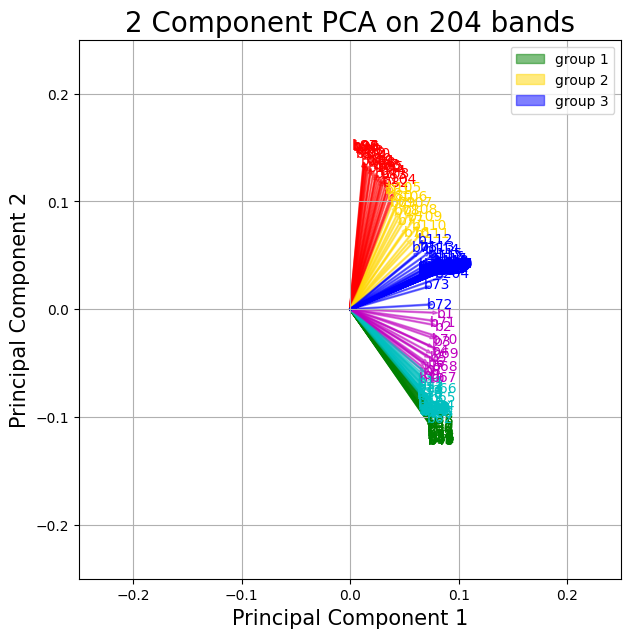

In [ ]:

pca_data=pca.components_.T
# run k-means on the PCA-transformed data

k=band_number
kmeans = KMeans(n_clusters=k)
kmeans.fit(pca_data)
labels = kmeans.fit_predict(pca_data)
tag_dict={'b':'group 1','c':'group 2','r':'group 3','g':'group 4','gold':'group 5','m':'group 6','k':'group 7'}
fig = plt.figure(figsize = (7,7))
ax = fig.add_subplot(1,1,1)
pca_points=[]
ax.set(xlim=[-0.25,0.25],ylim=[-0.25,0.25])
ax.grid()
label_dict={0:'b',1:'c',2:'r',3:'g',4:'gold',5:'m',6:'k'}
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 Component PCA on 204 bands', fontsize = 20)

for i,label in zip(range(band_depth),labels):
        pca_points+=[ax.arrow(0, 0, pca_data[i,0], pca_data[i,1],color = label_dict[label],alpha = 0.5)]
        ax.text(pca_data[i,0]* 1.15, pca_data[i,1] * 1.15, "b"+str(i+1), color = label_dict[label], ha = 'center', va = 'center')


ax.legend([pca_points[60],pca_points[80],pca_points[190]],tag_dict.values())


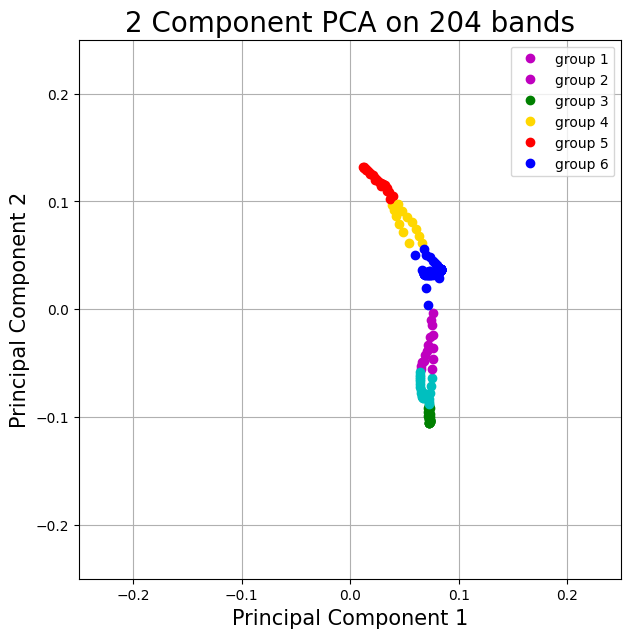

In [ ]:

fig = plt.figure(figsize = (7,7))
ax = fig.add_subplot(1,1,1)
tag_dict={'b':'group 1','c':'group 2','r':'group 3','g':'group 4','gold':'group 5','m':'group 6','k':'group 7'}
ax.set(xlim=[-0.25,0.25],ylim=[-0.25,0.25])
ax.grid()
pca_points=[]
label_dict={0:'b',1:'c',2:'r',3:'g',4:'gold',5:'m',6:'k'}
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 Component PCA on 204 bands', fontsize = 20)
for i,c in zip(range(len(pca_data[:,0])),[label_dict[i] for i in labels]):
  pca_points+=ax.plot(pca_data[i,0], pca_data[i,1],'o', c=c)

ax.legend([pca_points[4],pca_points[8],pca_points[60],pca_points[80],pca_points[100],pca_points[190]],tag_dict.values())
plt.show()

In [ ]:
# for i in labels
label_bands=global_band_table.copy()
label_bands['group']=labels
groups_band={}
groups_wave={}
for i in range(k):
  temp=label_bands[label_bands['group']==i].reset_index()
  groups_band[i]= temp['id']
  groups_wave[i]=temp['wavelangth']
groups_band_df=pd.DataFrame(groups_band)
groups_wave=pd.DataFrame(groups_wave)
groups_band_df.to_csv('/content/drive/MyDrive/Shared_tomato/Eitan/pca code/pca groups band.csv')
groups_wave.to_csv('/content/drive/MyDrive/Shared_tomato/Eitan/pca code/pca groups wave.csv')

In [ ]:
band_to_group={}
for group,bands in groups_band.items():
  for band in bands:
    band_to_group[band-1]=group


In [ ]:

df_normalized=pd.DataFrame(scaler.fit_transform(tomato_list.reflectence_df))
# df_ref_scaled.T.copy()
# Fit PCA model to the data
pca = PCA(n_components=band_number)
pca.fit(df_normalized)
counter=0
# Get the indices of the bands that are included in the 4 PCs
bands = np.argmax(np.abs(pca.components_), axis=1)
band_groups=[band_to_group[i] for i in bands]
while len(np.unique(band_groups))<band_number:
    # Fit PCA model to the data
    counter+=1
    pca = PCA(n_components=band_number+counter)
    pca.fit(df_normalized)
    # Get the indices of the bands that are included in the 4 PCs
    bands = np.argmax(np.abs(pca.components_), axis=1)
    band_groups=[band_to_group[i] for i in bands]
    # bands.sort()
curent_bands,curent_groups=[],[]
for i in bands:
  if not band_to_group[i] in curent_groups:
    curent_groups+=[band_to_group[i]]
    curent_bands+=[i]
NDSI_bands=curent_bands
curent_bands

[136, 96, 69, 47, 13, 80]

In [ ]:
# plot_spectral_feturs(TomatoList(harvest_list),curent_bands)

In [ ]:
# regretionplot_best_bands_normalized(tomato_list,curent_bands)

#manual band selection

In [ ]:
# plot_spectral_feturs(TomatoList(harvest_list),[i for i in range(1, 205, 25)])

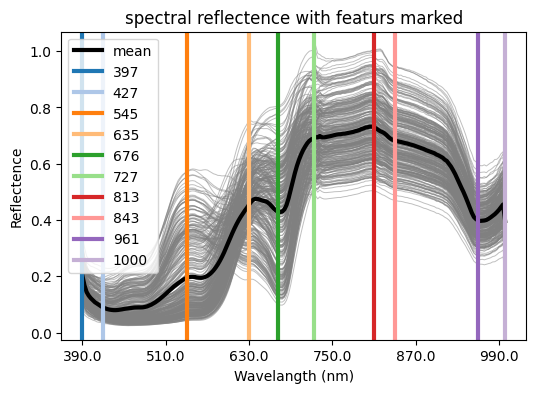

In [ ]:
NDSI_bands=[0,10,50,80,94,111,140,150,190,203]
plot_spectral_feturs(TomatoList([harvest_2]),NDSI_bands)

#machien learning models

##testing ML models using PCA bands and weight

##search for best split

##choose data split

In [ ]:
NDSI_bands = [i for i in range(1, 205, 25)]
feature_importances={}
scaler=MinMaxScaler()
folder_path='/content/drive/MyDrive/Shared_tomato/Eitan/ML_models'
r_2_rf,rmse_rf,r_2_xg,rmse_xg,r_plsr,rmse_plsr=np.zeros(7),np.zeros(7),np.zeros(7),np.zeros(7),np.zeros(7),np.zeros(7)
iter_num=100
random_state={}
tomato_list.get_spec_stats()
# if os.path.exists(f'{folder_path}/random_state_{iter_num}.csv'):
#   random_state=pd.read_csv(f'{folder_path}/random_state_{iter_num}.csv')
# else:
for i,col in enumerate(tomato_list.lab_results_df.columns.drop('area(cm^2)')):
  rs_rf,rs_xgb,rs_plsr=[],[],[]
  for j in tqdm(range(iter_num)):

    # x_df,y_df,feature_names,cultivar=model_input(tomato_list,col,curent_bands)
    x_df,y_df, feature_names,cultivar=model_input_v2(tomato_list,col,NDSI_bands)

    X_train, X_test, y_train, y_test = train_test_split(x_df, y_df, test_size=0.3, random_state=j,stratify=cultivar)
    # X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.5, random_state=42)

    # Train and evaluate a random forest model
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

    rf_model.fit(X_train, y_train)
    y_pred = rf_model.predict(X_test)
    r_2_rf[i]+=r2_score(y_test, y_pred)
    rs_rf+=[r2_score(y_test, y_pred)]
    rmse_rf[i]+=np.sqrt(mean_squared_error(y_test, y_pred)/y_test.mean())
    feature_importances[col + '_RF'] = rf_model.feature_importances_
    # Calculate R^2 and RMSE for each output column
    # Train and evaluate an XGBoost model
    XGB_model = XGBRegressor(objective ='reg:squarederror',n_estimators=100, random_state=42)
    XGB_model.fit(X_train, y_train)
    y_pred = XGB_model.predict(X_test)
    r_2_xg[i]+=r2_score(y_test, y_pred)
    rs_xgb+=[r2_score(y_test, y_pred)]
    rmse_xg[i]+=np.sqrt(mean_squared_error(y_test, y_pred)/y_test.mean())
    feature_importances[col + '_XGB'] = XGB_model.feature_importances_
    # Define PLS object
    plsr_model = PLSRegression(n_components=7, scale=True)
    plsr_model.fit(X_train, y_train)
    y_pred = plsr_model.predict(X_test)
    slope, intercept, r_value, p_value, std_err = stats.linregress(y_test, y_pred[:,0])
    r_plsr[i]+=r_value**2
    rs_plsr+=[r_value**2]
    rmse_plsr[i]+=np.sqrt(mean_squared_error(y_test, y_pred)/y_test.mean())
    feature_importances[col + '_PLSR'] = XGB_model.feature_importances_
  random_state[col+'_RF']=rs_rf
  random_state[col+'_XGB']=rs_xgb
  random_state[col+'_PLSR']=rs_plsr
  # Calculate R^2 and RMSE for each output column
data_dict = {
    'column': tomato_list.lab_results_df.columns.drop('area(cm^2)'),
    'XGBoost R^2': r_2_xg / iter_num,
    'XGBoost RMSE': rmse_xg / iter_num,
    'RF R^2': r_2_rf / iter_num,
    'RF RMSE': rmse_rf / iter_num,
    'PLSR R^2': r_plsr / iter_num,
    'PLSR RMSE': rmse_plsr / iter_num
}

ML_pca_df=pd.DataFrame(data_dict)
random_state=pd.DataFrame(random_state)

random_state.to_csv(f'{folder_path}/random_state_{iter_num}.csv')




  0%|          | 0/100 [00:00<?, ?it/s]


NameError: ignored

In [ ]:

random_seed={}
folder_path='/content/drive/MyDrive/Shared_tomato/Eitan/ML_models'

random_state=pd.read_csv(f'{folder_path}/random_state_{iter_num}.csv')
max_rf,max_xgb,max_plsr,min_rf,min_xgb,min_plsr=[],[],[],[],[],[]
for i in random_state.columns:
  print(i,random_state[i].max(),'random state=',random_state[i].idxmax())
  random_seed[i]=random_state[i].idxmax()
  if 'RF' in i:
    max_rf+=[random_state[i].max()]
    min_rf+=[abs(random_state[i]).min()]
  if 'XGB' in i:
    max_xgb+=[random_state[i].max()]
    min_xgb+=[abs(random_state[i]).min()]
  if 'PLSR' in i:
    max_plsr+=[random_state[i].max()]
    min_plsr+=[abs(random_state[i]).min()]

data_dict={'column':tomato_list.lab_results_df.columns.drop('area(cm^2)'),'XGBoost':max_xgb,'RF':max_rf,'PLSR':max_plsr}
model_best_r2=pd.DataFrame(data_dict)
R,NI_rmse=max_r2_from_NI(tomato_list)
model_best_r2['NI']=[R[i] for i in data_dict['column']]
ML_pca_df['NI R^2']=[R[i] for i in data_dict['column']]
ML_pca_df['NI R^2']=[NI_rmse[i]/tomato_list.lab_results_df[i].mean() for i in data_dict['column']]
data_dict={'column':tomato_list.lab_results_df.columns.drop('area(cm^2)'),'XGBoost':min_xgb,'RF':min_rf,'PLSR':min_plsr}
model_worst_r2=pd.DataFrame(data_dict)

Unnamed: 0 99 random state= 99
Weight (g)_RF 0.941197779484744 random state= 67
Weight (g)_XGB 0.9425266221853028 random state= 19
Weight (g)_PLSR 0.953836884439068 random state= 65
Firmness_RF 0.8748754914308712 random state= 40
Firmness_XGB 0.866348941347279 random state= 40
Firmness_PLSR 0.8834229260126067 random state= 40
TSS_RF 0.6949742649616938 random state= 78
TSS_XGB 0.6893445495821047 random state= 89
TSS_PLSR 0.6584101235294295 random state= 45
Citric Acid (%)_RF 0.6243064319974667 random state= 20
Citric Acid (%)_XGB 0.6184369669998049 random state= 20
Citric Acid (%)_PLSR 0.5306084924928763 random state= 7
Ascrobic acid (mg/100g)_RF 0.3821929721708685 random state= 0
Ascrobic acid (mg/100g)_XGB 0.2981278116785817 random state= 67
Ascrobic acid (mg/100g)_PLSR 0.3161138119490642 random state= 62
Lycopene (mg/100g)_RF 0.7654731761886794 random state= 55
Lycopene (mg/100g)_XGB 0.7495792752633843 random state= 0
Lycopene (mg/100g)_PLSR 0.7922943171471003 random state= 17
pH_RF 

##run chosen split

In [ ]:
harvest_5.lab_results

,ID,Weight (g),Firmness,TSS,Citric Acid (%),Ascrobic acid (mg/100g),Lycopene (mg/100g),pH
448,Sani-Cluster_19_12_2022_ID_1,105.32,59.750000,4.1,0.580,9.276288,NaN,4.49
449,Sani-Cluster_19_12_2022_ID_2,117.48,49.000000,4.1,0.687,18.890368,NaN,4.46
450,Sani-Cluster_19_12_2022_ID_3,128.32,48.333333,4.1,0.516,14.299861,NaN,4.69
451,Sani-Cluster_19_12_2022_ID_4,133.94,46.666667,4.0,0.365,9.709355,NaN,4.77
452,Sani-Cluster_19_12_2022_ID_5,138.93,47.333333,4.3,0.427,10.488875,NaN,4.66
453,Sani-Cluster_19_12_2022_ID_6,146.32,64.666667,4.7,0.551,11.528235,NaN,4.70
454,Sani-Cluster_19_12_2022_ID_7,153.39,59.666667,4.7,0.605,6.504661,NaN,4.59
455,Sani-Cluster_19_12_2022_ID_8,170.39,50.000000,4.2,0.339,12.134528,NaN,4.83
456,Sani-Cluster_19_12_2022_ID_9,184.55,47.333333,4.3,0.327,10.055808,NaN,4.93
457,Sani-Cluster_19_12_2022_ID_10,180.73,45.000000,5.1,0.451,12.134528,NaN,4.80


In [ ]:
def NDSI_from_tuple_list(tomato_list, tuple_list):
    np_reflectence = np.array(tomato_list.reflectence_df)
    NDSI_df = pd.DataFrame()
    for b1, b2 in tuple_list:
        NI = (np_reflectence[:, b2] - np_reflectence[:, b1]) / (np_reflectence[:, b1] + np_reflectence[:, b2])
        NDSI_df[f'NDSI ({b1}, {b2})'] = NI
    return NDSI_df

def distance(point1, point2):
    """Calculate the Euclidean distance between two points."""
    return math.sqrt((point1[0] - point2[0])**2 + (point1[1] - point2[1])**2)

def filter_points(points, min_distance):
    """Remove points that are closer than min_distance to each other."""
    filtered_points = []
    for point in points:
        if not filtered_points or all(distance(point, fp) >= min_distance for fp in filtered_points):
            # if the point is far enough from all points in filtered_points
            filtered_points.append(point)
    return filtered_points


def model_input_v2(tomato_list, col, selected_bands,area=True, red_index=True, scale=False):

    waves = get_waves()
    lab_results = tomato_list.lab_results_df
    cultivar, marker_dict = cultivar_column(tomato_list)
    np_reflectence = np.array(tomato_list.reflectence_df)

    if isinstance(selected_bands[0], tuple):
      std = tomato_list.spectral_stats['std'][[str(i) for i in sorted(np.unique(selected_bands))]]
      std.columns = [f'std {int(waves[i])}nm' for i in sorted(np.unique(selected_bands))]
      NDSI_df = NDSI_from_tuple_list(tomato_list, selected_bands)
      temp_df = pd.concat([std, NDSI_df.set_index(std.index), lab_results], axis=1)
    else:
      pairs=[(i,j) for i,j in itertools.combinations(selected_bands,2)]
      sorted_list=[(i,j) for i,j in pairs if abs(i-j)>9]
      sorted_list = [(a, b) if a <= b else (b, a) for a, b in sorted_list]
      sorted_list=list(set(sorted_list))
      filtered_points=sorted_list
      while len(filtered_points)>10:
        min_distance = 15
        filtered_points = filter_points(filtered_points, min_distance)
        min_distance+=5
      std = tomato_list.spectral_stats['std'][[str(i) for i in sorted(np.unique(filtered_points))]]
      std.columns = [f'std {i}' for i in sorted(np.unique(filtered_points))]
      NDSI_df = NDSI_from_tuple_list(tomato_list, filtered_points)
      temp_df = pd.concat([std, NDSI_df.set_index(std.index), lab_results], axis=1)
      # temp_df = pd.concat([std, tomato_list.tomato_df], axis=1)

    NI = (np_reflectence[:, R_wave] - np_reflectence[:, G_wave]) / (np_reflectence[:, G_wave] + np_reflectence[:, R_wave])
    temp_df['Red index'] = NI
    temp_df['cultivar'] = cultivar
    temp_df = temp_df[temp_df[col] > 0]

    if isinstance(selected_bands[0], tuple):
        x_df = pd.concat([temp_df.iloc[:, :len(np.unique(selected_bands)) + len(selected_bands)]], axis=1)
        if area:
            x_df.loc[:, 'area(cm^2)'] = temp_df['area(cm^2)'].copy()
        if red_index:
            x_df.loc[:, 'Red index'] = temp_df['Red index'].copy()
    else:
        x_df = temp_df.iloc[:,:len(np.unique(selected_bands)) + len(filtered_points) ]
        if area:
          x_df.loc[:, 'area(cm^2)'] = temp_df['area(cm^2)'].copy()
        if red_index:
            x_df.loc[:, 'Red index'] = temp_df['Red index'].copy()
        x_df.columns = [str(i) for i in x_df.columns]

    y_df = temp_df.loc[:, col]
    cultivar = temp_df['cultivar'].copy()
    scaler = MinMaxScaler()

    feature_names = x_df.columns
    if scale:
        x_df = np.array(scaler.fit_transform(x_df))
    return x_df, y_df, feature_names, cultivar


<ipython-input-79-3f5c9795b8d0>:43: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  triangle_mask = np.triu(np.ones(data.shape)).astype(np.bool)
<ipython-input-79-3f5c9795b8d0>:43: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  triangle_mask = np.triu(np.ones(data.shape)).astype(np.bool)
<ipython-input-130-12b49586e6be>:9: FutureWarning: The frame.app

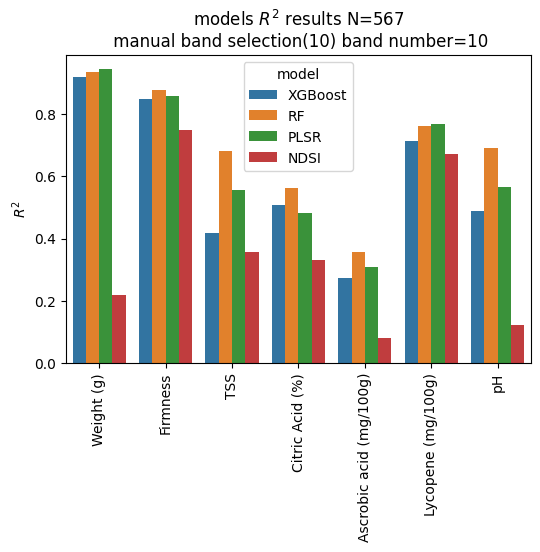

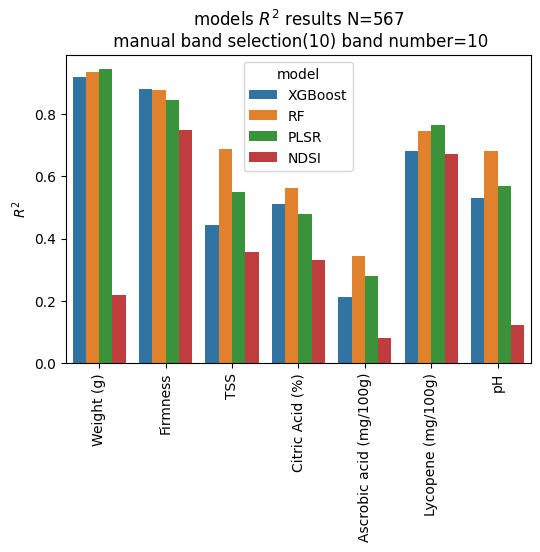

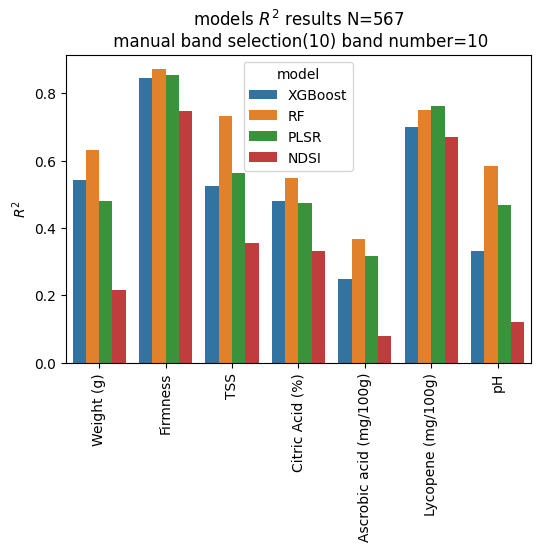

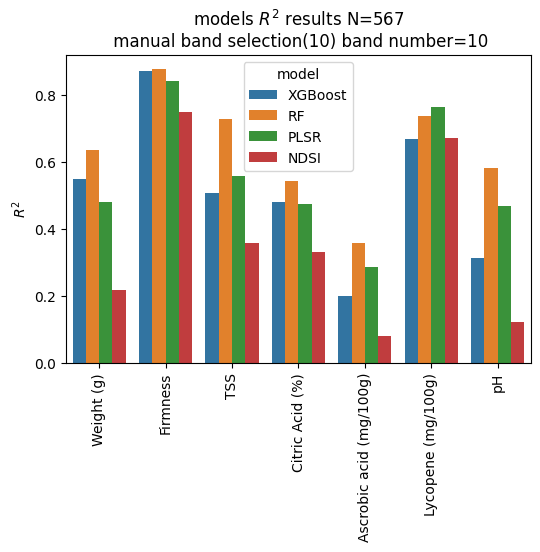

In [ ]:

def save_results(ML_df, results_file_path,data_key:str):
    if not os.path.exists(results_file_path):
        ML_df['key']=[data_key for i in ML_df.index]
        ML_df.to_csv(results_file_path, index=False)
    else:
        existing_results = pd.read_csv(results_file_path)
        if str(ML_df['Input'][0]) not in np.unique(existing_results['Input']):
          ML_df['key']=[data_key for i in ML_df.index]
          updated_results = existing_results.append(ML_df, ignore_index=True)
          updated_results.to_csv(results_file_path, index=False)

folder_path = '/content/drive/MyDrive/Shared_tomato/Eitan/ML_models'
results_file = f'{folder_path}/ML_input_results 31.5.23.csv'
feature_importances={}

scaler = MinMaxScaler()
tomato_list.get_spec_stats()
r_2_rf = np.zeros(7)
rmse_rf = np.zeros(7)
r_2_xg = np.zeros(7)
rmse_xg = np.zeros(7)
r_plsr = np.zeros(7)
rmse_plsr = np.zeros(7)
for area,red_index in [(True,True),(True,False),(False,True),(False,False)]:

  for j in range(4,5):
    NDSI_bands=find_optimal_band_combinations_local_maxima(tomato_list)
    NDSI_bands[3]=(140,160)
    NDSI_bands[2]=(77,160)

    # NDSI_bands=np.unique(find_optimal_band_combinations_local_maxima(tomato_list))
    # # band_selection_key='local maxima'
    # NDSI_bands=get_best_NDSI_combinations(tomato_list,NDSI_bands,number_bands_to_select=j)
    # band_selection_key="Enhanced Maxima-NDSI Band Filtering"

    # band_selection_key='PCA bands'

    # band_selection_key='NDSI AOI overlaps'

    # NDSI_bands=find_best_bands(tomato_list, j)
    band_selection_key='manual band selection'
    band_selection_key+=f'({len(np.unique(NDSI_bands))})'
    for i, col in enumerate(tomato_list.lab_results_df.columns.drop('area(cm^2)')):

        x_df, y_df, feature_names, cultivar = model_input_v2(tomato_list, col, NDSI_bands,area=area,red_index=red_index)
        X_train, X_test, y_train, y_test = get_train_test_split(col,x_df,y_df)
        # X_train, X_test, y_train, y_test = train_test_split(x_df, y_df, test_size=0.2, random_state=42, stratify=cultivar)

        # Train and evaluate a random forest model
        rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
        rf_model.fit(X_train, y_train)
        y_pred = rf_model.predict(X_test)
        r_2_rf[i] = r2_score(y_test, y_pred)
        rmse_rf[i] = np.sqrt(mean_squared_error(y_test, y_pred)/y_test.mean())
        feature_importances[col + '_RF'] = rf_model.feature_importances_

        # Train and evaluate an XGBoost model
        XGB_model = XGBRegressor(objective='reg:squarederror', n_estimators=100, random_state=42)
        XGB_model.fit(X_train, y_train)
        y_pred = XGB_model.predict(X_test)
        r_2_xg[i] = r2_score(y_test, y_pred)
        rmse_xg[i] = np.sqrt(mean_squared_error(y_test, y_pred)/y_test.mean())
        feature_importances[col + '_XGB'] = XGB_model.feature_importances_

        # Train and evaluate a PLSR model
        plsr_model = PLSRegression(n_components=7, scale=True)
        plsr_model.fit(X_train, y_train)
        y_pred = plsr_model.predict(X_test)
        slope, intercept, r_value, p_value, std_err = stats.linregress(y_test, y_pred[:, 0])
        r_plsr[i] = r_value**2
        rmse_plsr[i] = np.sqrt(mean_squared_error(y_test, y_pred)/y_test.mean())
        feature_importances[col + '_PLSR'] = XGB_model.feature_importances_

    data_dict = {'Input':[[i for i in feature_names if 'std' not in i]] * 7,
                'column': tomato_list.lab_results_df.columns.drop('area(cm^2)'),
                'XGBoost': r_2_xg,
                'XGBoost RMSE': rmse_xg,
                'RF': r_2_rf,
                'RF RMSE': rmse_rf,
                'PLSR': r_plsr,
                'PLSR RMSE': rmse_plsr}

    ML_pca_df = pd.DataFrame(data_dict)
    save_results( ML_pca_df, results_file,band_selection_key)

    R,NI_rmse=max_r2_from_NI(tomato_list)
    # model_best_r2['NI']=[R[i] for i in data_dict['column']]
    ML_pca_df['NDSI']=[R[i] for i in data_dict['column']]
    df = ML_pca_df.melt(id_vars=["column"],
                value_vars=["XGBoost", "RF", "PLSR","NDSI"],
                var_name="model", value_name="R^2")
    fig, ax = plt.subplots(figsize=( 6,4))
    #create barplot
    sns.barplot(x="column", y="R^2", hue="model", data=df,ax=ax)
    ax.set_xticklabels(ML_pca_df["column"],rotation=90)
    ax.set_ylabel('$R^2$')
    ax.set_xlabel('')
    ax.set_title(f'models $R^2$ results N={len(tomato_list.tomato_df.index)}\n {band_selection_key} band number={len(np.unique(NDSI_bands))}')#' cultivars={len(tomato_list.cultivar_list)} harvests={len(tomato_list.harvest_list)}')





In [ ]:
#@title
import os
import numpy as np
import pandas as pd
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.cross_decomposition import PLSRegression
from xgboost import XGBRegressor
from scipy import stats

folder_path = '/content/drive/MyDrive/Shared_tomato/Eitan/ML_models'
results_file = f'{folder_path}/ML_input_results.csv'


scaler = MinMaxScaler()
tomato_list.get_spec_stats()
r_2_rf = np.zeros(7)
rmse_rf = np.zeros(7)
r_2_xg = np.zeros(7)
rmse_xg = np.zeros(7)
r_plsr = np.zeros(7)
rmse_plsr = np.zeros(7)
for i in range(4,9):
  NDSI_bands=get_best_NDSI_combinations(tomato_list,all_bands_together,number_bands_to_select=i)
  key='NDSI option 2'


  for i, col in enumerate(tomato_list.lab_results_df.columns.drop('area(cm^2)')):

      x_df, y_df, feature_names, cultivar = model_input_v2(tomato_list, col, NDSI_bands)
      X_train, X_test, y_train, y_test = get_train_test_split(col,x_df,y_df)
      # X_train, X_test, y_train, y_test = train_test_split(x_df, y_df, test_size=0.2, random_state=42, stratify=cultivar)

      # Train and evaluate a random forest model
      rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
      rf_model.fit(X_train, y_train)
      y_pred = rf_model.predict(X_test)
      r_2_rf[i] = r2_score(y_test, y_pred)
      rmse_rf[i] = np.sqrt(mean_squared_error(y_test, y_pred)/y_test.mean())
      feature_importances[col + '_RF'] = rf_model.feature_importances_

      # Train and evaluate an XGBoost model
      XGB_model = XGBRegressor(objective='reg:squarederror', n_estimators=100, random_state=42)
      XGB_model.fit(X_train, y_train)
      y_pred = XGB_model.predict(X_test)
      r_2_xg[i] = r2_score(y_test, y_pred)
      rmse_xg[i] = np.sqrt(mean_squared_error(y_test, y_pred)/y_test.mean())
      feature_importances[col + '_XGB'] = XGB_model.feature_importances_

      # Train and evaluate a PLSR model
      plsr_model = PLSRegression(n_components=7, scale=True)
      plsr_model.fit(X_train, y_train)
      y_pred = plsr_model.predict(X_test)
      slope, intercept, r_value, p_value, std_err = stats.linregress(y_test, y_pred[:, 0])
      r_plsr[i] = r_value**2
      rmse_plsr[i] = np.sqrt(mean_squared_error(y_test, y_pred)/y_test.mean())
      feature_importances[col + '_PLSR'] = XGB_model.feature_importances_

  data_dict = {'Input':[[i for i in feature_names if 'std' not in i and 'Red'not in i and 'area' not in i]] * 7,
              'column': tomato_list.lab_results_df.columns.drop('area(cm^2)'),
              'XGBoost': r_2_xg,
              'XGBoost RMSE': rmse_xg,
              'RF': r_2_rf,
              'RF RMSE': rmse_rf,
              'PLSR': r_plsr,
              'PLSR RMSE': rmse_plsr}

  ML_pca_df = pd.DataFrame(data_dict)
  save_results( ML_pca_df, results_file)

  R,NI_rmse=max_r2_from_NI(tomato_list)
  # model_best_r2['NI']=[R[i] for i in data_dict['column']]
  ML_pca_df['NDSI']=[R[i] for i in data_dict['column']]
  df = ML_pca_df.melt(id_vars=["column"],
              value_vars=["XGBoost", "RF", "PLSR","NDSI"],
              var_name="model", value_name="R^2")
  fig, ax = plt.subplots(figsize=( 6,4))
  #create barplot
  sns.barplot(x="column", y="R^2", hue="model", data=df,ax=ax)
  ax.set_xticklabels(ML_pca_df["column"],rotation=90)
  ax.set_ylabel('$R^2$')
  ax.set_xlabel('')
  ax.set_title(f'models $R^2$ results N={len(tomato_list.tomato_df.index)}')#' cultivars={len(tomato_list.cultivar_list)} harvests={len(tomato_list.harvest_list)}')





Text(0.5, 1.0, 'models $R^2$ results N=567')

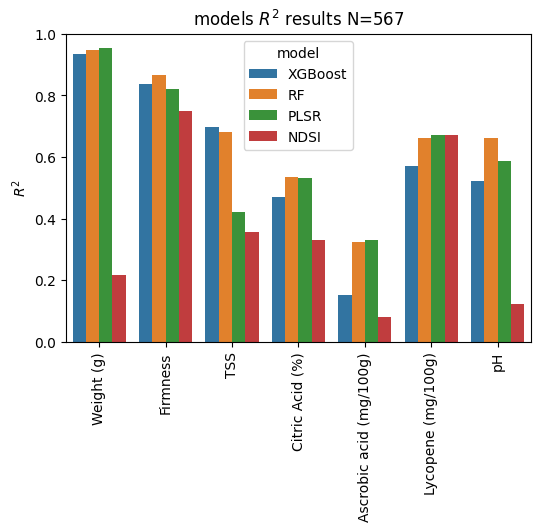

In [ ]:
#@title
fig, ax = plt.subplots(figsize=( 6,4))
#create barplot
sns.barplot(x="column", y="R^2", hue="model", data=df,ax=ax)
ax.set_xticklabels(ML_pca_df["column"],rotation=90)
ax.set_ylabel('$R^2$')
ax.set_xlabel('')
ax.set_title(f'models $R^2$ results N={len(tomato_list.tomato_df.index)}')#' cultivars={len(tomato_list.cultivar_list)} harvests={len(tomato_list.harvest_list)}')



In [ ]:
#add NDSI to results
folder_path = '/content/drive/MyDrive/Shared_tomato/Eitan/ML_models'
results_file = f'{folder_path}/ML_input_results 29.5.23.csv'
df=pd.read_csv(results_file)
input_bands=df['Input']
input_bands=[i.replace('NDSI ','').replace('[','').replace(']','') for i in input_bands]
input_bands=[i.replace(", 'area(cm^2)'",'').replace(", 'Red index'",'').replace("'","") for i in input_bands]
input_bands=[i[:-1].replace(', (','').replace('(','').split(')') for i in input_bands]
tuple_list=[]
for input in input_bands:
  tuple_list+=[[(int(x), int(y)) for x, y in [item.split(", ") for item in input]]]
NDSI_list=[]

for col, tuples in zip(df['column'], tuple_list):
    # Extract the NDSI heatmap for the current column
    NDSI_heatmap = tomato_list.r_2_dict[col]
    # Get the maximum NDSI value for the tuples
    max_NDSI = max(NDSI_heatmap[t] for t in tuples)

    NDSI_list.append(max_NDSI)
df['NDSI']=NDSI_list
df.to_csv(results_file,index=False)

In [ ]:
def area_red_index_corr( tomato_list, area_corr=False):
  r_2={}

  for col in tomato_list.lab_results_df.columns.drop('area(cm^2)'):

    data={}
    data[col]=tomato_list.lab_results_df[col]
    data['area']=tomato_list.lab_results_df['area(cm^2)']
    ref=np.array(tomato_list.reflectence_df)
    data['red_index']= (ref[:, R_wave] - ref[:, G_wave]) / (ref[:, G_wave] + ref[:, R_wave])
    data=pd.DataFrame(data)
    data=data.dropna()
    data=data[data[col]>0]
    if area_corr:
      slope, intercept, r_value, p_value, std_err = stats.linregress(data['area'],data[col])
    else:
      slope, intercept, r_value, p_value, std_err = stats.linregress(data['red_index'],data[col])
    r_2[col]=r_value**2
  return r_2
def remove_parentheses(column):
    if '(' in column:
        col = column.split('(')[0]
    else:
        col = column
    return col


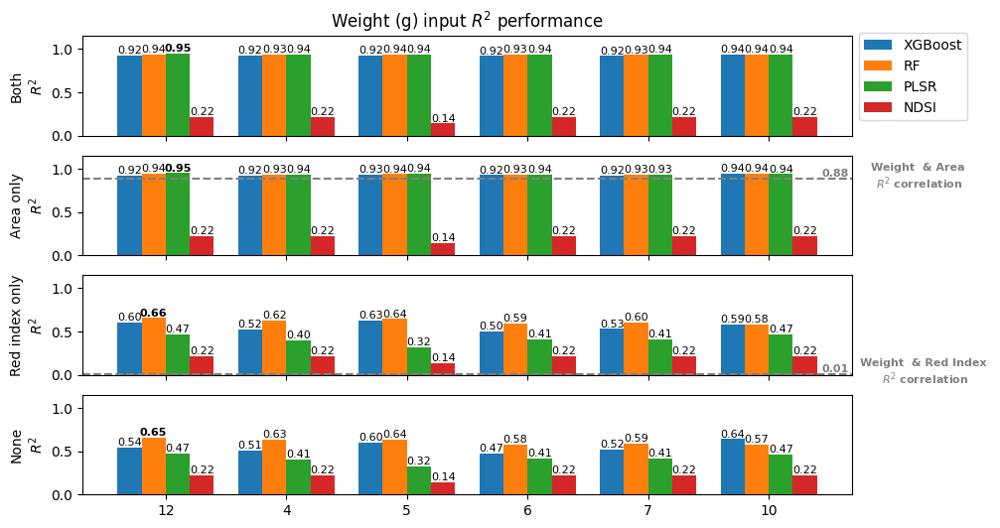

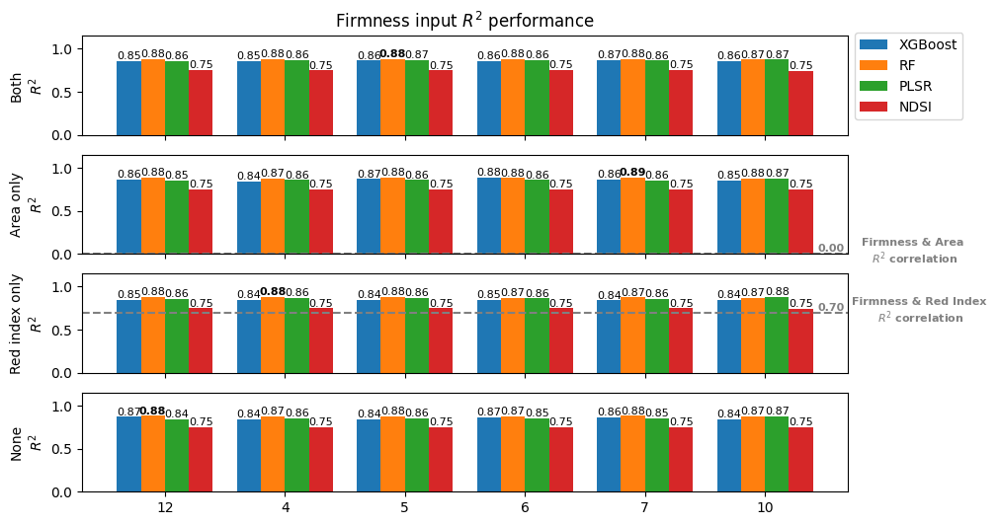

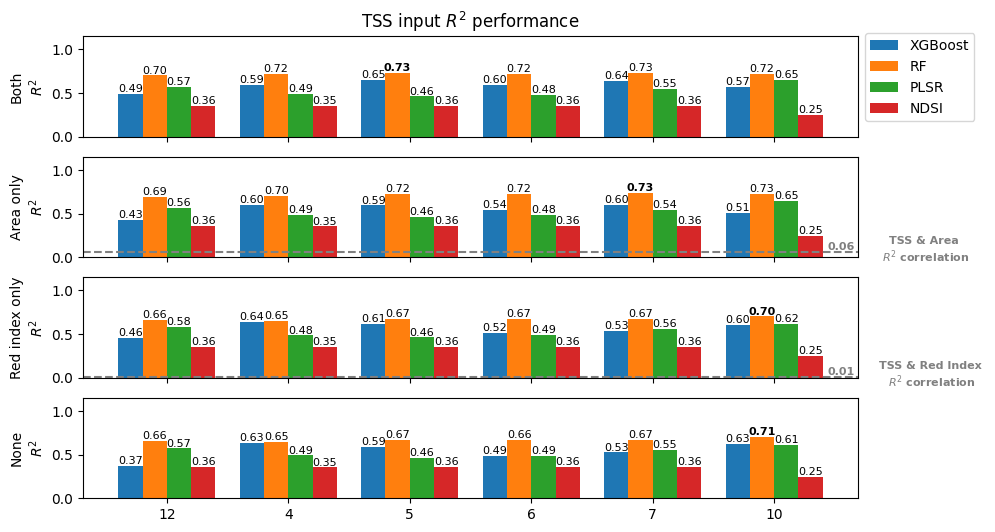

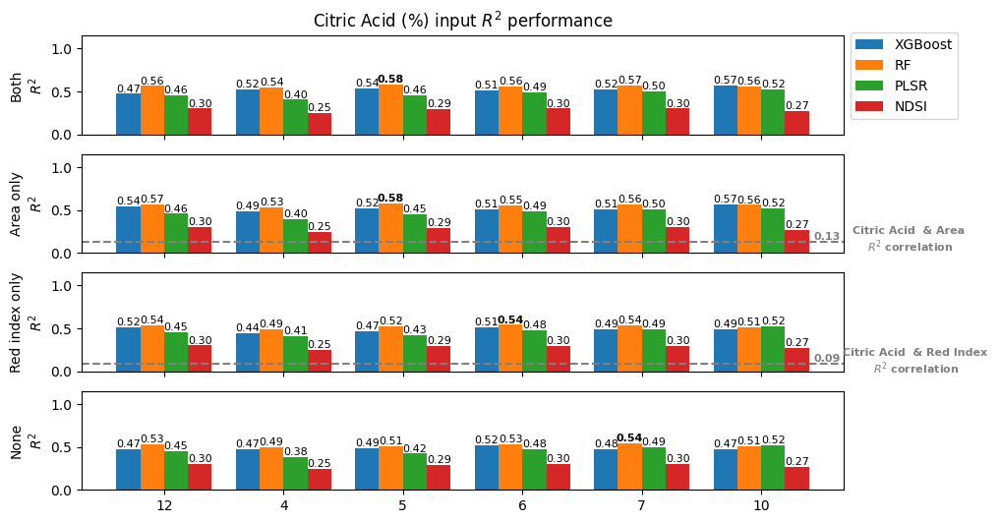

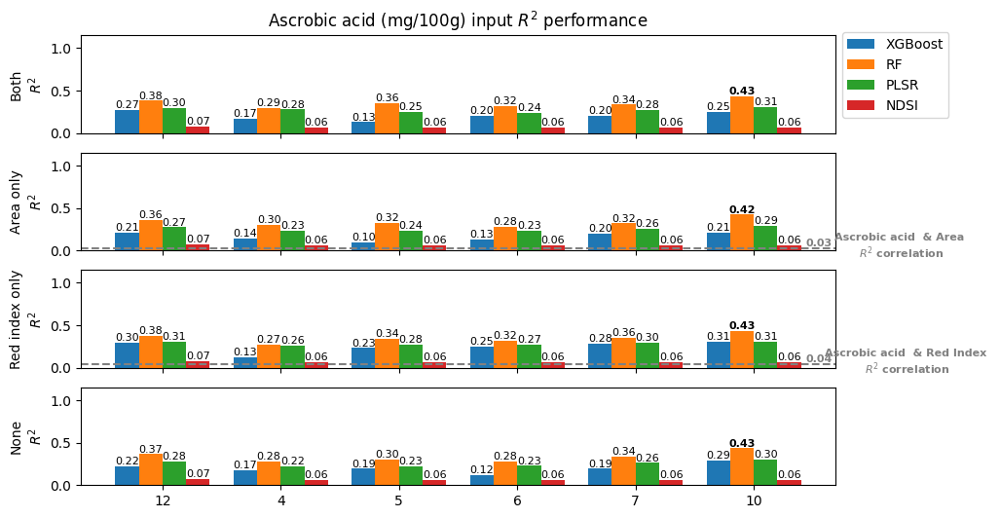

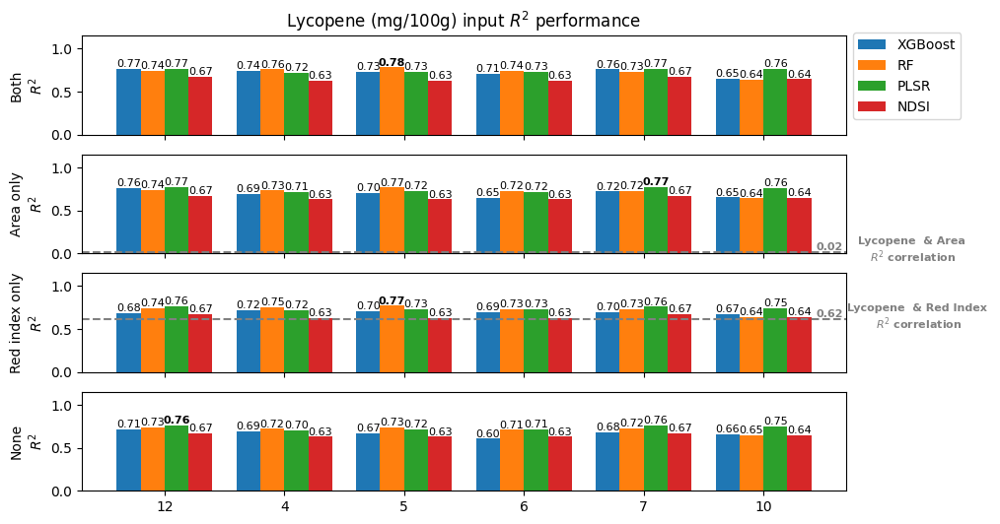

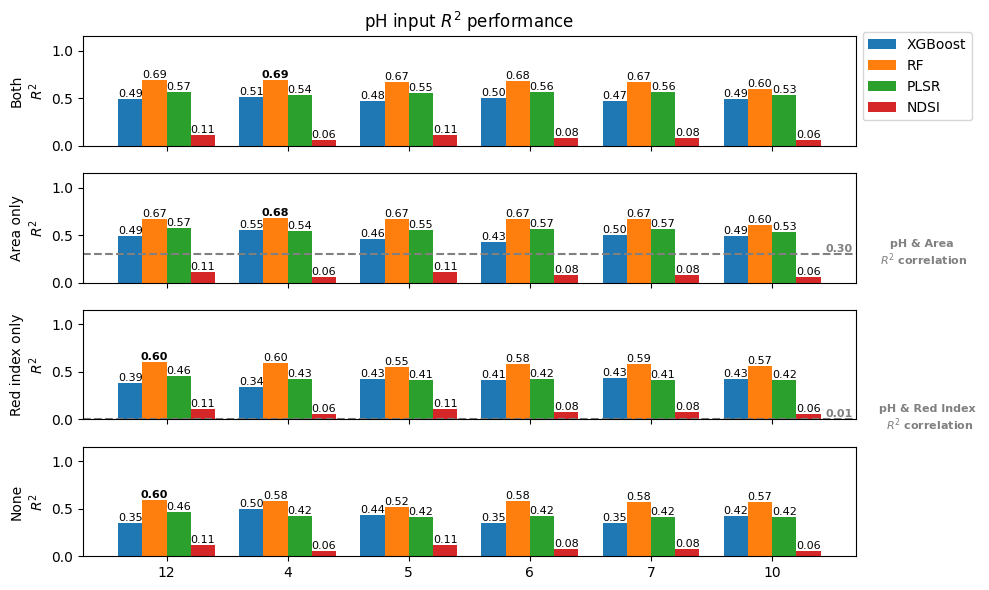

In [ ]:
folder_path = '/content/drive/MyDrive/Shared_tomato/Eitan/ML_models'
results_file = f'{folder_path}/ML_input_results 29.5.23.csv'
df=pd.read_csv(results_file)

# Assuming df is your DataFrame
df['category'] = np.where(df['Input'].str.contains('area') & df['Input'].str.contains('Red index'), 'Both',
                          np.where(df['Input'].str.contains('area'), 'Area only',
                                   np.where(df['Input'].str.contains('Red index'), 'Red index only', 'None')))

df['key_number'] = df['key'].str.extract('\((.*?)\)', expand=False)

metrics = ['XGBoost', 'RF', 'PLSR','NDSI']
metric_width = 0.8 / len(metrics)  # adjust the width of the bars so that they fit within each group
area_corrs=area_red_index_corr( tomato_list,area_corr=True)
red_index_coors=area_red_index_corr( tomato_list,area_corr=False)
for column in df['column'].unique():
    column_data = df[df['column'] == column]

    fig, axs = plt.subplots(4, 1, figsize=(10, 6), sharex=True)

    for i, category in enumerate(['Both', 'Area only', 'Red index only', 'None']):
        category_data = column_data[column_data['category'] == category]
        indices = range(len(category_data))
        for j, metric in enumerate(metrics):
            bar_positions = [index + j * metric_width for index in indices]
            bars = axs[i].bar(bar_positions, category_data[metric], width=metric_width, label=metric)

            # Label each bar with the value
            for bar in bars:
                height = bar.get_height()
                text_format = '{:.2f}' if height < 1 else '{:.1f}'  # Format for labels < 1 and >= 1
                text = text_format.format(height)
                axs[i].text(bar.get_x() + bar.get_width() / 2, height, text,
                            ha='center', va='bottom', weight='bold' if height == np.array(category_data[metrics]).max() else 'normal',fontsize=8)
        col= remove_parentheses(column)
        if category=='Area only':

          axs[i].axhline(area_corrs[column], color='grey', linestyle='--')
          axs[i].text(6.55, area_corrs[column]-0.15, f'{col} & Area \n$R^2$ correlation',
                            ha='center', va='bottom',color='grey', weight='bold',fontsize=8)
          axs[i].text(5.85, area_corrs[column], f'{area_corrs[column]:0.2f}',
                  ha='center', va='bottom',color='grey', weight='bold',fontsize=8)
        if category=='Red index only':
          axs[i].axhline(red_index_coors[column], color='grey', linestyle='--')
          axs[i].text(6.6, red_index_coors[column]-0.15, f'{col} & Red Index \n$R^2$ correlation',
                            ha='center', va='bottom',color='grey', weight='bold',fontsize=8)
          axs[i].text(5.85, red_index_coors[column], f'{red_index_coors[column]:0.2f}',
                  ha='center', va='bottom',color='grey', weight='bold',fontsize=8)


        axs[i].set_ylabel(category+'\n$R^2$')
        axs[i].set_ylim(0,1.15)
        axs[i].set_xticks([i+0.3 for i in indices])
        axs[i].set_xticklabels(category_data['key_number'])
    axs[0].legend(bbox_to_anchor=(1.0, 1.10))

    axs[0].set_title(column+' input $R^2$ performance')

plt.tight_layout()
plt.show()

In [ ]:
folder_path = '/content/drive/MyDrive/Shared_tomato/Eitan/ML_models'
results_file = f'{folder_path}/ML_input_results 29.5.23.csv'
df=pd.read_csv(results_file)
df

,Input,column,XGBoost,XGBoost RMSE,RF,RF RMSE,PLSR,PLSR RMSE,key,NDSI
0,"['NDSI (140, 150)', 'NDSI (54, 127)', 'NDSI (7...",Weight (g),0.924865,1.601658,0.939848,1.433091,0.947607,1.348936,NDSI Local Maxima(12),0.217251
1,"['NDSI (140, 150)', 'NDSI (54, 127)', 'NDSI (7...",Firmness,0.854865,0.655063,0.882545,0.589294,0.859901,0.647137,NDSI Local Maxima(12),0.748630
2,"['NDSI (140, 150)', 'NDSI (54, 127)', 'NDSI (7...",TSS,0.487868,0.273509,0.702448,0.208479,0.568487,0.254391,NDSI Local Maxima(12),0.356700
3,"['NDSI (140, 150)', 'NDSI (54, 127)', 'NDSI (7...",Citric Acid (%),0.472605,0.166034,0.563586,0.151036,0.456429,0.170183,NDSI Local Maxima(12),0.301642
4,"['NDSI (140, 150)', 'NDSI (54, 127)', 'NDSI (7...",Ascrobic acid (mg/100g),0.270070,1.024886,0.380781,0.943967,0.298221,1.010336,NDSI Local Maxima(12),0.074536
...,...,...,...,...,...,...,...,...,...,...
163,"['NDSI (10, 150)', 'NDSI (0, 94)', 'NDSI (150,...",TSS,0.626332,0.233627,0.706236,0.207148,0.614240,0.245184,manual band selection(10),0.248390
164,"['NDSI (10, 150)', 'NDSI (0, 94)', 'NDSI (150,...",Citric Acid (%),0.468798,0.166633,0.510790,0.159911,0.520976,0.160674,manual band selection(10),0.271059
165,"['NDSI (10, 150)', 'NDSI (0, 94)', 'NDSI (150,...",Ascrobic acid (mg/100g),0.289573,1.011101,0.434158,0.902366,0.298395,1.013970,manual band selection(10),0.062116
166,"['NDSI (10, 150)', 'NDSI (0, 94)', 'NDSI (150,...",Lycopene (mg/100g),0.658292,0.720903,0.645089,0.734698,0.746933,0.639277,manual band selection(10),0.644064


/usr/local/lib/python3.10/dist-packages/numpy/lib/arraysetops.py:270: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  ar = np.asanyarray(ar)


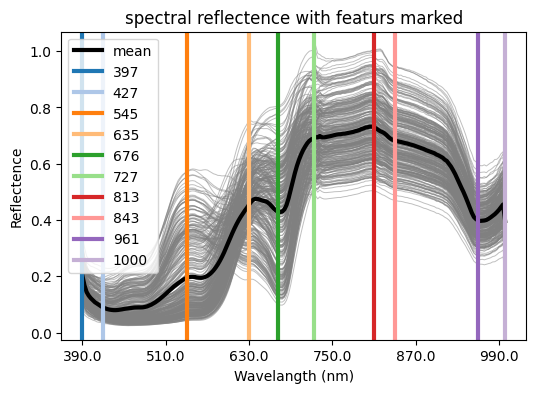

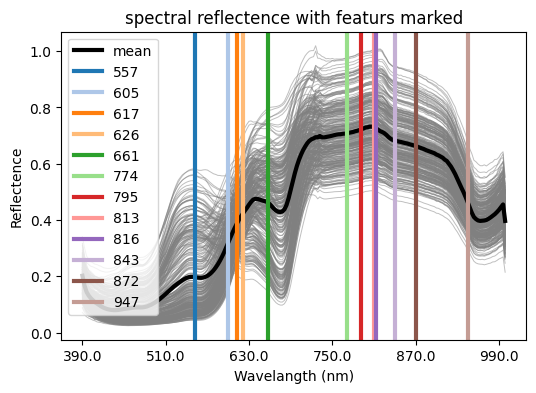

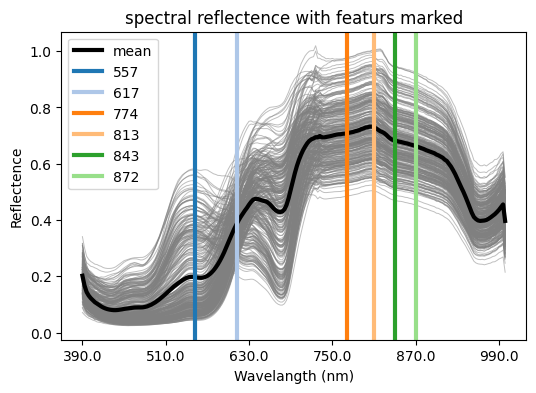

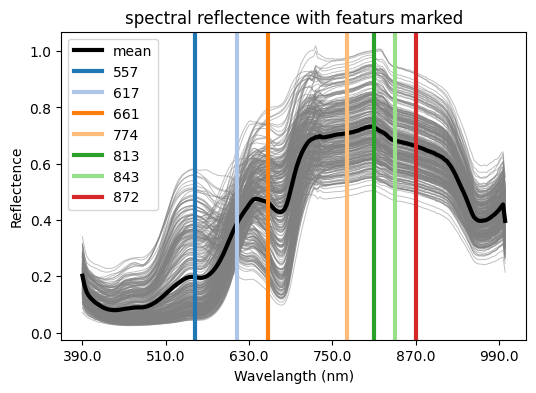

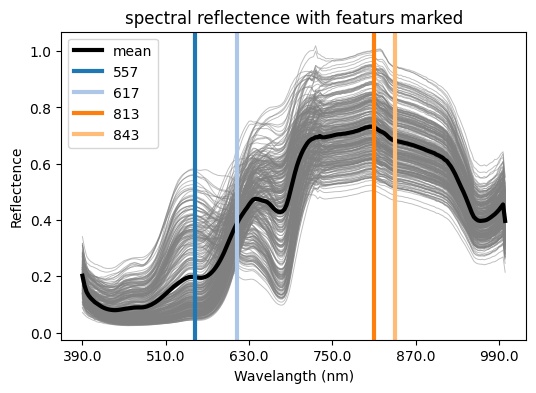

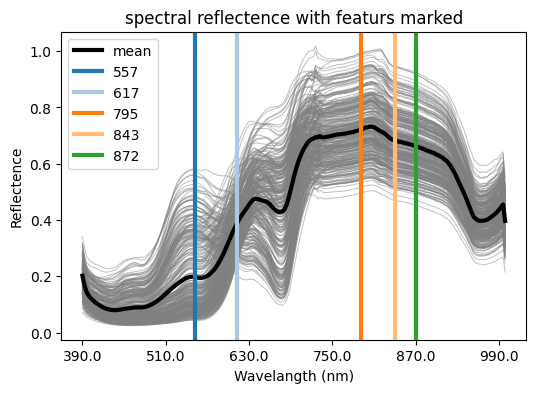

In [ ]:
input_bands=df['Input']
input_bands=[i.replace('NDSI ','').replace('[','').replace(']','') for i in input_bands]
input_bands=[i.replace(", 'area(cm^2)'",'').replace(", 'Red index'",'').replace("'","") for i in input_bands]
input_bands=[i[:-1].replace(', (','').replace('(','').split(')') for i in input_bands]
input_bands=[[(int(j.split(', ')[0]),int(j.split(', ')[1])) for j in i] for i in np.unique(input_bands)]
for i in [np.unique(i) for i in input_bands ]:
  plot_spectral_feturs(TomatoList([harvest_2]),i)

##plot feature importence

RandomForest Weight (g) model:
train stats: 
 std=56.332
 mean=107.030
 CV(std/mean)=0.526
test stats: 
 std=60.748
 mean=107.445
 CV(std/mean)=0.565


XGBoost Weight (g) model:
train stats: 
 std=56.332
 mean=107.030
 CV(std/mean)=0.526
test stats: 
 std=60.748
 mean=107.445
 CV(std/mean)=0.565


PLSR Weight (g) mode:
train stats: 
 std=56.332
 mean=107.030
 CV(std/mean)=0.526
test stats: 
 std=60.748
 mean=107.445
 CV(std/mean)=0.565




<ipython-input-111-543b00105b60>:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  cultivar_data = data[data_df['cultivar'] == label]


0.09229971207211671
0.13989906099949329
0.11873083582366994
0.07558297601879144
0.06593203911299719
0.1361703485941073


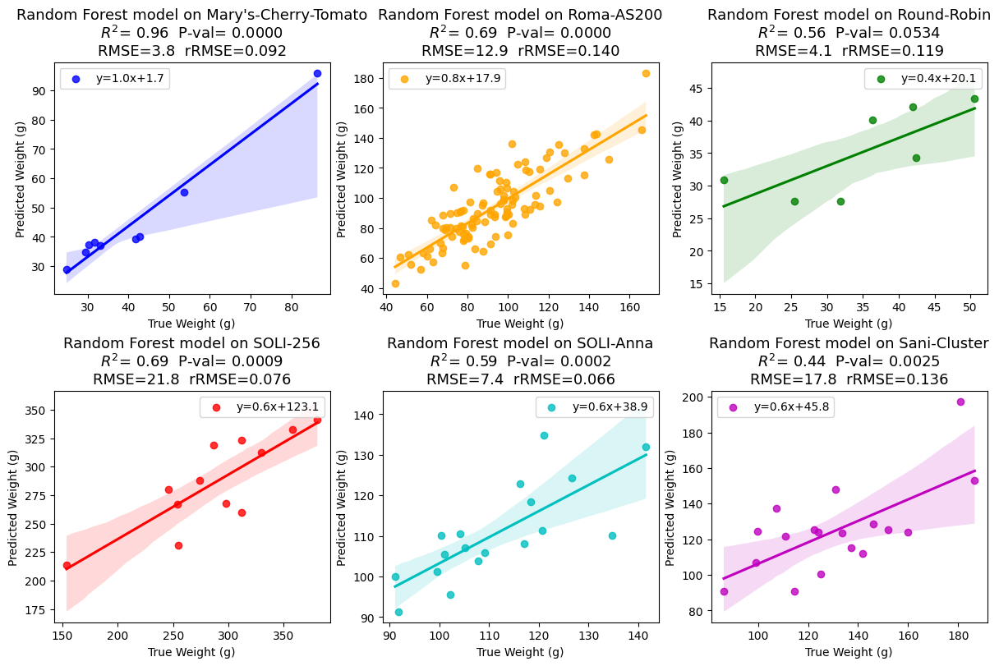

RandomForest Firmness model:
train stats: 
 std=10.657
 mean=42.583
 CV(std/mean)=0.250
test stats: 
 std=11.253
 mean=42.577
 CV(std/mean)=0.264


XGBoost Firmness model:
train stats: 
 std=10.657
 mean=42.583
 CV(std/mean)=0.250
test stats: 
 std=11.253
 mean=42.577
 CV(std/mean)=0.264


PLSR Firmness mode:
train stats: 
 std=10.657
 mean=42.583
 CV(std/mean)=0.250
test stats: 
 std=11.253
 mean=42.577
 CV(std/mean)=0.264




<ipython-input-111-543b00105b60>:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  cultivar_data = data[data_df['cultivar'] == label]


0.10543397385989506
0.08361848251907557
0.11619348641132289
0.07440920684095043
0.04080533466793181
0.07531544873744676


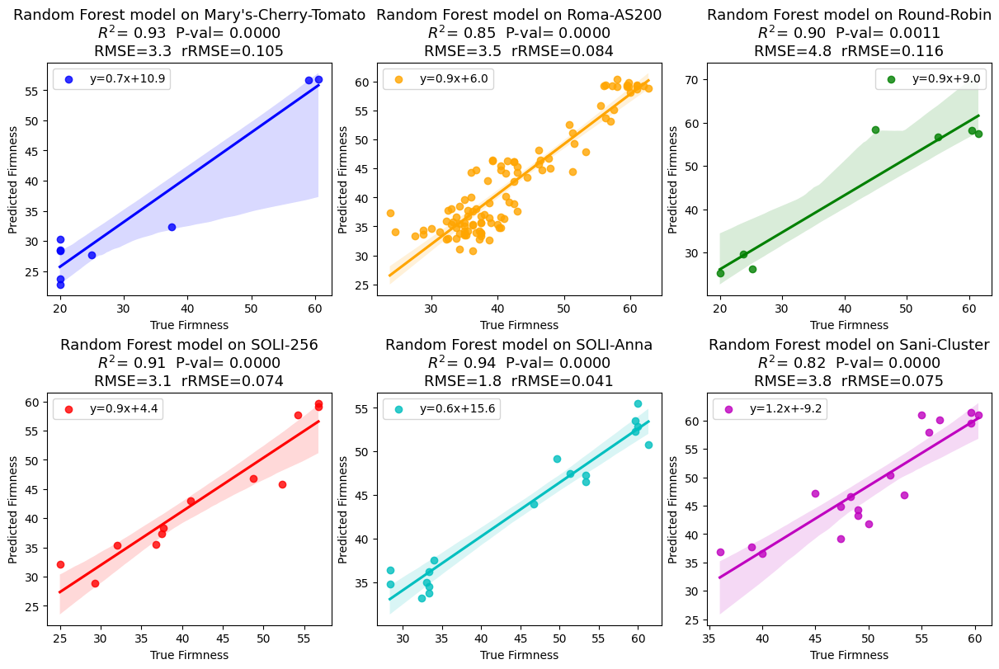

RandomForest TSS model:
train stats: 
 std=0.955
 mean=4.426
 CV(std/mean)=0.216
test stats: 
 std=0.800
 mean=4.356
 CV(std/mean)=0.184


XGBoost TSS model:
train stats: 
 std=0.955
 mean=4.426
 CV(std/mean)=0.216
test stats: 
 std=0.800
 mean=4.356
 CV(std/mean)=0.184


PLSR TSS mode:
train stats: 
 std=0.955
 mean=4.426
 CV(std/mean)=0.216
test stats: 
 std=0.800
 mean=4.356
 CV(std/mean)=0.184




<ipython-input-111-543b00105b60>:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  cultivar_data = data[data_df['cultivar'] == label]


0.06769702856300769
0.06701989389101337
0.05906540959031973
0.017634961251087242
0.06330771076053615
0.036276309388205565


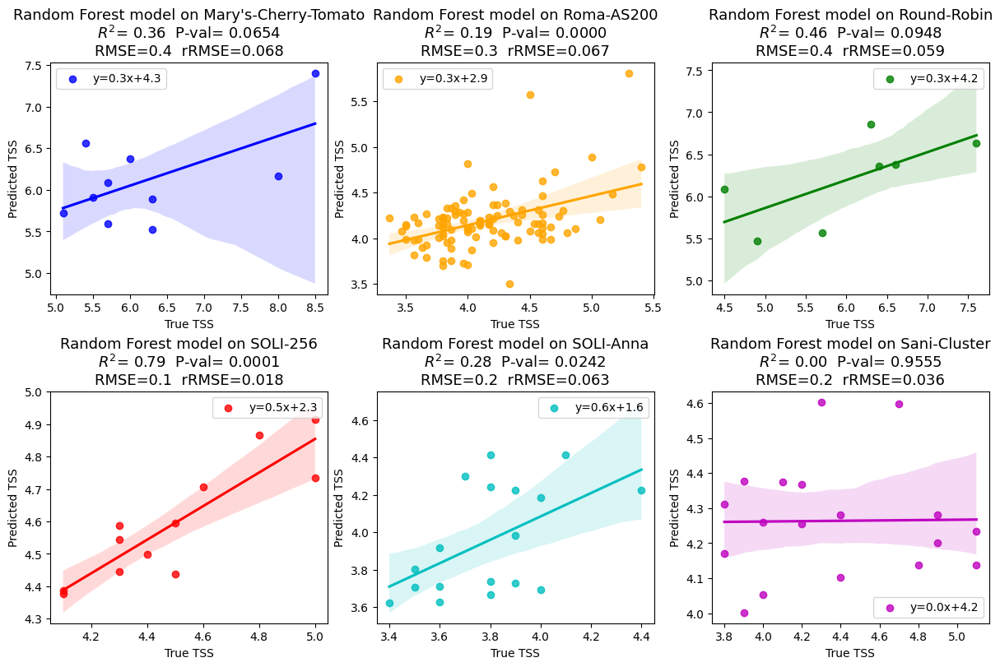

RandomForest Citric Acid (%) model:
train stats: 
 std=0.138
 mean=0.396
 CV(std/mean)=0.348
test stats: 
 std=0.146
 mean=0.406
 CV(std/mean)=0.360


XGBoost Citric Acid (%) model:
train stats: 
 std=0.138
 mean=0.396
 CV(std/mean)=0.348
test stats: 
 std=0.146
 mean=0.406
 CV(std/mean)=0.360


PLSR Citric Acid (%) mode:
train stats: 
 std=0.138
 mean=0.396
 CV(std/mean)=0.348
test stats: 
 std=0.146
 mean=0.406
 CV(std/mean)=0.360




<ipython-input-111-543b00105b60>:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  cultivar_data = data[data_df['cultivar'] == label]


0.20337744560094848
0.09273037701445706
0.12650113984544523
0.0548947144247106
0.05740550985187298
0.08128313165764418


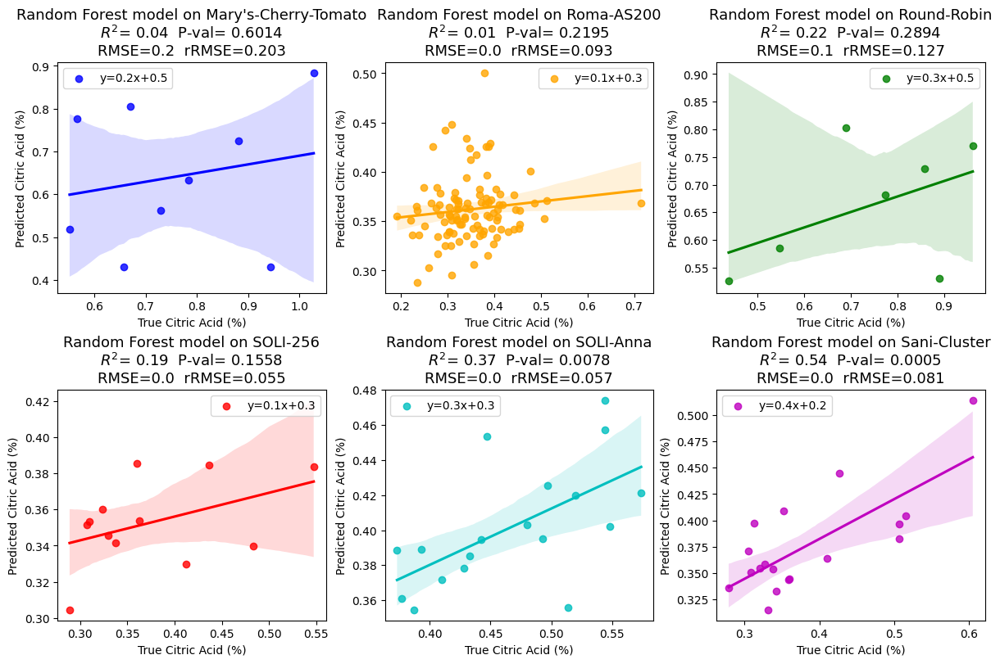

RandomForest Ascrobic acid (mg/100g) model:
train stats: 
 std=4.723
 mean=12.741
 CV(std/mean)=0.371
test stats: 
 std=4.347
 mean=13.054
 CV(std/mean)=0.333


XGBoost Ascrobic acid (mg/100g) model:
train stats: 
 std=4.723
 mean=12.741
 CV(std/mean)=0.371
test stats: 
 std=4.347
 mean=13.054
 CV(std/mean)=0.333


PLSR Ascrobic acid (mg/100g) mode:
train stats: 
 std=4.723
 mean=12.741
 CV(std/mean)=0.371
test stats: 
 std=4.347
 mean=13.054
 CV(std/mean)=0.333




<ipython-input-111-543b00105b60>:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  cultivar_data = data[data_df['cultivar'] == label]


0.11436933034839379
0.13065004252243742
0.12549039439537493
0.12321293922046718
0.12131367083264598
0.062454610857391755


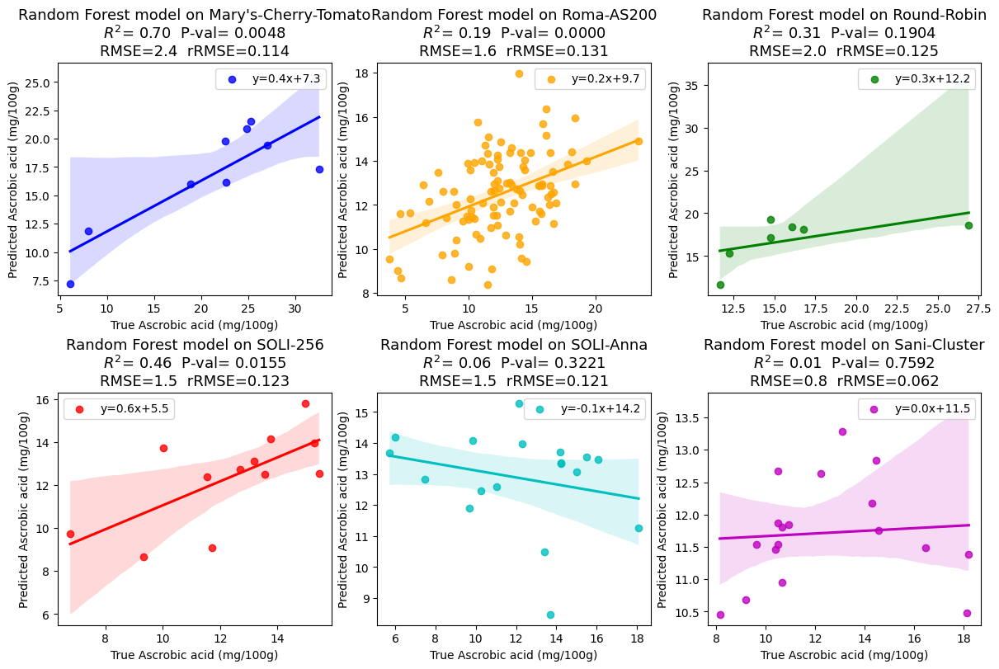

RandomForest Lycopene (mg/100g) model:
train stats: 
 std=2.560
 mean=3.510
 CV(std/mean)=0.729
test stats: 
 std=2.208
 mean=3.175
 CV(std/mean)=0.695


XGBoost Lycopene (mg/100g) model:
train stats: 
 std=2.560
 mean=3.510
 CV(std/mean)=0.729
test stats: 
 std=2.208
 mean=3.175
 CV(std/mean)=0.695


PLSR Lycopene (mg/100g) mode:
train stats: 
 std=2.560
 mean=3.510
 CV(std/mean)=0.729
test stats: 
 std=2.208
 mean=3.175
 CV(std/mean)=0.695




<ipython-input-111-543b00105b60>:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  cultivar_data = data[data_df['cultivar'] == label]


0.33071925735059826
0.34293724862663005


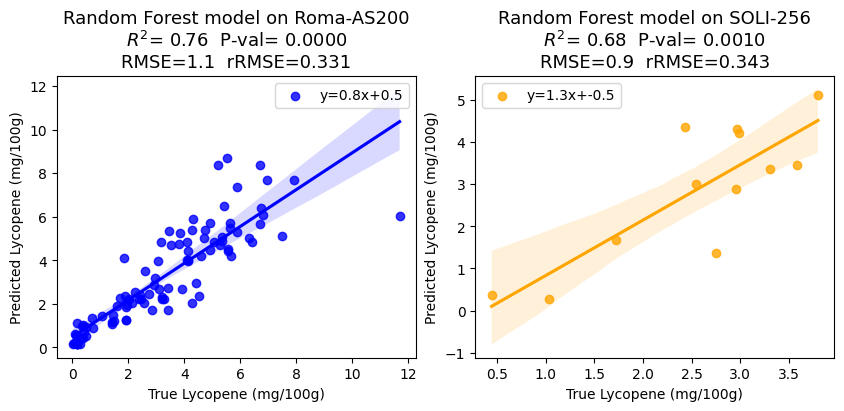

RandomForest pH model:
train stats: 
 std=0.376
 mean=4.706
 CV(std/mean)=0.080
test stats: 
 std=0.349
 mean=4.708
 CV(std/mean)=0.074


XGBoost pH model:
train stats: 
 std=0.376
 mean=4.706
 CV(std/mean)=0.080
test stats: 
 std=0.349
 mean=4.708
 CV(std/mean)=0.074


PLSR pH mode:
train stats: 
 std=0.376
 mean=4.706
 CV(std/mean)=0.080
test stats: 
 std=0.349
 mean=4.708
 CV(std/mean)=0.074




<ipython-input-111-543b00105b60>:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  cultivar_data = data[data_df['cultivar'] == label]


0.01929092145866317
0.018759654439498157
0.01232045038449743
0.06012609012869262
0.022228076614369954
0.01898066161367204


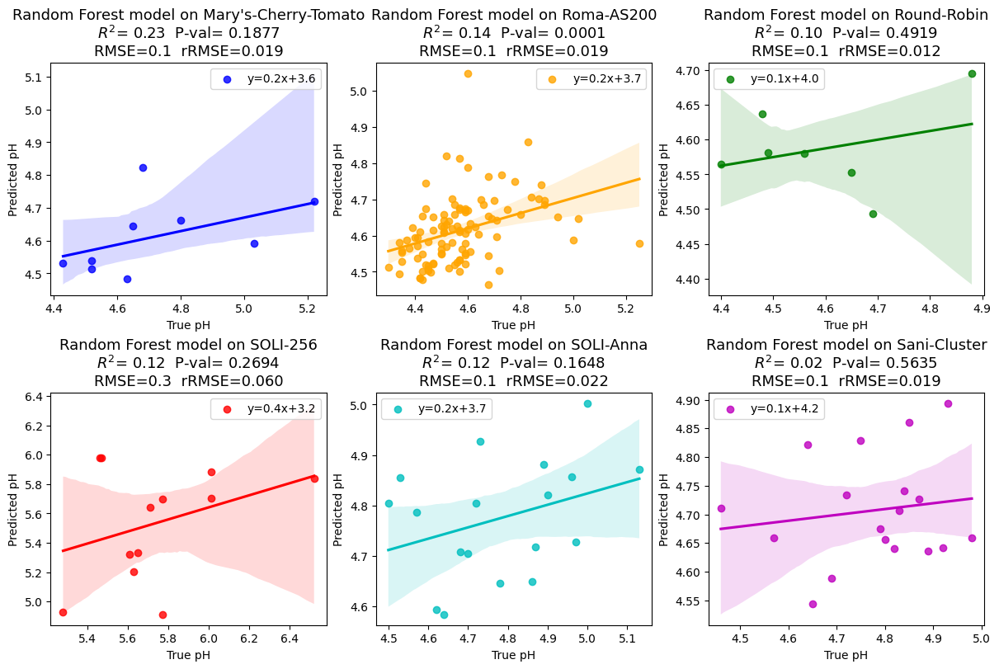

,column,XGBoost R^2,XGBoost RMSE,RF R^2,RF RMSE,PLSR R^2,PLSR RMSE
0,Firmness,0.927709,0.151564,0.930330,0.148792,0.939466,0.140800
1,area(cm^2),0.838173,0.106006,0.857146,0.099599,0.837702,0.107009
2,TSS,0.489398,0.130851,0.678845,0.103775,0.579268,0.119865
3,Citric Acid (%),0.523396,0.247801,0.557317,0.238820,0.420805,0.275319
4,Ascrobic acid (mg/100g),0.188052,0.299173,0.346851,0.268326,0.275583,0.284065
5,Lycopene (mg/100g),0.665181,0.400468,0.741700,0.351743,0.722301,0.365206
6,pH,0.499550,0.052272,0.673374,0.042229,0.510082,0.051812


In [ ]:
feature_importances={}
scaler=MinMaxScaler()
r_2_rf,rmse_rf,r_2_xg,rmse_xg,r_plsr,rmse_plsr=np.zeros(7),np.zeros(7),np.zeros(7),np.zeros(7),np.zeros(7),np.zeros(7)


for i,col in enumerate(tomato_list.lab_results_df.columns.drop('area(cm^2)')):
  rs_rf,rs_xgb,rs_plsr=[],[],[]

  # x_df,y_df,feature_names,cultivar=model_input(tomato_list,col,curent_bands)
  x_df,y_df, feature_names,cultivar=model_input_v2(tomato_list,col,NDSI_bands)
  X_train, X_test, y_train, y_test = get_train_test_split(col,x_df,y_df)

  # X_train, X_test, y_train, y_test = train_test_split(x_df, y_df, test_size=0.3, random_state=random_state[col+'_RF'].idxmax(),stratify=cultivar)
  # save_new_split(col,train_split,test_split)

  print(f'RandomForest {col} model:')
  print(f'train stats: \n std={y_train.std():.03f}\n mean={y_train.mean():.03f}\n CV(std/mean)={y_train.std()/y_train.mean():.03f}')
  print(f'test stats: \n std={y_test.std():.03f}\n mean={y_test.mean():.03f}\n CV(std/mean)={y_test.std()/y_test.mean():.03f}\n\n')
  # Train and evaluate a random forest model
  rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
  rf_model.fit(X_train, y_train)
  y_pred = rf_model.predict(X_test)
  r_2_rf[i]+=r2_score(y_test, y_pred)
  rmse_rf[i]+=np.sqrt(mean_squared_error(y_test, y_pred))/y_test.mean()
  feature_importances[col + '_RF'] = rf_model.feature_importances_
  # Calculate R^2 and RMSE for each output column

  # Train and evaluate an XGBoost model
  XGB_model = XGBRegressor(objective ='reg:squarederror',n_estimators=100, random_state=42)
  print(f'XGBoost {col} model:')
  print(f'train stats: \n std={y_train.std():.03f}\n mean={y_train.mean():.03f}\n CV(std/mean)={y_train.std()/y_train.mean():.03f}')
  print(f'test stats: \n std={y_test.std():.03f}\n mean={y_test.mean():.03f}\n CV(std/mean)={y_test.std()/y_test.mean():.03f}\n\n')
  XGB_model.fit(X_train, y_train)
  y_pred = XGB_model.predict(X_test)
  r_2_xg[i]+=r2_score(y_test, y_pred)
  rmse_xg[i]+=np.sqrt(mean_squared_error(y_test, y_pred))/y_test.mean()
  feature_importances[col + '_XGB'] = XGB_model.feature_importances_
  # Define PLS object
  plsr_model = PLSRegression(n_components=7, scale=True)
  print(f'PLSR {col} mode:')
  print(f'train stats: \n std={y_train.std():.03f}\n mean={y_train.mean():.03f}\n CV(std/mean)={y_train.std()/y_train.mean():.03f}')
  print(f'test stats: \n std={y_test.std():.03f}\n mean={y_test.mean():.03f}\n CV(std/mean)={y_test.std()/y_test.mean():.03f}\n\n')
  plsr_model.fit(X_train, y_train)
  y_pred = plsr_model.predict(X_test)
  slope, intercept, r_value, p_value, std_err = stats.linregress(y_test, y_pred[:,0])
  r_plsr[i]+=r_value**2
  rmse_plsr[i]+=np.sqrt(mean_squared_error(y_test, y_pred))/y_test.mean()
  # feature_importances[col + '_PLSR'] = plsr_model.feature_importances_
  # Calculate R^2 and RMSE for each output column
  # y_pred = XGB_model.predict(x_df)
  # data_df,y_df,feature_names,cultivar=model_input(tomato_list,col,curent_bands,scale=False)
  data_df,y_df, feature_names,cultivar=model_input_v2(tomato_list,col,NDSI_bands)

  color=['b','orange','g','r','c','m','c']
  model_dict={'XGBoost model':XGB_model,'Random Forest model': rf_model, 'PLSR model':plsr_model}
  # sns.lmplot(x='True Weight (g)', y='Predicted Weight (g)', hue='Cultivar',palette=color, data=data)#x_estimator=np.mean
  # for model_name,model in model_dict.items():
  y_pred = rf_model.predict(X_test)
  model_name='Random Forest model'
  data_df['cultivar']=cultivar
  data_dict={f'True {col}':y_test,f'Predicted {col}':y_pred, 'cultivar':cultivar[y_test.index]}
  data=pd.DataFrame(data_dict)
  # Calculate the number of rows and columns for the subplot grid
  n_plots = len(np.unique(cultivar))
  if n_plots>6:
    n_cols = 4
  else: n_cols = 3 # You can adjust this value based on your preferences
  n_rows = int(np.ceil(n_plots / n_cols))

  # Create the subplot grid
  fig, axes = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 4 * n_rows), constrained_layout=True)
  axes = axes.ravel()  # Flatten the axes array

  # Plot the data
  for i, (label, c) in enumerate(zip(np.unique(cultivar), color)):
      cultivar_data = data[data_df['cultivar'] == label]
      slope, intercept, r_value, p_value, std_err = stats.linregress(cultivar_data[f'True {col}'], cultivar_data[f'Predicted {col}'])
      sns.regplot(x=f'True {col}', y=f'Predicted {col}', data=cultivar_data, color=c, ax=axes[i], label="y={0:.1f}x+{1:.1f}".format(slope, intercept))

      rmse = np.sqrt(((cultivar_data[f'Predicted {col}'] - (intercept + (slope * cultivar_data[f'True {col}'])))**2).mean())
      rrmse = rmse / cultivar_data[f'True {col}'].mean()
      print(rrmse)

      axes[i].set_title(f"{model_name} on {label}\n$R^2$= {r_value**2:.2f}  P-val= {p_value:.4f}\nRMSE={rmse:.1f}  rRMSE={rrmse:.3f}", fontsize=13)
      axes[i].legend()

  # Hide the remaining empty plots if any
  for j in range(i+1, n_rows * n_cols):
      axes[j].set_visible(False)

  # Display the final plot
  plt.show()
data_dict={'column':tomato_list.lab_results_df.columns[1:],'XGBoost R^2':r_2_xg,'XGBoost RMSE':rmse_xg,'RF R^2':r_2_rf,'RF RMSE':rmse_rf,'PLSR R^2':r_plsr,'PLSR RMSE':rmse_plsr}
ML_pca_df=pd.DataFrame(data_dict)
folder_path='/content/drive/MyDrive/Shared_tomato/Eitan/ML_models'

ML_pca_df



save the indexing of the train test split

In [ ]:
folder_path='/content/drive/MyDrive/Shared_tomato/Eitan/ML_models'
feature_importances_pca=pd.DataFrame(feature_importances)
feature_importances_pca.to_csv(f'{folder_path}/feature_importances_pca.csv')
feature_importances_pca

,Weight (g)_RF,Weight (g)_XGB,Weight (g)_PLSR,Firmness_RF,Firmness_XGB,Firmness_PLSR,TSS_RF,TSS_XGB,TSS_PLSR,Citric Acid (%)_RF,...,Citric Acid (%)_PLSR,Ascrobic acid (mg/100g)_RF,Ascrobic acid (mg/100g)_XGB,Ascrobic acid (mg/100g)_PLSR,Lycopene (mg/100g)_RF,Lycopene (mg/100g)_XGB,Lycopene (mg/100g)_PLSR,pH_RF,pH_XGB,pH_PLSR
0,0.007437,0.002198,0.002198,0.013264,0.003600,0.003600,0.038080,0.015577,0.015577,0.046129,...,0.027334,0.057482,0.022778,0.022778,0.014296,0.005819,0.005819,0.024100,0.017817,0.017817
1,0.005719,0.003933,0.003933,0.015373,0.007638,0.007638,0.043883,0.027447,0.027447,0.043893,...,0.055334,0.052641,0.049543,0.049543,0.017484,0.011647,0.011647,0.030657,0.028931,0.028931
2,0.010384,0.007264,0.007264,0.033999,0.015809,0.015809,0.062185,0.046432,0.046432,0.034786,...,0.033564,0.047122,0.039730,0.039730,0.023826,0.019612,0.019612,0.038419,0.043247,0.043247
3,0.007568,0.008238,0.008238,0.007139,0.007882,0.007882,0.022912,0.011982,0.011982,0.028348,...,0.035501,0.032198,0.036556,0.036556,0.014335,0.014457,0.014457,0.127486,0.236084,0.236084
4,0.007987,0.014372,0.014372,0.009069,0.006810,0.006810,0.019493,0.027122,0.027122,0.018342,...,0.019185,0.030012,0.033754,0.033754,0.014327,0.006004,0.006004,0.109239,0.287081,0.287081
5,0.006678,0.009081,0.009081,0.009754,0.005225,0.005225,0.019351,0.014464,0.014464,0.034703,...,0.030093,0.039833,0.053399,0.053399,0.013417,0.011075,0.011075,0.039453,0.047332,0.047332
6,0.007726,0.006150,0.006150,0.023031,0.013476,0.013476,0.063358,0.048420,0.048420,0.091336,...,0.052359,0.160273,0.121984,0.121984,0.071798,0.045837,0.045837,0.042539,0.032784,0.032784
7,0.022229,0.010218,0.010218,0.021322,0.011353,0.011353,0.073811,0.049797,0.049797,0.143912,...,0.130218,0.080599,0.065303,0.065303,0.036593,0.014592,0.014592,0.097892,0.056009,0.056009
8,0.005002,0.006885,0.006885,0.020873,0.020172,0.020172,0.089382,0.121220,0.121220,0.090474,...,0.111189,0.135009,0.116555,0.116555,0.126762,0.071983,0.071983,0.035301,0.032484,0.032484
9,0.003177,0.004032,0.004032,0.699451,0.449977,0.449977,0.114527,0.200497,0.200497,0.054624,...,0.074977,0.105721,0.137175,0.137175,0.222174,0.202248,0.202248,0.039827,0.034713,0.034713


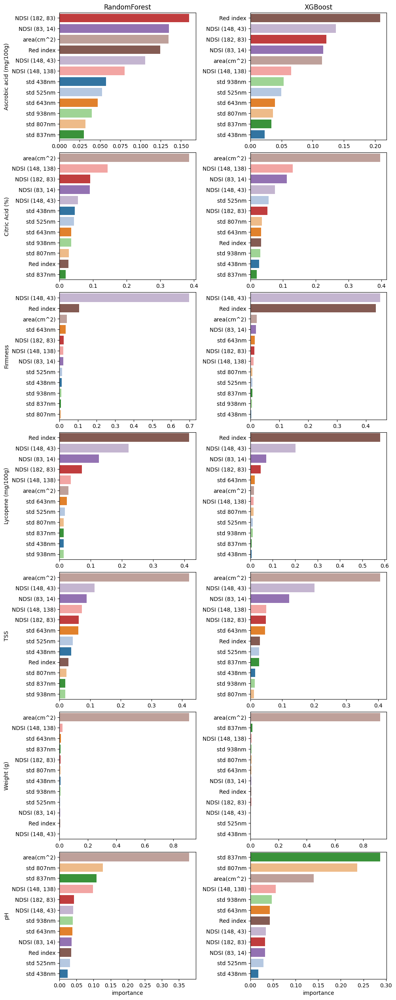

In [ ]:
# def plot_feature_importence(feature_importances,model_names=['RF','XGB']):
# global wave_band_table
# x_df,y_df,feature_names,cultivar=model_input(tomato_list,col,curent_bands)
folder_path='/content/drive/MyDrive/Shared_tomato/Eitan/ML_models'
feature_importances_pca=pd.DataFrame(feature_importances)
feature_importances_pca.to_csv(f'{folder_path}/feature_importances_pca.csv')
x_df,y_df, feature_names,cultivar=model_input_v2(tomato_list,col,NDSI_bands)
features_ml=feature_names
#orgenizing data for ploting
stat_num=len(tomato_list.lab_results_df.columns[:-1])
model_names=['RF','XGB']
importances=pd.DataFrame(columns=['importance','wavelength','stat','model'])
for col in tomato_list.lab_results_df.columns.drop('area(cm^2)'):

    for name in model_names:
        featurs=feature_importances_pca[[i for i in feature_importances_pca.columns if col in i and name in i]].copy()
        for i in featurs.columns:


            # feature_names=[f'{wave_band_table[int(i)]:0.0f}nm ({band_to_group[int(i)]})' for i in features_ml if len(i)<4]
            # feature_names+=[f"{i.split(' ')[0]} {wave_band_table[int(i.split(' ')[1])]:0.0f}nm " for i in features_ml if 'std' in i]
            # feature_names+=[i for i in features_ml if 'std' not in i and len(i)>3]
            featurs['wavelength']=feature_names

            if 'RF' in i:
                model='RandomForest'
                featurs = featurs.rename(columns={i:'importance'})
                i=i.replace('_RF','')
            elif 'XGB' in i:
                model='XGBoost'
                featurs = featurs.rename(columns={i:'importance'})
                i= i.replace('_XGB','')


            model=[model for i in feature_names]
            model_df=pd.DataFrame({'model':model})
            importence1=pd.concat([featurs['importance'],
                                    featurs['wavelength'],
                                    model_df,
                                    pd.DataFrame({'stat':[i for Y in feature_names]})],
                                  axis=1)
            importances=pd.concat([importances,importence1])

# colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd',
#           '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
palette = plt.get_cmap('tab20')
palette = [palette(i) for i in range(len(feature_names))]
color_palette={}
for i,c in zip(feature_names,palette):
  color_palette[i] = c
# Create a figure and axis for each facet
fig, axes = plt.subplots(nrows=stat_num, ncols=len(model_names), figsize=(9,25 ))
fig.tight_layout()
# Flatten the array of axes
axes = axes.flatten()

# Iterate over each facet
for i, (stat, model) in enumerate(importances.groupby(['stat','model'])):
    ax = axes[i]
    data = model.sort_values(by='importance', ascending=True)
    data['color']=[color_palette[i] for i in data['wavelength']]
    sns.barplot(data=data, y='wavelength', x='importance',palette=color_palette, ax=ax)
    ax.set_xlabel('')
    ax.set_ylabel('')
    if (i)%len(model_names)==0:
        ax.set_ylabel(stat[0])
    if (i)<len(model_names):
        ax.set_title(f"{stat[1]}")
    if i>=(stat_num-1)*len(model_names):
        ax.set_xlabel('importance')
#     ax.set_ylabel('Wavelength')
    ax.invert_yaxis()
    # ax.legend().set_visible(False)
    y = ax.get_ylim()[1] + 1
    ax.set_yticklabels(data['wavelength'], rotation=0,position=(0, -0.9))

fig.subplots_adjust( wspace=0.4, hspace=0.1)
# axes[-1].set_visible(False)
# axes[-2].set_visible(False)
# handles, labels = axes[0].get_legend_handles_labels()
# fig.legend(handles, labels, bbox_to_anchor=(0.8,0.259), fontsize=20)

##ANN model

In [ ]:
r_2,rmse=[],[]
for i,col in enumerate(tomato_list.lab_results_df.columns[:-1]):
  # cultivar,marker_dict=cultivar_column(tomato_list)
  # np_reflectence=np.array(tomato_list.reflectence_df)
  # std=tomato_list.spectral_stats['std'][[str(i) for i in sorted(curent_bands)]]
  # NI=(np_reflectence[:,R_wave]-np_reflectence[:,G_wave])/(np_reflectence[:,G_wave]+np_reflectence[:,R_wave])
  # std.columns=[f'std {i}' for i in sorted(curent_bands)]
  # temp_df=pd.concat([std,tomato_list.tomato_df],axis=1)
  # temp_df['Red index']=NI
  # temp_df['cultivar']=cultivar
  # temp_df=temp_df[temp_df[col]>0]


  # x_df=pd.concat([temp_df.iloc[:,[i+len(std.columns) for i in sorted(curent_bands)]],temp_df[std.columns]],axis=1)
  # x_df.loc[:,'Weight (g)']=temp_df['Weight (g)'].copy()
  # x_df.loc[:,'Red index']=temp_df['Red index'].copy()
  # x_df.columns=[str(i) for i in x_df.columns]
  # y_df=np.array(temp_df.loc[:,col])
  # features_ml=x_df.columns
  # cultivar=temp_df['cultivar'].copy()
  # x_df=np.array(scaler.fit_transform(x_df))
  x_df,y_df,feature_names,cultivar=model_input(tomato_list,col,curent_bands)
  X_train, X_test, y_train, y_test = train_test_split(x_df, y_df, test_size=0.3, random_state=42)
  X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.5, random_state=42)

# Train and evaluate an ANN
  ANN_model = keras.Sequential([
      keras.layers.Dense(205, activation='relu', input_shape=(X_train.shape[1],)),
      keras.layers.Dense(100, activation='relu'),
      keras.layers.Dense(1)
  ])
  ANN_model.compile(loss='mean_squared_error', optimizer='adam')
  history = ANN_model.fit(X_train, y_train, epochs=200, validation_data=(X_val, y_val))
  y_pred = ANN_model.predict(X_test)
  # feature_importances[col + '_ANN'] = ANN_model.feature_importances_
  # Calculate R^2 and RMSE for each output column
  # plt.plot(y_test, y_pred,'o')
  # plt.show()
  r_2+=[r2_score(y_test, y_pred)]
  rmse+=[np.sqrt(mean_squared_error(y_test, y_pred))/y_test.mean()]
  # print(f"ANN Output column {col}:")
  # print(f"R^2: {r2_score(y_test, y_pred)}")
  # print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred))}")
ML_pca_df['ANN R^2']=r_2
ML_pca_df['ANN RMSE']=rmse
ML_pca_df

Text(0.5, 1.0, 'models $R^2$ results\n iterations=100 N=567')

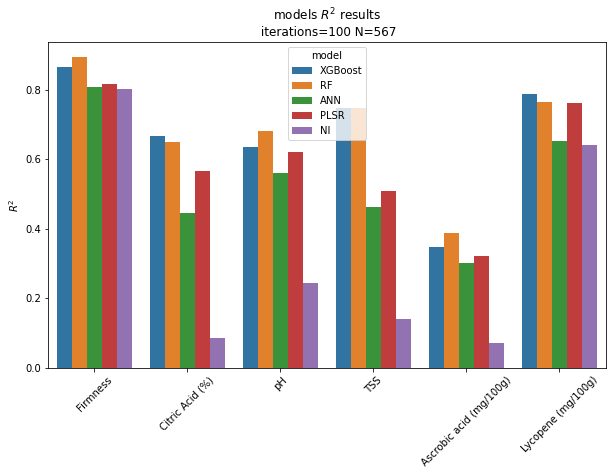

In [ ]:
model_best_r2['ANN']=ML_pca_df['ANN R^2'].copy()
# reshape dataframe
fig, ax = plt.subplots(figsize=(10, 6))
df = model_best_r2.melt(id_vars=["column"],
            value_vars=["XGBoost", "RF","ANN","PLSR", "NI"],
            var_name="model", value_name="R^2")

#create barplot
sns.barplot(x="column", y="R^2", hue="model", data=df,ax=ax)
ax.set_xticklabels(ML_pca_df["column"],rotation=45)
ax.set_ylabel('$R^2$')
ax.set_xlabel('')
ax.set_title(f'models $R^2$ results\n iterations={iter_num} N={len(tomato_list1234.tomato_df.index)}')#' cultivars={len(tomato_list.cultivar_list)} harvests={len(tomato_list.harvest_list)}')


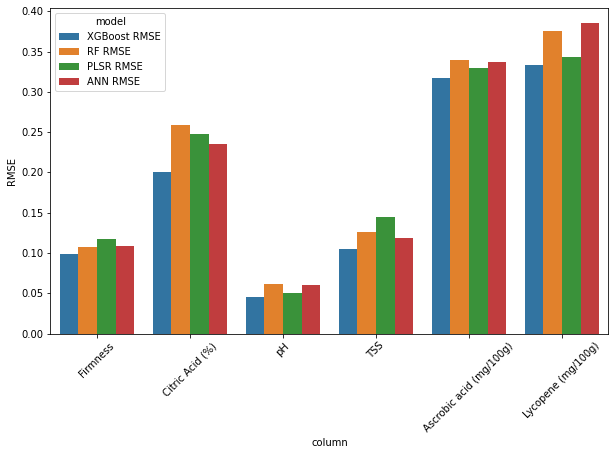

In [ ]:
# reshape dataframe
df = ML_pca_df.melt(id_vars=["column"],
            value_vars=["XGBoost RMSE", "RF RMSE", "PLSR RMSE", "ANN RMSE"],
            var_name="model", value_name="RMSE")
fig, ax = plt.subplots(figsize=(10, 6))
#create barplot
ax=sns.barplot(x="column", y="RMSE", hue="model", data=df)
ax.set_xticklabels(ML_pca_df["column"],rotation=45)
plt.show()

In [ ]:
folder_path='/content/drive/MyDrive/Shared_tomato/Eitan/ML_models'
ML_pca_df.to_csv(f'{folder_path}/ML_pca_R2.csv')
ML_df.to_csv(f'{folder_path}/ML_204b_R2.csv')

In [ ]:
def max_r2_from_NI_PCA(tomato_list)->dict:
  '''function thar receives a tomato list with calculated r_2_dict(from colormap)
      and finds the best R2 for them in the NI model'''
  r_2_map_dict=tomato_list.r_2_dict
  rmse_map_dict=tomato_list.rmse_dict
  rmse,R={},{}
  for k,v in r_2_map_dict.items():
    map=v.copy()
    counter,i=0,0
    b1,b2=1,1
    while  band_to_group[b1]==band_to_group[b2]:
      b1,b2=np.unravel_index(map.argmax(), map.shape)
      if band_to_group[b1]!=band_to_group[b2]:
        R[k]= map[b1,b2]
        rmse[k]=rmse_map_dict[k][b1,b2]
      map[b1,b2]=0
  return R,rmse


In [ ]:
models=[tomato_list12,tomato_list3,tomato_list4, tomato_list1234]

rmse_df=pd.DataFrame(columns=tomato_list3.lab_results_df.columns)
np_R=np.arange(4)

for model in models:
  print(model.harvest_date_list)
  R,rmse=max_r2_from_NI_PCA(model)
  new_row_r=np.array([i for i in R.values()])
  new_row_rmse=np.array([i for i in rmse.values()])
  if np_R.all()==np.arange(4).all():
    np_R=np.array([i for i in R.values()])
    np_rmse=np.array([i for i in rmse.values()])
    length=np_R.shape[0]
    continue
  if new_row_r.shape[0]!=length:
    new_row_r=np.hstack([new_row_r, np.array([-1.0])])
    new_row_rmse=np.hstack([new_row_rmse, np.array([-1.0])])
  np_R = np.vstack([np_R,new_row_r ])
  np_rmse= np.vstack([np_rmse,new_row_rmse ])
R_df=pd.DataFrame(columns=tomato_list3.lab_results_df.columns, data=np_R)
rmse_df=pd.DataFrame(columns=tomato_list3.lab_results_df.columns, data=np_rmse)

[datetime.date(2021, 8, 15), datetime.date(2021, 10, 13)]
[datetime.date(2022, 6, 22)]
[datetime.date(2022, 10, 19)]
[datetime.date(2021, 8, 15), datetime.date(2021, 10, 13), datetime.date(2022, 6, 22), datetime.date(2022, 10, 19)]


In [ ]:
rmse_df.to_csv('/content/drive/MyDrive/spectral idexing corrs/NI_PCA_RMSE.csv')
R_df.to_csv('/content/drive/MyDrive/spectral idexing corrs/NI_PCA_R.csv')
R_df

,Weight (g),Firmness,Citric Acid (%),pH,TSS,Ascrobic acid (mg/100g),Lycopene (mg/100g)
0,0.017194,0.813987,0.008574,0.026650,0.068153,0.111335,0.692675
1,0.318054,0.894769,0.357308,0.332354,0.551523,0.366764,0.857303
2,0.228872,0.927008,0.493484,0.465024,0.256117,0.091418,-1.000000
3,0.108880,0.817554,0.050471,0.137591,0.058055,0.085252,0.640710
